<a href="https://colab.research.google.com/github/markoo26/thehappymountain/blob/main/Prophet_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title 🛠️ Install all required packages
!pip install -q --upgrade prophet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 26.1 MB/s eta 0:00:00


In [ ]:
#@title 🐈 Clone data from Github repository
!git clone https://github.com/PacktPublishing/Forecasting-Time-Series-Data-with-Prophet-Second-Edition.git
!cd Forecasting-Time-Series-Data-with-Prophet-Second-Edition/data

Cloning into 'Forecasting-Time-Series-Data-with-Prophet-Second-Edition'...
remote: Enumerating objects: 96, done.
remote: Counting objects: 100% (96/96), done.
remote: Compressing objects: 100% (78/78), done.
remote: Total 96 (delta 26), reused 56 (delta 3), pack-reused 0 (from 0)
Receiving objects: 100% (96/96), 10.56 MiB | 13.08 MiB/s, done.
Resolving deltas: 100% (26/26), done.


In [ ]:
#@title 🚚 Cleaned Imports

# Standard Library
import itertools
import json
import os
import random
from datetime import timedelta

# Data Analysis & Statistics
import numpy as np
import pandas as pd
from scipy import stats
import statsmodels.formula.api as sm

# Machine Learning
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures

# Prophet (Time Series Forecasting)
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.make_holidays import make_holidays_df
from prophet.plot import (
    add_changepoints_to_plot,
    plot_components_plotly,
    plot_cross_validation_metric,
    plot_forecast_component,
    plot_forecast_component_plotly,
    plot_plotly,
    plot_seasonality,
    plot_seasonality_plotly,
    plot_yearly
)
from prophet.serialize import model_from_json, model_to_json
from prophet.utilities import regressor_coefficients

# Visualization
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import plotly.express as px
import plotly.offline as py

In [ ]:
#@title 💿 Change working directory to load data easily
os.chdir('/content/Forecasting-Time-Series-Data-with-Prophet-Second-Edition/data')

In [ ]:
#@title 🌱 Random seed setup

np.random.seed(42)

In [ ]:
#@title 🎐 Load the CO2 PPM daily dataset
!wget https://raw.githubusercontent.com/datasets/co2-ppm-daily/refs/heads/main/data/co2-ppm-daily.csv
df = pd.read_csv('co2-ppm-daily.csv')
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

display(df)


--2025-11-05 10:34:01--  https://raw.githubusercontent.com/datasets/co2-ppm-daily/refs/heads/main/data/co2-ppm-daily.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 347788 (340K) [text/plain]
Saving to: ‘co2-ppm-daily.csv’

co2-ppm-daily.csv   100%[===================>] 339.64K  --.-KB/s    in 0.03s   

2025-11-05 10:34:01 (9.93 MB/s) - ‘co2-ppm-daily.csv’ saved [347788/347788]



,ds,y
0,1958-03-30,316.16
1,1958-03-31,316.69
2,1958-04-02,317.67
3,1958-04-03,317.76
4,1958-04-04,317.09
...,...,...
18299,2025-08-05,426.14
18300,2025-08-06,425.72
18301,2025-08-07,425.16
18302,2025-08-08,425.36


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


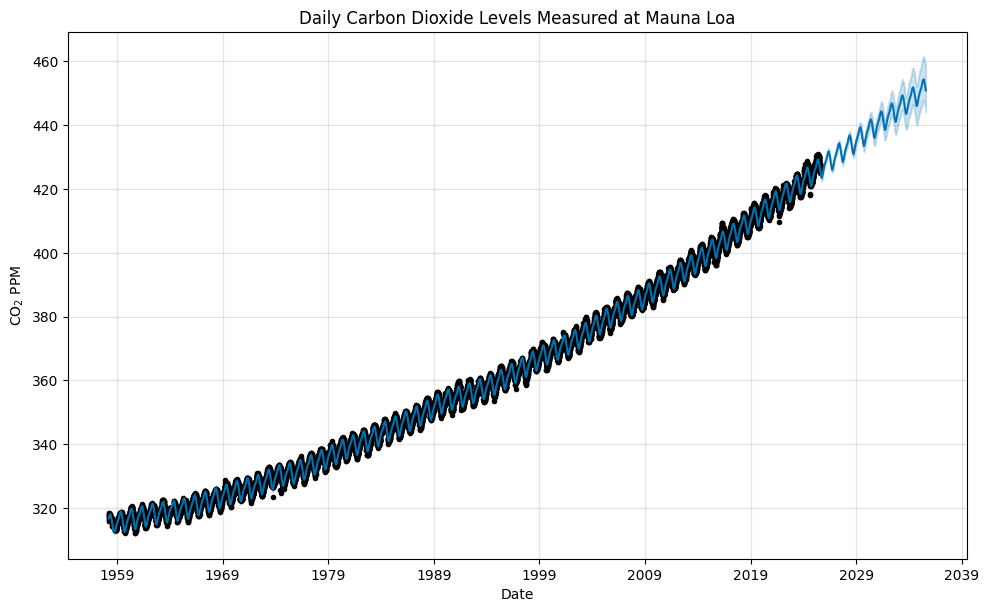

In [ ]:
#@title 👴 Apply Prophet to CO2 data and plot predictions
model = Prophet()
model.fit(df)
future = model.make_future_dataframe(periods=365 * 10)
forecast = model.predict(future)
fig = model.plot(forecast, xlabel='Date', ylabel=r'CO$_2$ PPM')
plt.title('Daily Carbon Dioxide Levels Measured at Mauna Loa')
plt.show()


In [ ]:
#@title 🪄 Preview `forecast` df
forecast.head(3).T

,0,1,2
ds,1958-03-30 00:00:00,1958-03-31 00:00:00,1958-04-02 00:00:00
trend,314.88242,314.884785,314.889516
yhat_lower,315.970287,316.062667,316.183792
yhat_upper,317.704921,317.725884,317.860098
trend_lower,314.88242,314.884785,314.889516
trend_upper,314.88242,314.884785,314.889516
additive_terms,1.998717,2.027857,2.117704
additive_terms_lower,1.998717,2.027857,2.117704
additive_terms_upper,1.998717,2.027857,2.117704
weekly,0.015589,-0.002557,-0.006503


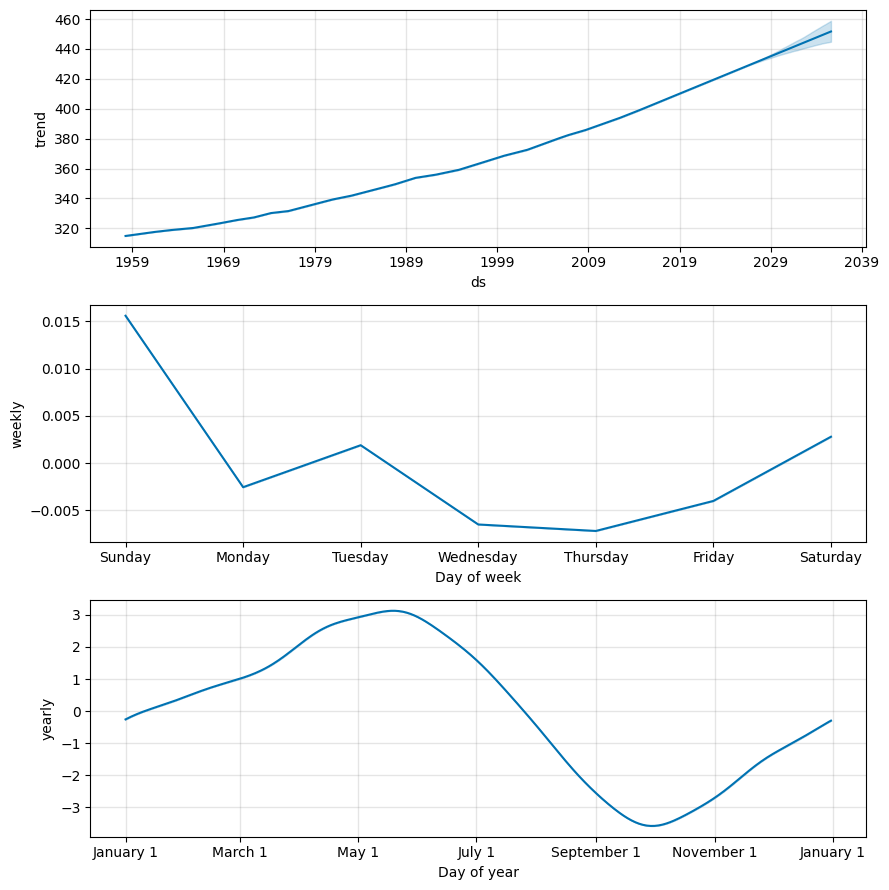

In [ ]:
#@title 🥡 Plot components of the forecast - trend and DOW and DOY seasonality
fig2 = model.plot_components(forecast)
plt.show()

In [ ]:
#@title 🪝 Prepare a sine-wave shape curve df
x = pd.to_datetime(pd.date_range('1995-01', '2004-02', freq='M').strftime("%Y-%b").tolist())
y = [1 / (1 + np.e ** (-.04 * (val - 50))) for val in range(len(x))]  # create logistic curve
y = [y[idx] + y[idx] * .1 * np.sin((idx - 2) * (360 / 12) * (np.pi / 180)) for idx in range(len(y))]  # add sinusoidal variation
y = [int(500 * val) for val in y]  # scale up

df = pd.DataFrame({'ds': pd.to_datetime(x), 'y': y})
display(df)

/tmp/ipython-input-1533991318.py:2: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

/tmp/ipython-input-1533991318.py:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



,ds,y
0,1995-01-01,54
1,1995-02-01,58
2,1995-03-01,63
3,1995-04-01,69
4,1995-05-01,74
...,...,...
104,2003-09-01,448
105,2003-10-01,427
106,2003-11-01,412
107,2003-12-01,408


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



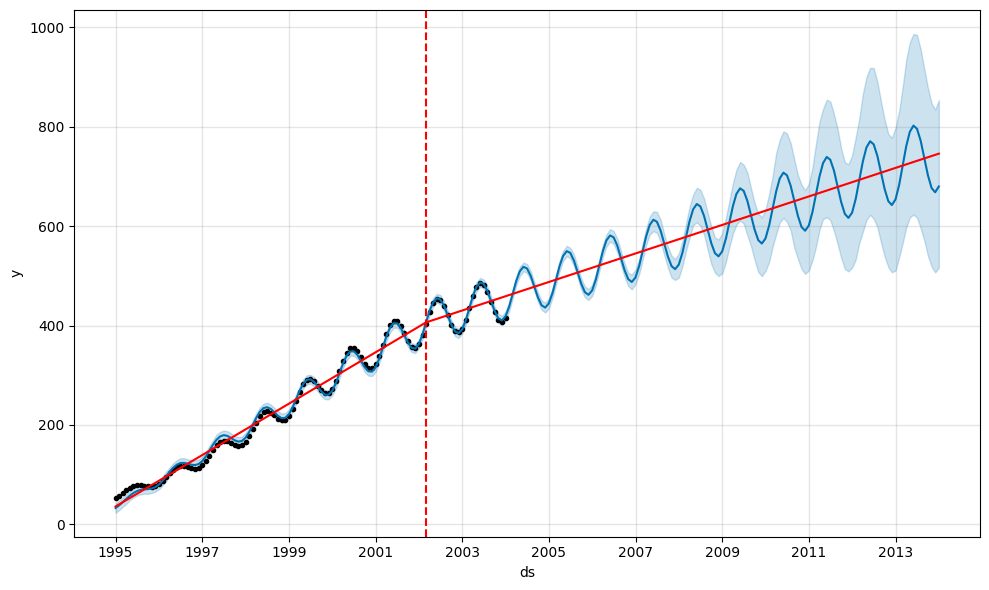

In [ ]:
#@title 🌡️ Plot forecast with trend changepoints
model = Prophet(growth='linear',
                yearly_seasonality=3,
                seasonality_mode='multiplicative',
                n_changepoints=1)
model.fit(df)
future = model.make_future_dataframe(periods=12 * 10, freq='M')
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()

In [ ]:
#@title 📈 Prepare a logistic curve df and add `cap` field

x = pd.to_datetime(pd.date_range('1995-01', '2004-02', freq='M').strftime("%Y-%b").tolist())
y = [1 / (1 + np.e ** (-.04 * (val - 50))) for val in range(len(x))]  # create logistic curve
y = [y[idx] + y[idx] * .1 * np.sin((idx - 2) * (360 / 12) * (np.pi / 180)) for idx in range(len(y))]  # add sinusoidal variation
y = [int(500 * val) for val in y]  # scale up

df = pd.DataFrame({'ds': pd.to_datetime(x), 'y': y})
df['cap'] = 500

display(df)

/tmp/ipython-input-4007471849.py:3: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

/tmp/ipython-input-4007471849.py:3: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



,ds,y,cap
0,1995-01-01,54,500
1,1995-02-01,58,500
2,1995-03-01,63,500
3,1995-04-01,69,500
4,1995-05-01,74,500
...,...,...,...
104,2003-09-01,448,500
105,2003-10-01,427,500
106,2003-11-01,412,500
107,2003-12-01,408,500


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



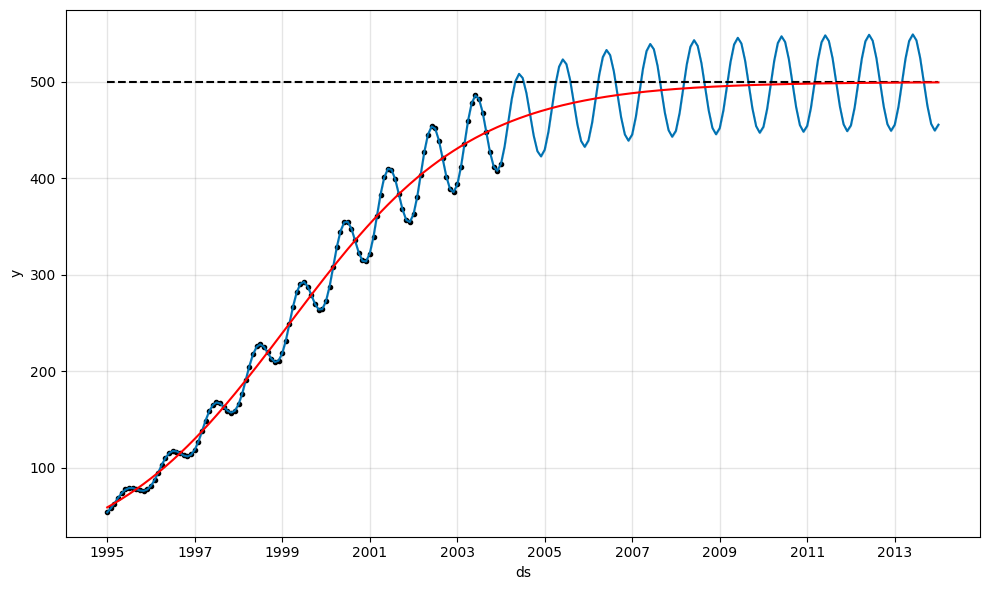

In [ ]:
#@title 🔮 Predict using Logistic Growth

model = Prophet(growth='logistic',
                yearly_seasonality=3,
                seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=12 * 10, freq='M')

future['cap'] = 500

forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, cp_linestyle='')
plt.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



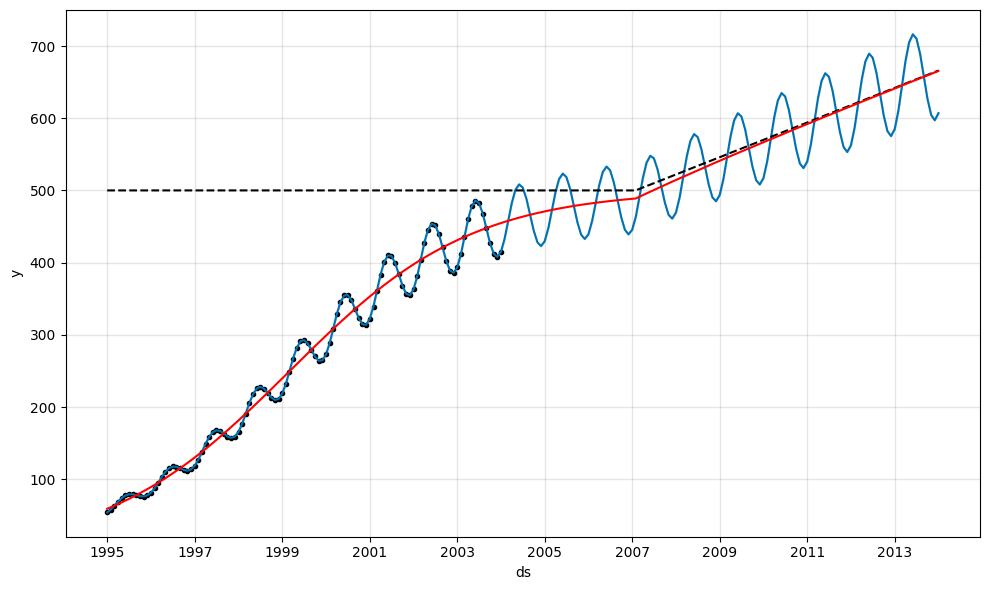

In [ ]:
#@title ⏱️ Reestimate using different cap values across time

def set_cap(row, df):
    if row.year < 2007:
        return 500
    else:
        pop_2007 = 500
        idx_2007 = df[df['ds'].dt.year == 2007].index[0]
        idx_date = df[df['ds'] == row].index[0]
        return pop_2007 + 2 * (idx_date - idx_2007)

df['cap'] = df['ds'].apply(set_cap, args=(df,))

model = Prophet(growth='logistic',
                yearly_seasonality=3,
                seasonality_mode='multiplicative')

model.fit(df)

future = model.make_future_dataframe(periods=12 * 10, freq='M')
future['cap'] = future['ds'].apply(set_cap, args=(future,))
forecast = model.predict(future)

fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, cp_linestyle='')
plt.show()

/tmp/ipython-input-3408527373.py:3: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



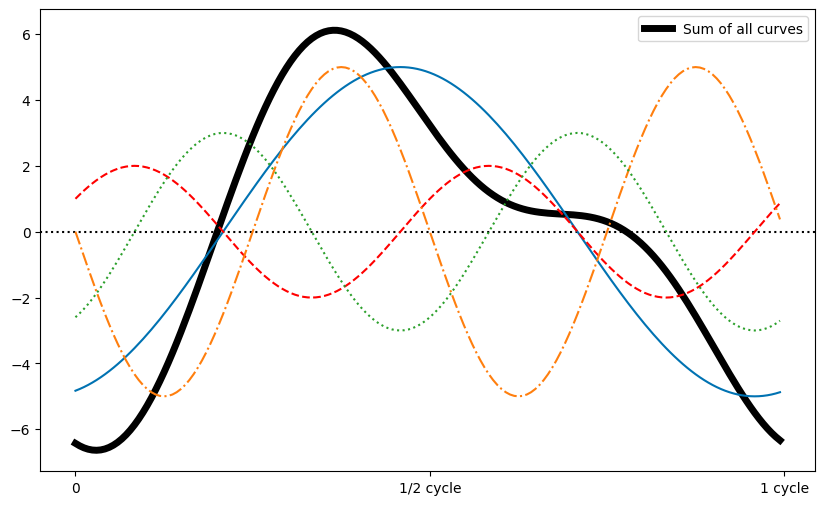

In [ ]:
#@title 📏 Fourier Series visualisation

x = pd.date_range('2000-01-01', '2001-01-01', freq='H')
x = range(24 * 7)
y0 = [(-5 * np.sin(((idx / 7) - 17) * (360 / 24) * (np.pi / 180))) for idx in range(len(x))]
y1 = [(-2 * np.sin(((idx / 7) - 5) * (360 / 12) * (np.pi / 180))) for idx in range(len(x))]
y2 = [(-5 * np.sin(((idx / 7) - 12) * (360 / 12) * (np.pi / 180))) for idx in range(len(x))]
y3 = [(-3 * np.sin(((idx / 7) - 20) * (360 / 12) * (np.pi / 180))) for idx in range(len(x))]
y = [y0[idx] + y1[idx] + y2[idx] + y3[idx] for idx in range(len(x))]

plt.figure(figsize=(10, 6))
plt.axhline(0, ls=':', c='k')
plt.plot(y, lw=5, c='k', label='Sum of all curves')
plt.plot(y0, c='#0072B2', ls='-')
plt.plot(y1, c='r', ls='--')
plt.plot(y2, c='tab:orange', ls='-.')
plt.plot(y3, c='tab:green', ls=':')
plt.legend()
plt.xticks(ticks=[0, 84, 168], labels=[0, '1/2 cycle', '1 cycle'])
plt.show()

In [ ]:
#@title ✈️ Create AirPassengers.csv (credits to Kaggle)
%%writefile AirPassengers.csv

Month,#Passengers
1949-01,112
1949-02,118
1949-03,132
1949-04,129
1949-05,121
1949-06,135
1949-07,148
1949-08,148
1949-09,136
1949-10,119
1949-11,104
1949-12,118
1950-01,115
1950-02,126
1950-03,141
1950-04,135
1950-05,125
1950-06,149
1950-07,170
1950-08,170
1950-09,158
1950-10,133
1950-11,114
1950-12,140
1951-01,145
1951-02,150
1951-03,178
1951-04,163
1951-05,172
1951-06,178
1951-07,199
1951-08,199
1951-09,184
1951-10,162
1951-11,146
1951-12,166
1952-01,171
1952-02,180
1952-03,193
1952-04,181
1952-05,183
1952-06,218
1952-07,230
1952-08,242
1952-09,209
1952-10,191
1952-11,172
1952-12,194
1953-01,196
1953-02,196
1953-03,236
1953-04,235
1953-05,229
1953-06,243
1953-07,264
1953-08,272
1953-09,237
1953-10,211
1953-11,180
1953-12,201
1954-01,204
1954-02,188
1954-03,235
1954-04,227
1954-05,234
1954-06,264
1954-07,302
1954-08,293
1954-09,259
1954-10,229
1954-11,203
1954-12,229
1955-01,242
1955-02,233
1955-03,267
1955-04,269
1955-05,270
1955-06,315
1955-07,364
1955-08,347
1955-09,312
1955-10,274
1955-11,237
1955-12,278
1956-01,284
1956-02,277
1956-03,317
1956-04,313
1956-05,318
1956-06,374
1956-07,413
1956-08,405
1956-09,355
1956-10,306
1956-11,271
1956-12,306
1957-01,315
1957-02,301
1957-03,356
1957-04,348
1957-05,355
1957-06,422
1957-07,465
1957-08,467
1957-09,404
1957-10,347
1957-11,305
1957-12,336
1958-01,340
1958-02,318
1958-03,362
1958-04,348
1958-05,363
1958-06,435
1958-07,491
1958-08,505
1958-09,404
1958-10,359
1958-11,310
1958-12,337
1959-01,360
1959-02,342
1959-03,406
1959-04,396
1959-05,420
1959-06,472
1959-07,548
1959-08,559
1959-09,463
1959-10,407
1959-11,362
1959-12,405
1960-01,417
1960-02,391
1960-03,419
1960-04,461
1960-05,472
1960-06,535
1960-07,622
1960-08,606
1960-09,508
1960-10,461
1960-11,390
1960-12,432

Overwriting AirPassengers.csv


In [ ]:
#@title 📁 Load AirPassengers into `df`
df = pd.read_csv('AirPassengers.csv')
df['Month'] = pd.to_datetime(df['Month'])
df.columns = ['ds', 'y']
display(df)

,ds,y
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121
...,...,...
139,1960-08-01,606
140,1960-09-01,508
141,1960-10-01,461
142,1960-11-01,390


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


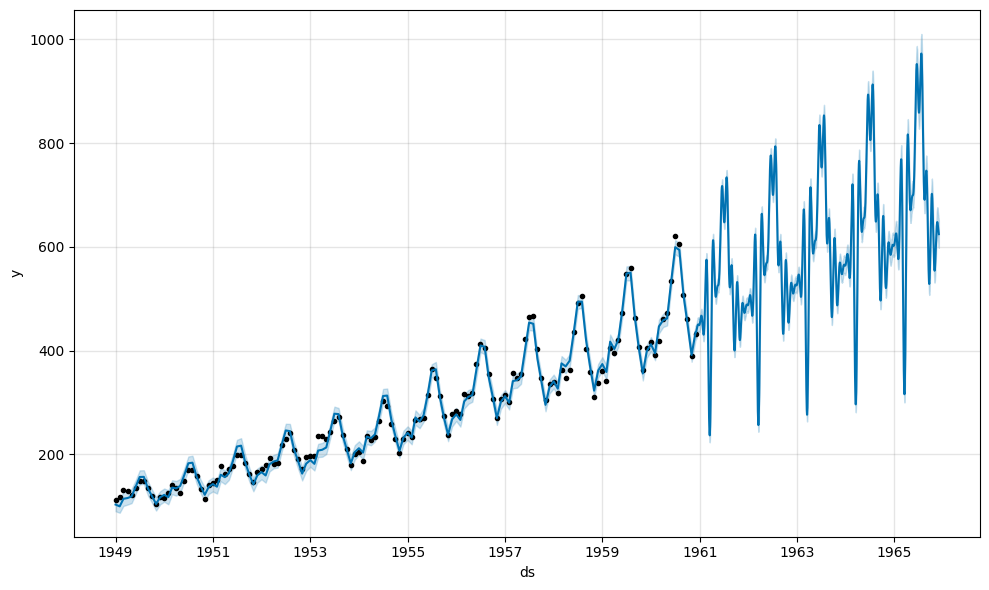

In [ ]:
#@title 💥 Raw setup of prophet with exploded predictions
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=365 * 5)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


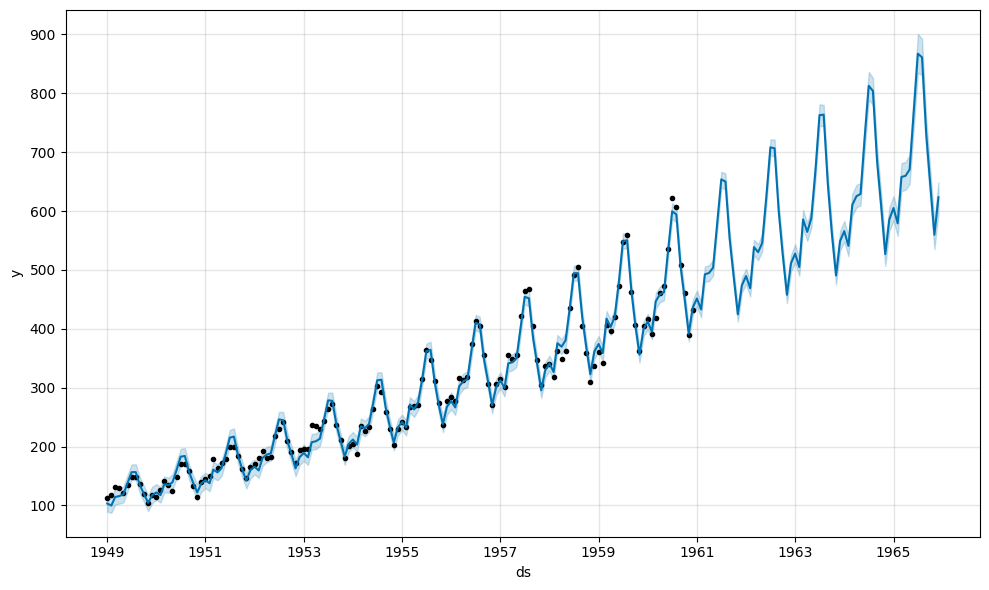

In [ ]:
#@title ⏱️ Fixed exploding predictions with updating freq = MS
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=12 * 5, freq='MS')
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

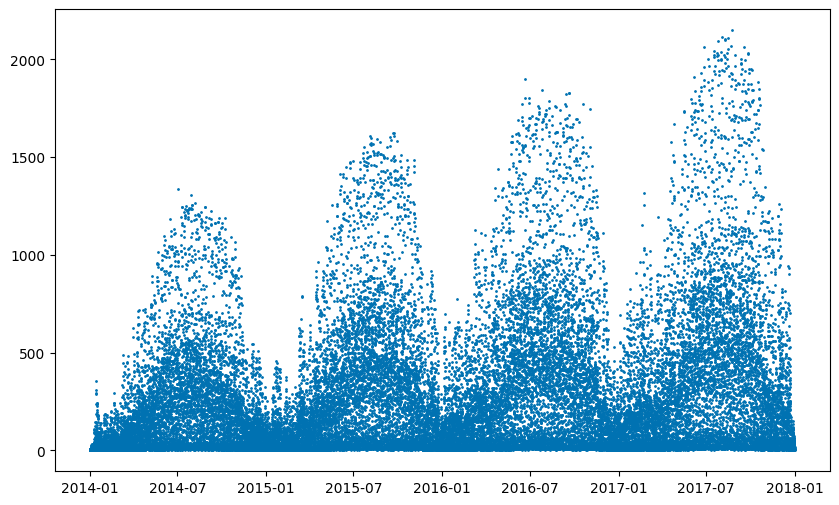

In [ ]:
#@title 🚲 Load Divvy hourly data
df = pd.read_csv('../data/divvy_hourly.csv')
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], s=1, c='#0072B2')
plt.show()

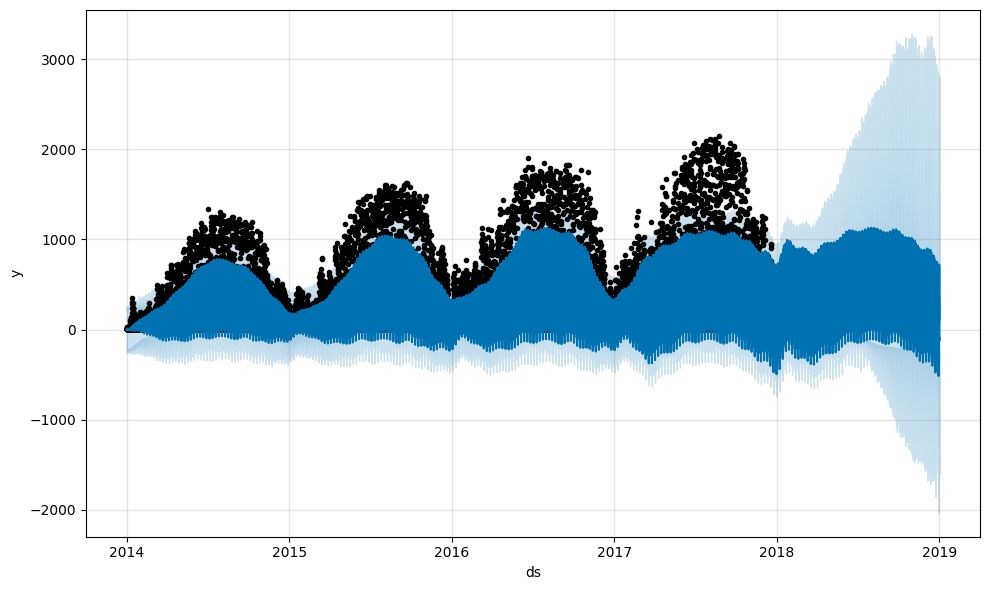

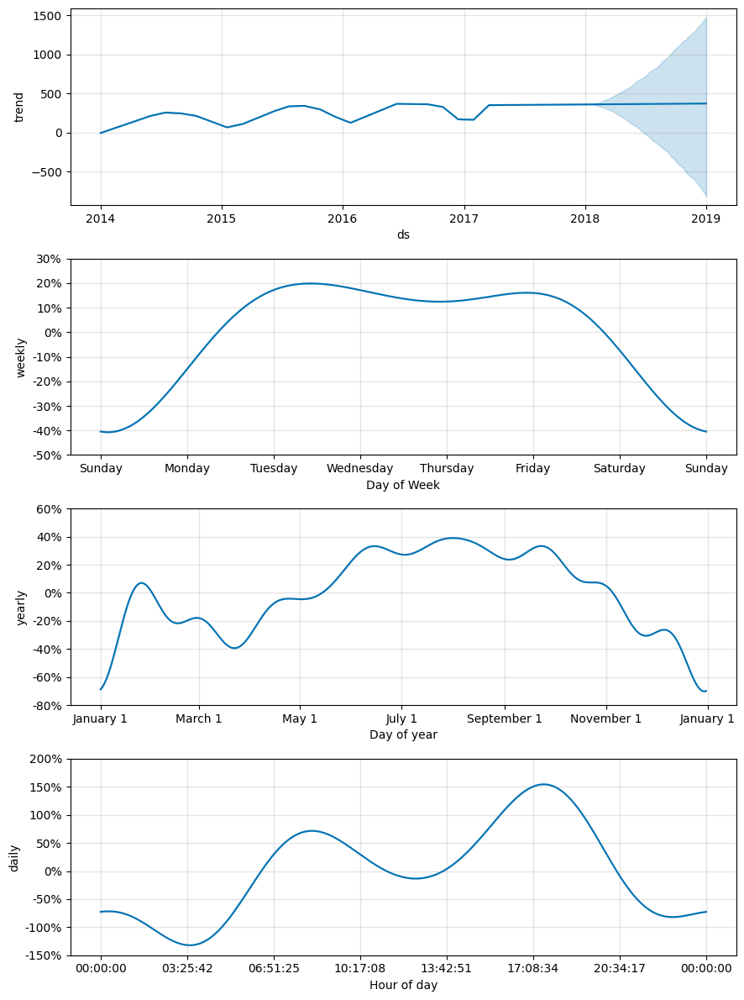

In [ ]:
#@title ⌚ Run predictions for hourly data
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=365 * 24, freq='h')

forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()
fig2 = model.plot_components(forecast)
plt.show()

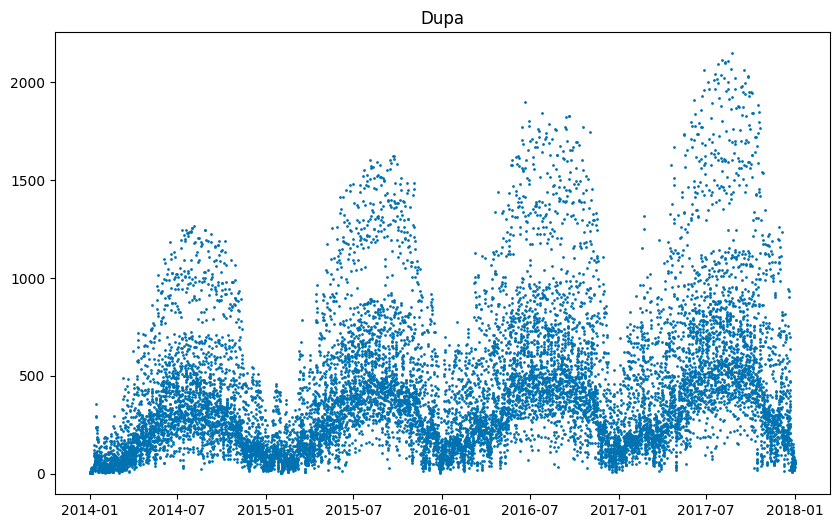

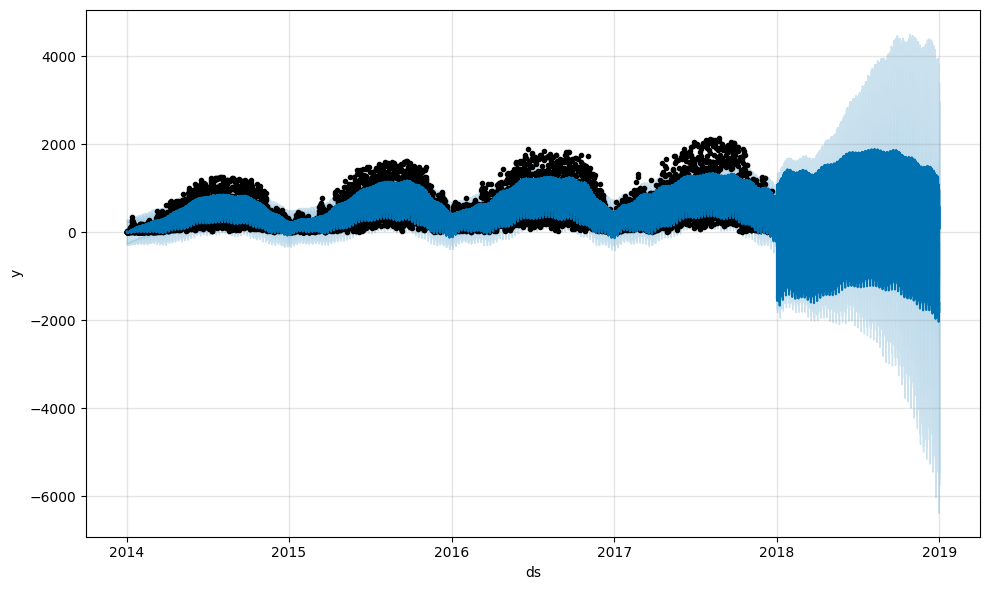

In [ ]:
#@title 🗑️ Cleanup and leaving out only data inbetween 8 and 18

df = df[(df['ds'].dt.hour >= 8) & (df['ds'].dt.hour < 18)]
plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], s=1, c='#0072B2')
plt.title("Data after removal of rides outside <8, 18> ")
plt.show()
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=365 * 24, freq='h')
forecast = model.predict(future)
fig = model.plot(forecast)
plt.title("Forecast using data after removal of rides outside <8, 18> ")
plt.show()

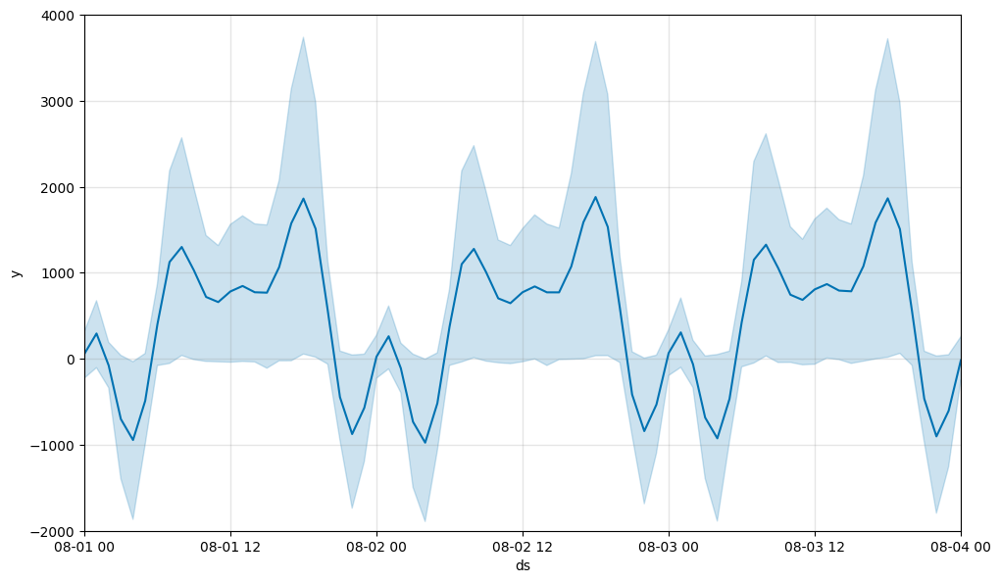

In [ ]:
#@title 🔬 Preview the forecast for narrow period of time close to the future
fig = model.plot(forecast)
plt.xlim(pd.to_datetime(['2018-08-01', '2018-08-04']))
plt.ylim(-2000, 4000)
plt.show()

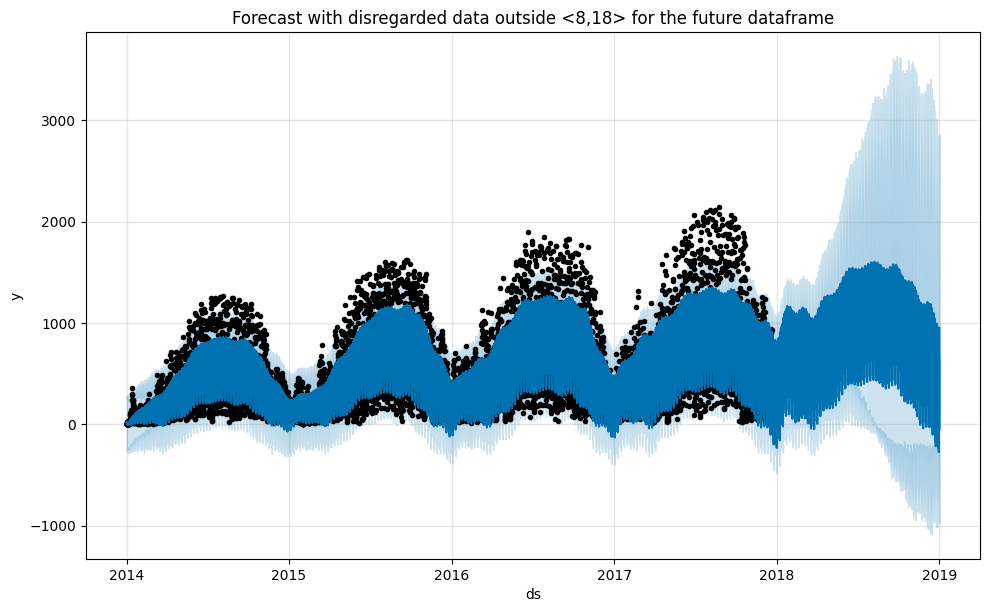

In [ ]:
#@title 🧼 Disregard data outside <8,18> for the future dataframe
future2 = future[(future['ds'].dt.hour >= 8) &
                 (future['ds'].dt.hour < 18)]
forecast2 = model.predict(future2)
fig = model.plot(forecast2)
plt.title("Forecast with disregarded data outside <8,18> for the future dataframe")
plt.show()

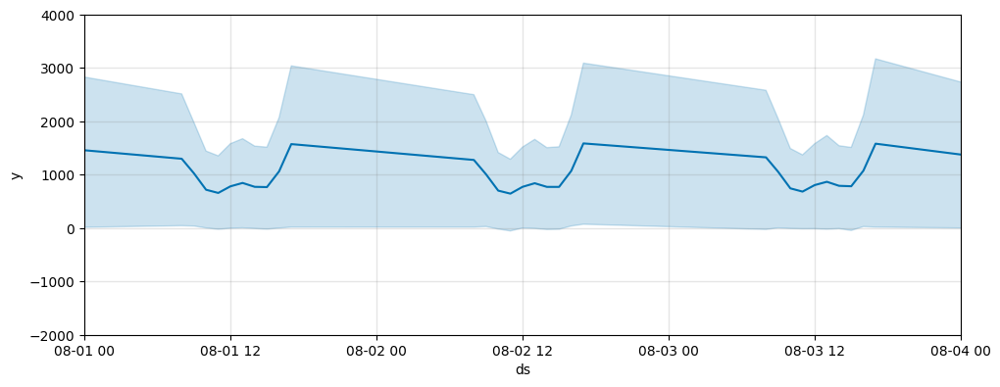

In [ ]:
#@title 🧪 Review once again 3 day range forecast after `forecast` df data cleanup
fig = model.plot(forecast2, figsize=(10, 4))
plt.xlim(pd.to_datetime(['2018-08-01', '2018-08-04']))
plt.ylim(-2000, 4000)
plt.show()

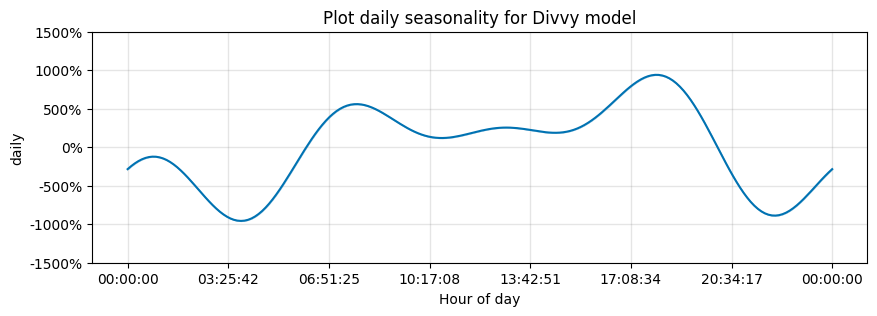

In [ ]:
#@title ☀️ Plot daily seasonality for the `model`
plot_seasonality(model, 'daily', figsize=(10, 3))
plt.title("Plot daily seasonality for Divvy model")
plt.show()

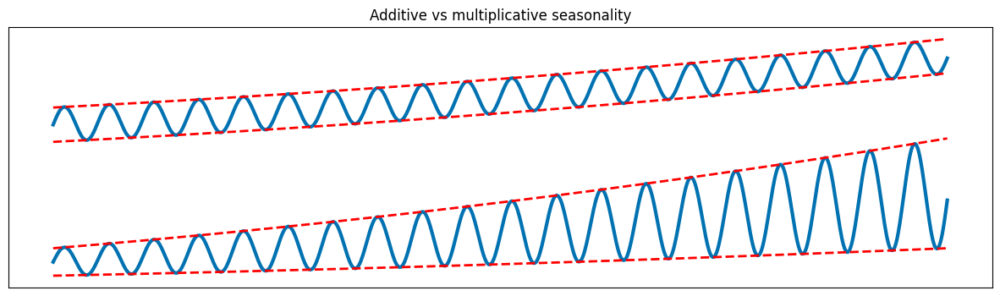

In [ ]:
#@title 🔊 Plot the comparison of additive and multiplicative seasonality

multiplier = 5
spread = 3
separation = 10 * spread

x = np.linspace(1, 2, 1000)
y0 = [multiplier * val**2 for val in x]
y1 = [np.sin(idx * 7.2 * np.pi / 180) for idx in range(len(x))]

y = [y0[idx] + 1.25 * spread * y1[idx] for idx in range(len(x))]
upper = [y0[idx] + 1.25 * spread for idx in range(len(x))]
lower = [y0[idx] - 1.25 * spread for idx in range(len(x))]

plt.figure(figsize=(15, 4))
plt.plot(x, y, c='#0072B2', lw=3)
plt.plot(x, upper, c='r', lw=2, ls='--')
plt.plot(x, lower, c='r', lw=2, ls='--')

y = [y0[idx] + spread / multiplier * y0[idx] * y1[idx] - separation for idx in range(len(x))]
upper = [(multiplier + spread) * val**2 - separation for val in x]
lower = [(multiplier - spread) * val**2 - separation for val in x]

plt.plot(x, y, c='#0072B2', lw=3)
plt.plot(x, upper, c='r', lw=2, ls='--')
plt.plot(x, lower, c='r', lw=2, ls='--')

plt.xticks([])
plt.yticks([])
plt.title("Additive vs multiplicative seasonality")
plt.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


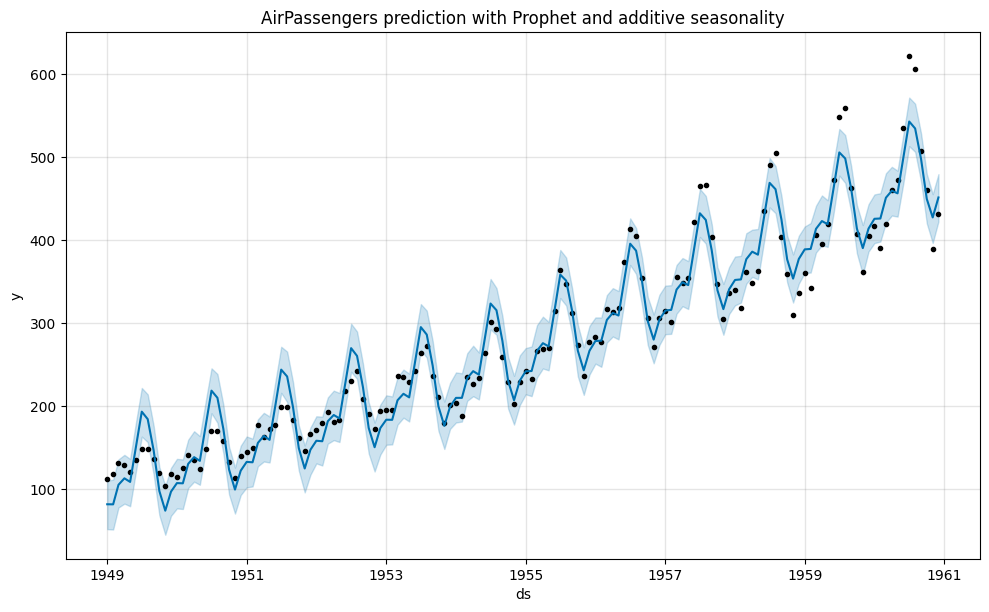

In [ ]:
#@title ➕ Predict AirPassengers with additive seasonality

df = pd.read_csv('AirPassengers.csv')
df['Month'] = pd.to_datetime(df['Month'])
df.columns = ['ds', 'y']

model_a = Prophet(seasonality_mode='additive',
                  yearly_seasonality=4)
model_a.fit(df)
forecast_a = model_a.predict()
fig_a = model_a.plot(forecast_a)
plt.title("AirPassengers prediction with Prophet and additive seasonality")
plt.show()

In [ ]:
#@title 👨‍🔧 Components of additive model (`model_a`)
fig_a2 = model_a.plot_components(forecast_a)
plt.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


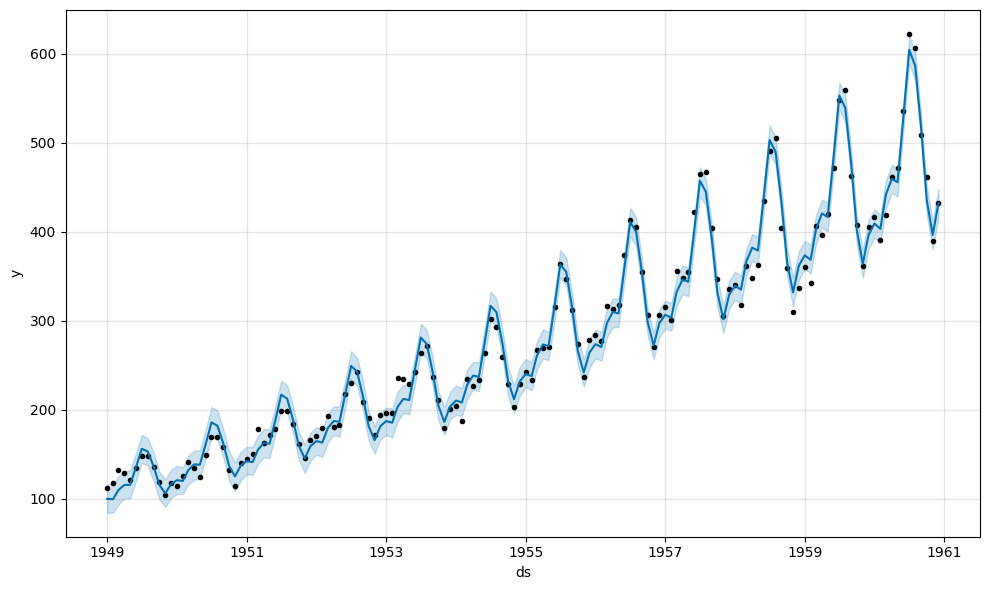

In [ ]:
#@title ✖️ Predict AirPassengers with multiplicative seasonality

model_m = Prophet(seasonality_mode='multiplicative',
                  yearly_seasonality=4)
model_m.fit(df)
forecast_m = model_m.predict()
fig_m = model_m.plot(forecast_m)
plt.title("AirPassengers prediction with Prophet and multiplicative seasonality")
plt.show()

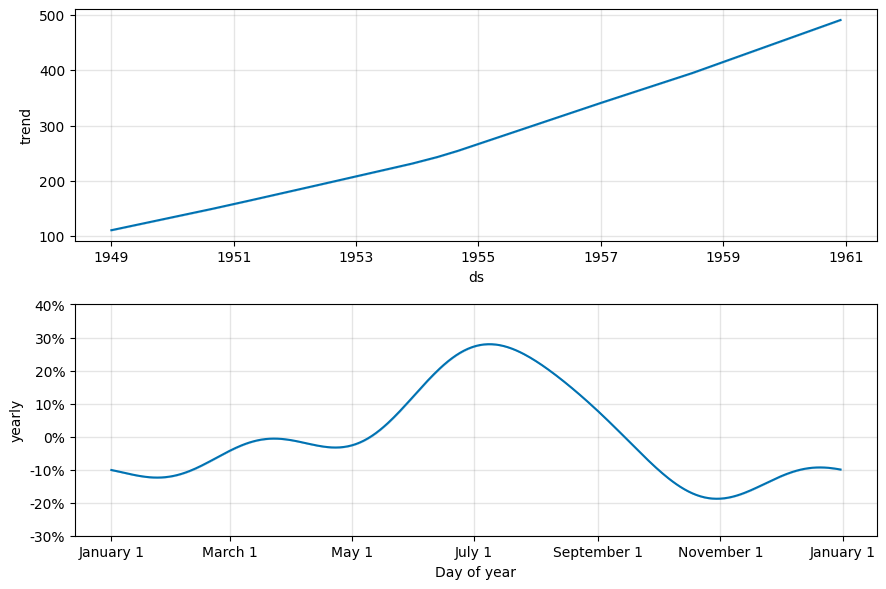

In [ ]:
#@title 👷‍♀️ Components of multiplicative model
fig_m2 = model_m.plot_components(forecast_m)
plt.show()

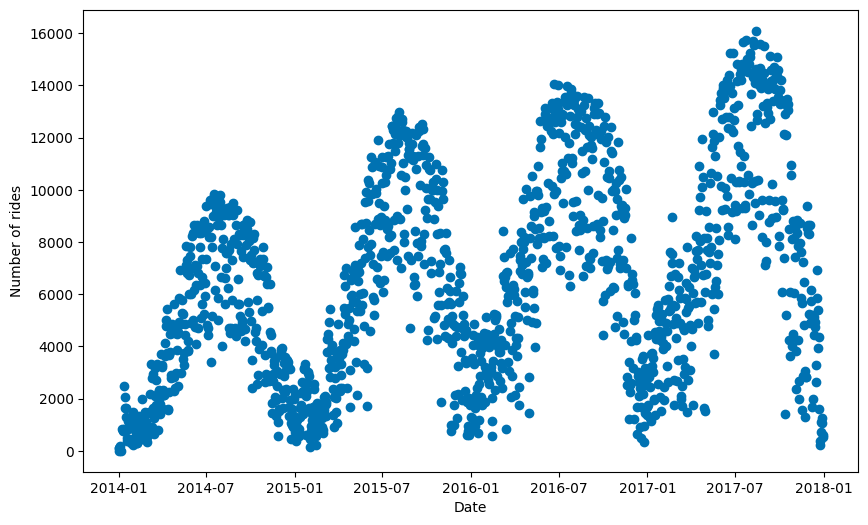

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


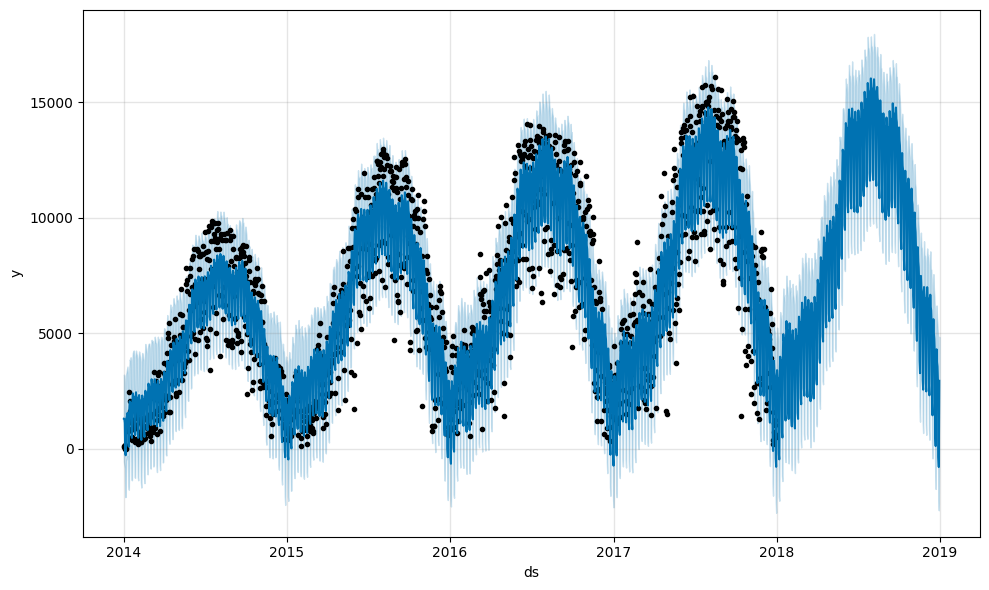

In [ ]:
#@title 🚵 Divvy daily predictions with multiplicative seasonality
df = pd.read_csv('divvy_daily.csv')
df.head()

df = df[['date', 'rides']]
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], c='#0072B2')
plt.xlabel('Date')
plt.ylabel('Number of rides')
plt.show()

model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

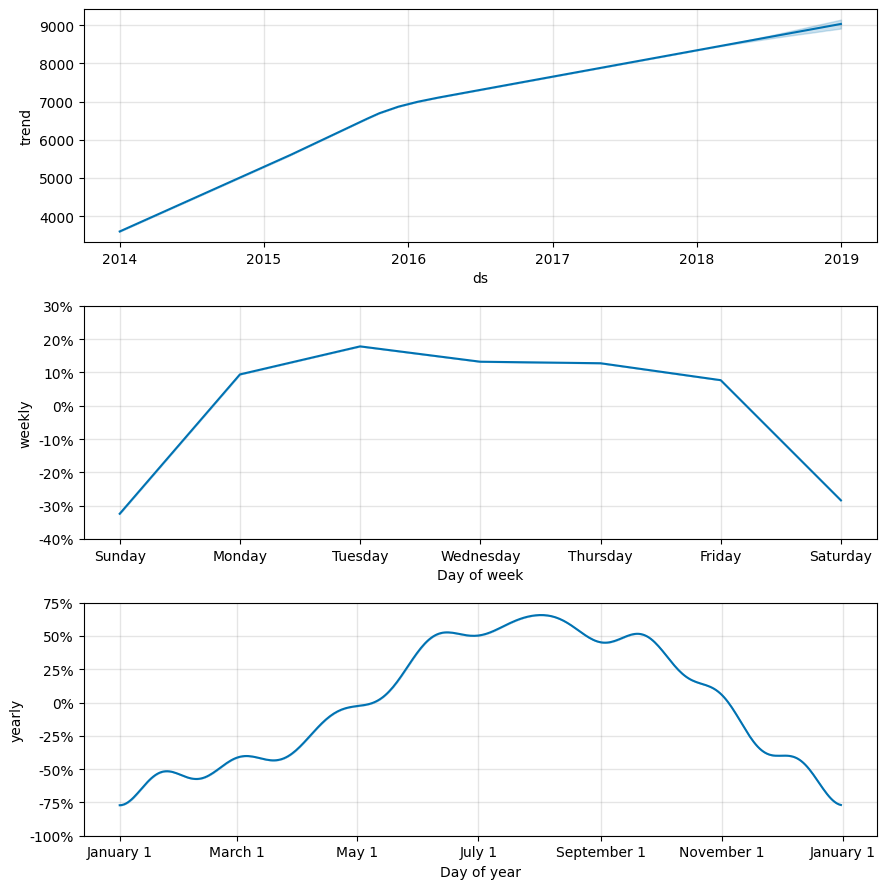

In [ ]:
#@title 👨‍🍳 Plot components of above
fig2 = model.plot_components(forecast)
plt.show()

/tmp/ipython-input-2928252754.py:24: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipython-input-2928252754.py:25: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipython-input-2928252754.py:26: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipython-input-2928252754.py:27: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

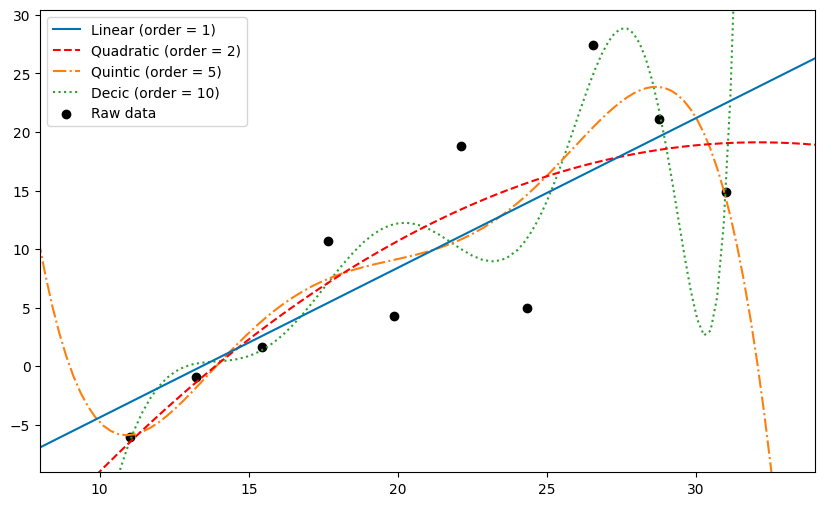

In [ ]:
#@title 🎯 Plot different Fourier order to have some sense of overfitting

x = np.linspace(11, 31, 10)
y = np.array([.025 * val**2 + random.uniform(-10, 10) for val in x])
data = {"x": x, "y": y}
x2 = np.array([.025 * val**2 for val in np.linspace(1, 11, 80)] +
              [.025 * val**2 for val in np.linspace(11, 31, 80)] +
              [.025 * val**2 for val in np.linspace(31, 41, 80)])

model1 = sm.ols(formula = 'y ~ x', data = data).fit()
model2 = sm.ols(formula = 'y ~ np.power(x, 2) + x', data = data).fit()
model5 = sm.ols(formula = 'y ~ x + np.power(x, 2) + np.power(x, 3) + np.power(x, 4) + np.power(x, 5) + x', data = data).fit()
model10 = sm.ols(formula = 'y ~ x + np.power(x, 2) + \
                                     np.power(x, 3) + \
                                     np.power(x, 4) + \
                                     np.power(x, 5) + \
                                     np.power(x, 6) + \
                                     np.power(x, 7) + \
                                     np.power(x, 8) + \
                                     np.power(x, 9) + \
                                     np.power(x, 10)', data = data).fit()

plt.figure(figsize=(10, 6))
plt.scatter(x, y, label='Raw data', c='k')

plt.plot(x2, model10.params[0] +
             model10.params[1] * x2 +
             model10.params[2] * x2**2 +
             model10.params[3] * x2**3 +
             model10.params[4] * x2**4 +
             model10.params[5] * x2**5 +
             model10.params[6] * x2**6 +
             model10.params[7] * x2**7 +
             model10.params[8] * x2**8 +
             model10.params[9] * x2**9 +
             model10.params[10] * x2**10,
         label='Decic (order = 10)', c='tab:green', ls=':')

plt.plot(x2, model5.params[0] +
             model5.params[1] * x2 +
             model5.params[2] * x2**2 +
             model5.params[3] * x2**3 +
             model5.params[4] * x2**4 +
             model5.params[5] * x2**5,
         label='Quintic (order = 5)', c='tab:orange', ls='-.')

plt.plot(x2, model2.params[0] +
             model2.params[1] * x2**2 +
             model2.params[2] * x2,
         label='Quadratic (order = 2)', c='r', ls='--')

plt.plot(x2, model1.params[0] +
             model1.params[1] * x2,
         label='Linear (order = 1)', c='#0072B2', ls='-')

plt.ylim(-5, 35)
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend([h for h in reversed(handles)], [l for l in reversed(labels)])
plt.xlim(x.min() - 3, x.max() + 3)
plt.ylim(y.min() - 3, y.max() + 3)
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


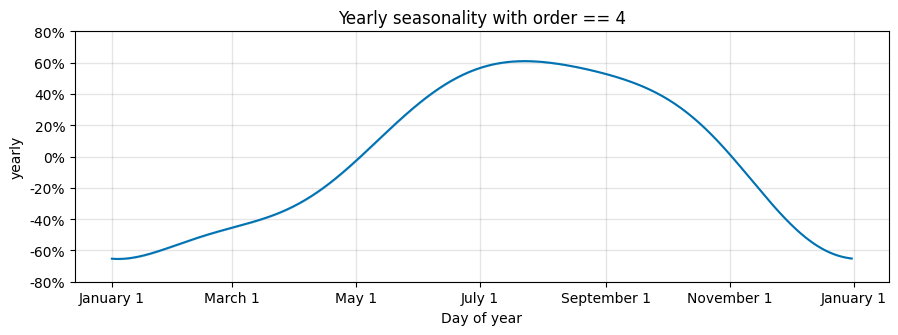

In [ ]:
#@title 🎛️ Refit Prophet with `yearly_seasonality` = 4
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4)
model.fit(df)

fig3 = plot_yearly(model, figsize=(10.5, 3.25))
plt.title("Yearly seasonality with order == 4")
plt.show()

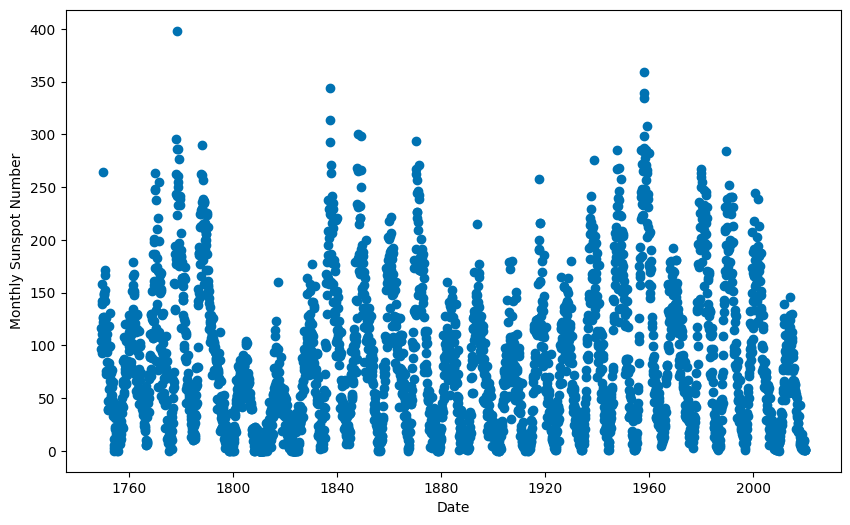

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



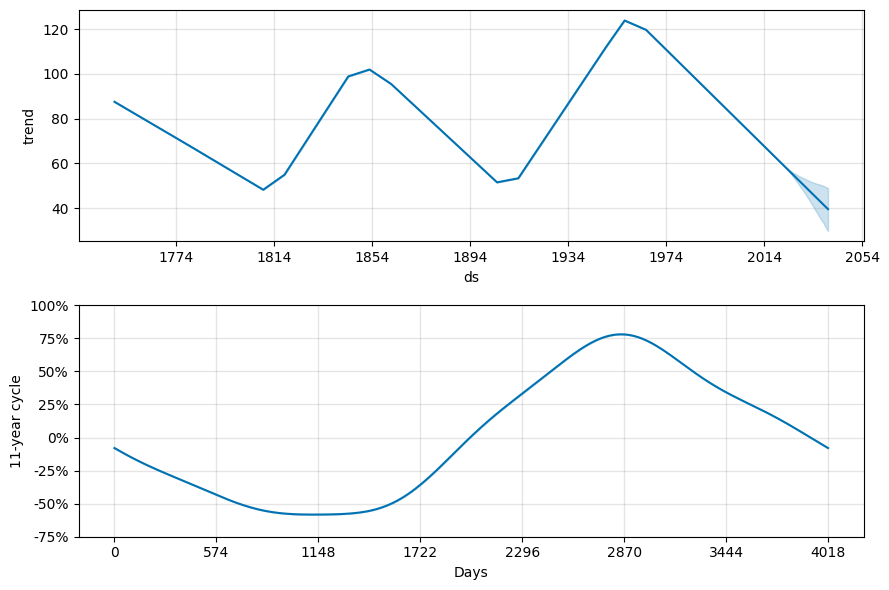

In [ ]:
#@title 🌞 Sunspots custom 11-year seasonality with fourier_order = 5
#@markdown Also display how `model.seasonalities` are stored
df = pd.read_csv('sunspots.csv', usecols=['Date', 'Monthly Mean Total Sunspot Number'])
df['Date'] = pd.to_datetime(df['Date'], format='mixed')
df.columns = ['ds', 'y']

plt.figure(figsize=(10, 6))
plt.scatter(pd.to_datetime(df['ds']), df['y'], c='#0072B2')
plt.xlabel('Date')
plt.ylabel('Monthly Sunspot Number')
plt.show()

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=False)

model.add_seasonality(name='11-year cycle',
                      period=11 * 365.25,
                      fourier_order=5)

model.fit(df)
future = model.make_future_dataframe(periods=240, freq='M')
forecast = model.predict(future)
fig2 = model.plot_components(forecast)
plt.show()

model.seasonalities


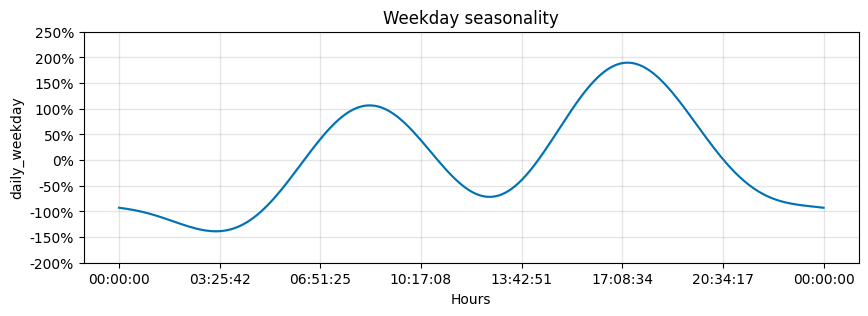

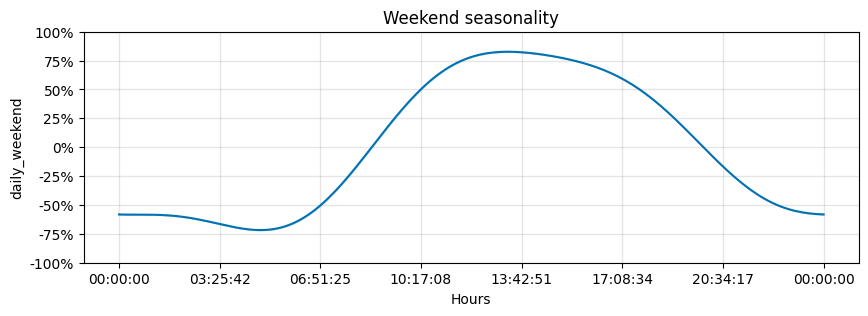

In [ ]:
#@title 🏖️ Build seasonality per weekend/weekday for Divvy
df = pd.read_csv('divvy_hourly.csv')
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

def is_weekend(ds):
    date = pd.to_datetime(ds)
    return (date.dayofweek == 5 or date.dayofweek == 6)

df['weekend'] = df['ds'].apply(is_weekend)
df['weekday'] = ~df['ds'].apply(is_weekend)

df.head()

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=6,
                weekly_seasonality=6,
                daily_seasonality=False)
model.add_seasonality(name='daily_weekend',
                      period=1,
                      fourier_order=3,
                      condition_name='weekend')
model.add_seasonality(name='daily_weekday',
                      period=1,
                      fourier_order=3,
                      condition_name='weekday')

model.fit(df)
future = model.make_future_dataframe(periods=365 * 24, freq='h')
future['weekend'] = future['ds'].apply(is_weekend)
future['weekday'] = ~future['ds'].apply(is_weekend)
forecast = model.predict(future)

fig3 = plot_seasonality(model, 'daily_weekday', figsize=(10, 3))
plt.title("Weekday seasonality")
plt.show()
fig4 = plot_seasonality(model, 'daily_weekend', figsize=(10, 3))
plt.title("Weekend seasonality")
plt.show()

/usr/local/lib/python3.12/dist-packages/scipy/_lib/_util.py:1233: LinAlgWarning:

Ill-conditioned matrix (rcond=2.15605e-30): result may not be accurate.

/usr/local/lib/python3.12/dist-packages/scipy/_lib/_util.py:1233: LinAlgWarning:

Ill-conditioned matrix (rcond=2.02913e-24): result may not be accurate.



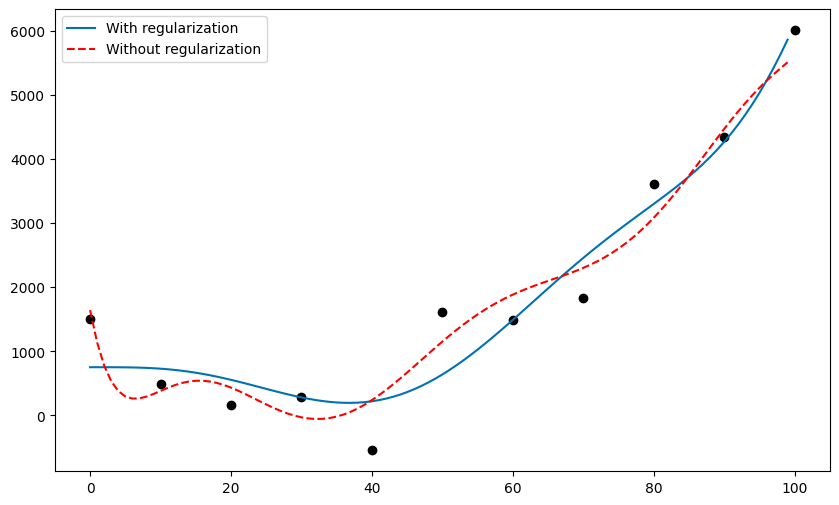

In [ ]:
#@title ➰ Polynomial features with and without regularization
x_pure = np.arange(0, 100, 1)
y_pure = (x_pure - 20) ** 2 + 50

num_points = 12
x0 = np.arange(0, num_points * 10, 10)
y0 = ((x0 - 20) ** 2 + 50) + np.random.normal(0, 700, num_points)

polynomial_features= PolynomialFeatures(degree=8)
x_poly = polynomial_features.fit_transform(x_pure.reshape(-1, 1))
x0_poly = polynomial_features.fit_transform(x0.reshape(-1, 1))

y1 = Ridge(alpha=0).fit(x0_poly, y0).predict(x_poly)
y2 = Ridge(alpha=1000).fit(x0_poly, y0).predict(x_poly)
y3 = Ridge(alpha=1000000000).fit(x0_poly, y0).predict(x_poly)

plt.figure(figsize=(10, 6))
plt.scatter(x0[:-1], y0[:-1], c='k')
plt.plot(x_pure, y3, label='With regularization', ls='-', c='#0072B2')
plt.plot(x_pure, y1, label='Without regularization', ls='--', c='r')
plt.legend()
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


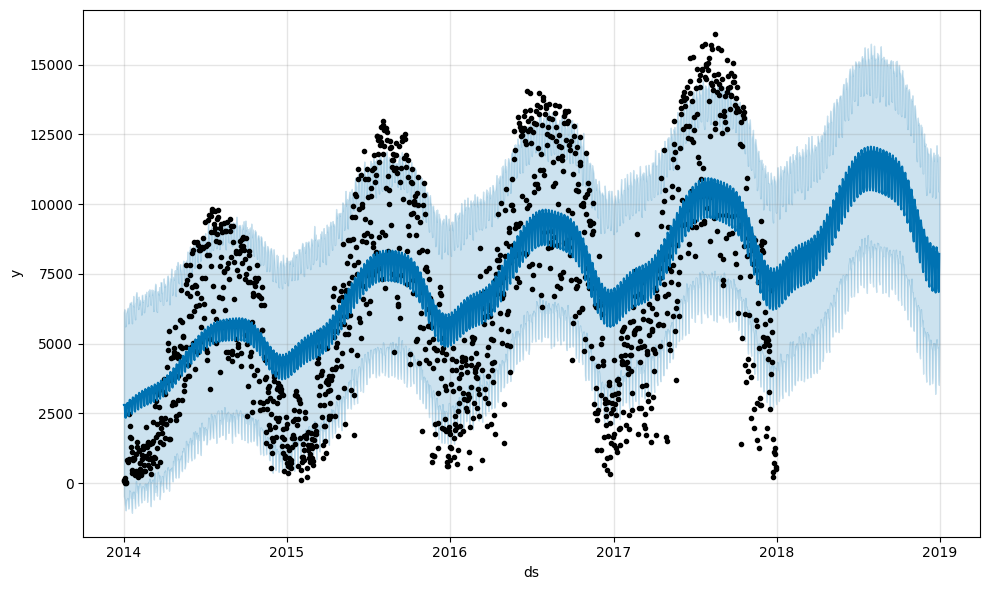

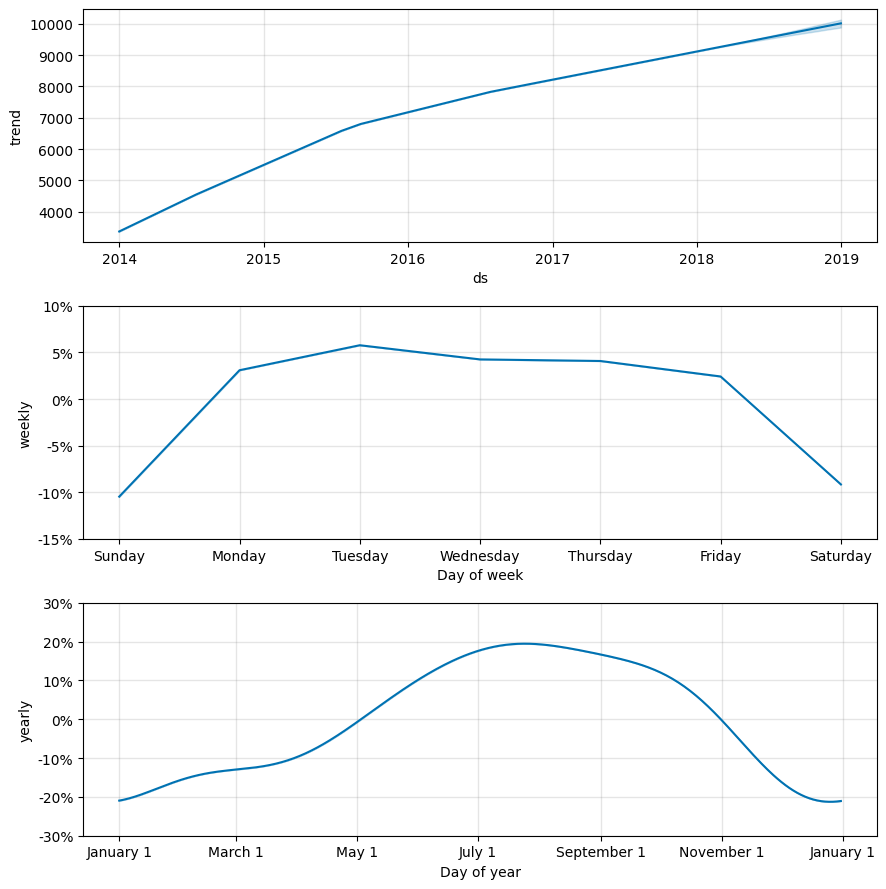

In [ ]:
#@title ⚖️ Use seasonality_prior_scale=.01 on Divvy
df = pd.read_csv('divvy_daily.csv')
df = df[['date', 'rides']]
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                seasonality_prior_scale=.01)

model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()
fig2 = model.plot_components(forecast)
plt.show()

In [ ]:
#@title 🛠️Custom functions to plot custom seasonal component and compare seasonalities
from prophet.plot import seasonality_plot_df, set_y_as_percent
from matplotlib.dates import (
    MonthLocator,
    num2date,
    AutoDateLocator,
    AutoDateFormatter,
)
from matplotlib.ticker import FuncFormatter

def plot_seasonality2(m, name, ax=None, uncertainty=True, figsize=(10, 6), ls='-', c='#0072B2', label=''):
    """Plot a custom seasonal component.
    Parameters
    ----------
    m: Prophet model.
    name: Seasonality name, like 'daily', 'weekly'.
    ax: Optional matplotlib Axes to plot on. One will be created if
        this is not provided.
    uncertainty: Optional boolean to plot uncertainty intervals, which will
        only be done if m.uncertainty_samples > 0.
    figsize: Optional tuple width, height in inches.
    Returns
    -------
    a list of matplotlib artists
    """
    artists = []
    if not ax:
        fig = plt.figure(facecolor='w', figsize=figsize)
        ax = fig.add_subplot(111)
    # Compute seasonality from Jan 1 through a single period.
    start = pd.to_datetime('2017-01-01 0000')
    period = m.seasonalities[name]['period']
    end = start + pd.Timedelta(days=period)
    plot_points = 200
    days = pd.to_datetime(np.linspace(start.value, end.value, plot_points))
    df_y = seasonality_plot_df(m, days)
    seas = m.predict_seasonal_components(df_y)
    artists += ax.plot(df_y['ds'].dt.to_pydatetime(), seas[name], ls=ls,
                        c=c, label=label)
    if uncertainty and m.uncertainty_samples:
        artists += [ax.fill_between(
            df_y['ds'].dt.to_pydatetime(), seas[name + '_lower'],
            seas[name + '_upper'], color='#0072B2', alpha=0.2)]
    ax.grid(True, which='major', c='gray', ls='-', lw=1, alpha=0.2)
    n_ticks = 8
    xticks = pd.to_datetime(np.linspace(start.value, end.value, n_ticks)
        ).to_pydatetime()
    ax.set_xticks(xticks)
    if period <= 2:
        fmt_str = '{dt:%T}'
    elif name == 'weekly':
        fmt_str = '{dt:%A}'
    elif period < 14:
        fmt_str = '{dt:%m}/{dt:%d} {dt:%R}'
    else:
        fmt_str = '{dt:%m}/{dt:%d}'
    ax.xaxis.set_major_formatter(FuncFormatter(
        lambda x, pos=None: fmt_str.format(dt=num2date(x))))
    ax.set_xlabel('ds')
    ax.set_ylabel(name)
    if m.seasonalities[name]['mode'] == 'multiplicative':
        ax = set_y_as_percent(ax)
    return artists

def compare_seasonality(seasonality,
                        model_list,
                        figsize=(10, 3),
                        ls=['-', '--', '-.', ':'],
                        c=['#0072B2', 'r', 'tab:orange', 'tab:green']):
    fig = plt.figure(facecolor='w', figsize=figsize)
    ax = fig.add_subplot(111)
    for model in range(len(model_list)):
        plot_seasonality2(model_list[model],
                          seasonality,
                          ax=ax,
                          ls=ls[model],
                          c=c[model],
                          label='Seasonality prior scale: {}'.format(model_list[model].seasonality_prior_scale))
    plt.legend()
    plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/tmp/ipython-input-759980535.py:38: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/tmp/ipython-input-759980535.py:42: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/tmp/ipython-input-759980535.py:38: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this w

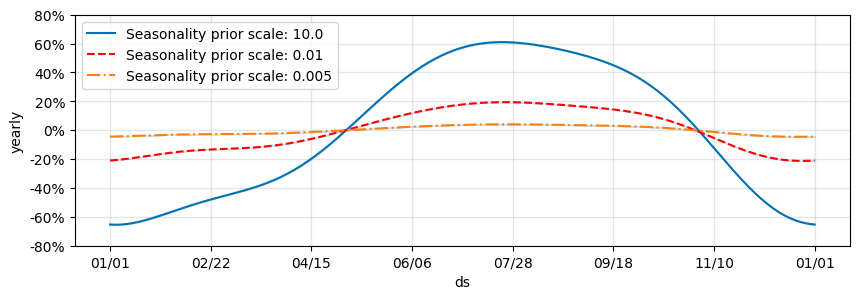

/tmp/ipython-input-759980535.py:38: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/tmp/ipython-input-759980535.py:42: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/tmp/ipython-input-759980535.py:38: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/tmp/ipython-input-759980535.py:42: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series c

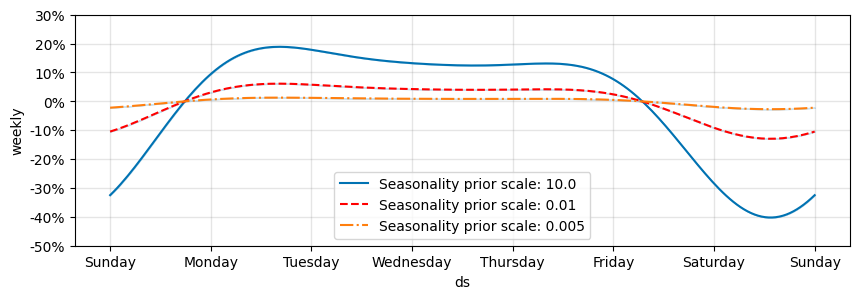

In [ ]:
#@title 🗳️ Compare seasonalities for seasonality_prior_scale in [10, 0.01 and 0.005]
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                seasonality_prior_scale=10)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)

model3 = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                seasonality_prior_scale=.01)
model3.fit(df)
future3 = model3.make_future_dataframe(periods=365)
forecast3 = model3.predict(future3)

model4 = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                seasonality_prior_scale=.005)
model4.fit(df)
future4 = model4.make_future_dataframe(periods=365)
forecast4 = model4.predict(future4)

compare_seasonality('yearly', [model, model3, model4])
compare_seasonality('weekly', [model, model3, model4])

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


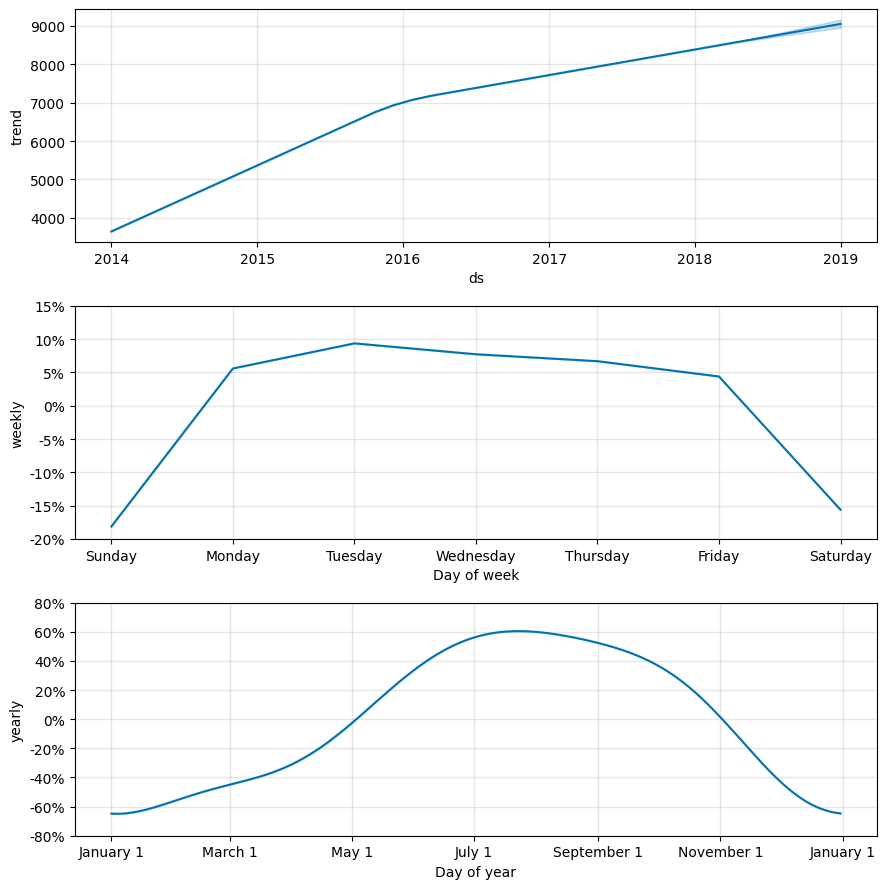

In [ ]:
#@title 📅 Add some weekly seasonality
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                weekly_seasonality=False)

model.add_seasonality(name='weekly',
                      period=7,
                      fourier_order=4,
                      prior_scale=0.01)

model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig2 = model.plot_components(forecast)
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


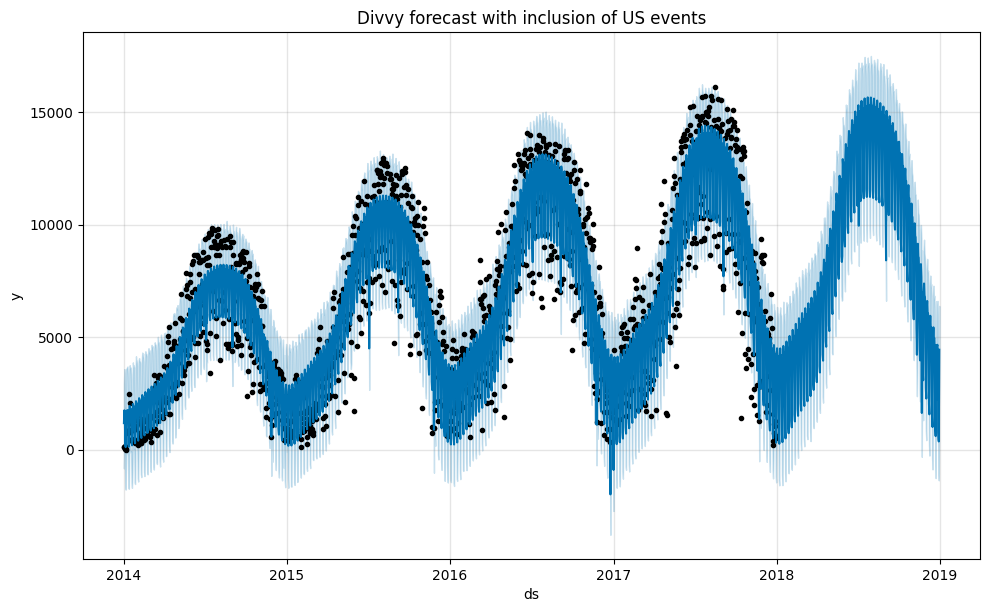

Components of Divvy forecast with inclusion of US events


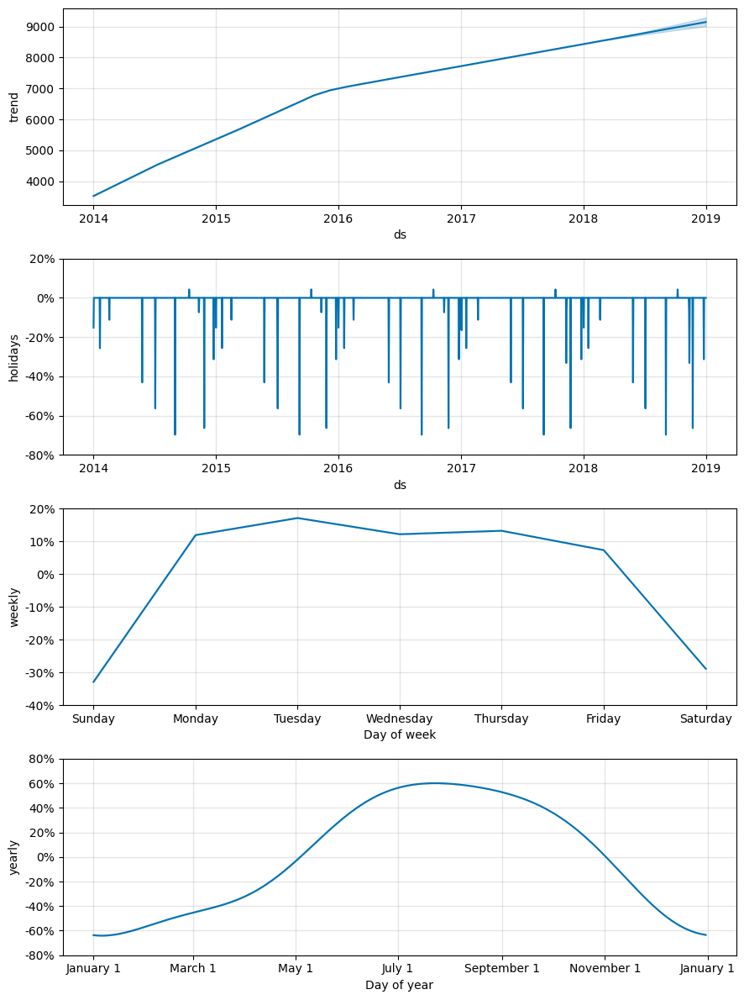

In [ ]:
#@title 🏢 Add US holidays into Divvy Forecast
df = pd.read_csv('divvy_daily.csv')
df = df[['date', 'rides']]
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4)

model.add_country_holidays(country_name='US')

model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.title('Divvy forecast with inclusion of US events')
plt.show()
print('Components of Divvy forecast with inclusion of US events')
fig2 = model.plot_components(forecast)
plt.show()

In [ ]:
#@title 🇺🇸 Show holiday names available in the model
model.train_holiday_names

,0
0,New Year's Day
1,Memorial Day
2,Independence Day
3,Labor Day
4,Veterans Day
5,Thanksgiving Day
6,Christmas Day
7,Christmas Day (observed)
8,Martin Luther King Jr. Day
9,Washington's Birthday


In [ ]:
#@title 🎉 Show impact of the holiday and plot
def first_non_zero(fcst, holiday):
    return fcst[fcst[holiday] != 0][holiday].values[0]

events_impact = pd.DataFrame({'holiday': model.train_holiday_names,
              'effect': [first_non_zero(forecast, holiday)
                         for holiday in model.train_holiday_names]})

px.bar(events_impact, x='holiday', y='effect', title='Impact of holidays in Divvy prediction')

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


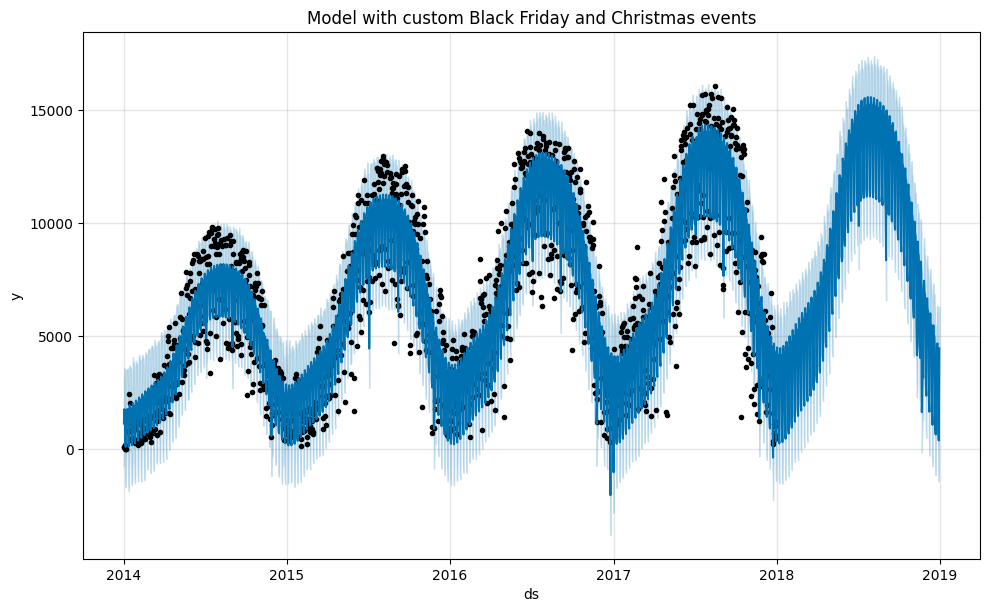

In [ ]:
#@title 🎊 Use `.make_holidays` to load specific events for Illinois state
year_list = df['ds'].dt.year.unique().tolist()
# Identify the final year, as an integer, and increase it by 1
year_list.append(year_list[-1] + 1)
holidays = make_holidays_df(year_list=year_list,
                            country='US',
                            state='IL')

holidays.head()

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                holidays=holidays)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)

holidays = make_holidays_df(year_list=year_list, country='US')

black_friday = pd.DataFrame({'holiday': 'Black Friday',
                             'ds': pd.to_datetime(['2014-11-28',
                                                   '2015-11-27',
                                                   '2016-11-25',
                                                   '2017-11-24',
                                                   '2018-11-23'])})
christmas_eve = pd.DataFrame({'holiday': 'Christmas Eve',
                              'ds': pd.to_datetime(['2014-12-24',
                                                    '2015-12-24',
                                                    '2016-12-24',
                                                    '2017-12-24',
                                                    '2018-12-24'])})

holidays = pd.concat([holidays, black_friday, christmas_eve]
                    ).sort_values('ds').reset_index(drop=True)

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                holidays=holidays)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.title("Model with custom Black Friday and Christmas events")
fig.show()

In [ ]:
#@title 🍲 Add Taste of Chicago as example of events to be 4 days
holidays = make_holidays_df(year_list=year_list, country='US')

taste_of_chicago = pd.DataFrame({'holiday': 'Taste of Chicago',
                                 'ds': pd.to_datetime(['2014-07-09',
                                                       '2015-07-08',
                                                       '2016-07-06',
                                                       '2017-07-05',
                                                       '2018-07-11']),
                                 'lower_window': 0,
                                 'upper_window': 4})
holidays = pd.concat([holidays, taste_of_chicago]
                    ).sort_values('ds').reset_index(drop=True)

holidays.head(10)

,ds,holiday,lower_window,upper_window
0,2014-01-01,New Year's Day,NaN,NaN
1,2014-01-20,Martin Luther King Jr. Day,NaN,NaN
2,2014-02-17,Washington's Birthday,NaN,NaN
3,2014-05-26,Memorial Day,NaN,NaN
4,2014-07-04,Independence Day,NaN,NaN
5,2014-07-09,Taste of Chicago,0.0,4.0
6,2014-09-01,Labor Day,NaN,NaN
7,2014-10-13,Columbus Day,NaN,NaN
8,2014-11-11,Veterans Day,NaN,NaN
9,2014-11-27,Thanksgiving Day,NaN,NaN


In [ ]:
#@title 🧂 Impact of each day of Taste of Chicago
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                holidays=holidays)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)

print("Display impact for every single day of Taste of Chicago ")
toc_impact = forecast[forecast['ds'].isin(['2018-07-11',
                              '2018-07-12',
                              '2018-07-13',
                              '2018-07-14',
                              '2018-07-15']
                            )][['ds',
                                'Taste of Chicago']]

px.bar(toc_impact, x='ds', y='Taste of Chicago', title='Impact on prediction for each day of Taste of Chicago event')

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Display impact for every single day of Taste of Chicago 


/tmp/ipython-input-1940362018.py:10: FutureWarning:

The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.



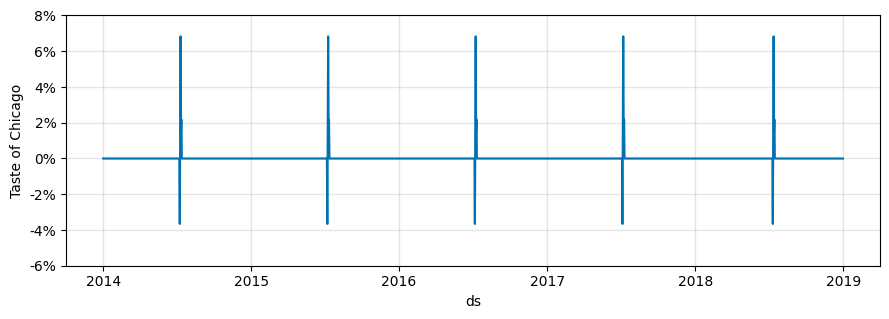

In [ ]:
#@title 🎨 Plot `Taste of Chicago` event component
fig3 = plot_forecast_component(model,
                               forecast,
                               'Taste of Chicago',
                               figsize=(10.5, 3.25))
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


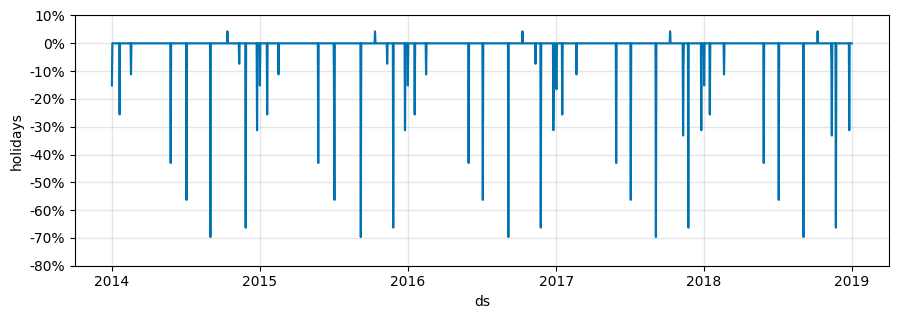

In [ ]:
#@title  🖌️ Plot `US holidays` event component
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                holidays_prior_scale=10)
model.add_country_holidays(country_name='US')
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = plot_forecast_component(model,
                              forecast,
                              'holidays',
                              figsize=(10.5, 3.25))
plt.show()


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


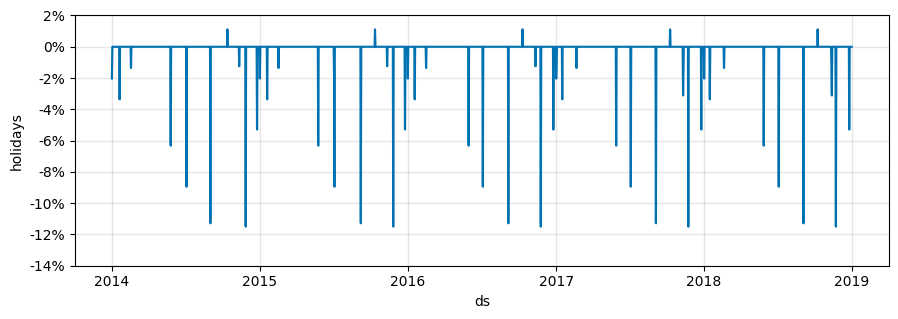

In [ ]:
#@title  ⬇️ Plot `US holidays` event component with updated `holidays_prior_scale`
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                holidays_prior_scale=0.05)
model.add_country_holidays(country_name='US')
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = plot_forecast_component(model,
                              forecast,
                              'holidays',
                              figsize=(10.5, 3.25))
plt.show()

,ds,holiday,prior_scale,lower_window,upper_window
0,2014-01-01,New Year's Day,NaN,NaN,NaN
1,2014-01-20,Martin Luther King Jr. Day,NaN,NaN,NaN
2,2014-02-17,Washington's Birthday,NaN,NaN,NaN
3,2014-05-26,Memorial Day,NaN,NaN,NaN
4,2014-07-04,Independence Day,NaN,NaN,NaN
5,2014-07-09,Taste of Chicago,0.1,0.0,4.0
6,2014-09-01,Labor Day,NaN,NaN,NaN
7,2014-10-13,Columbus Day,NaN,NaN,NaN
8,2014-11-11,Veterans Day,NaN,NaN,NaN
9,2014-11-27,Thanksgiving Day,NaN,NaN,NaN


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


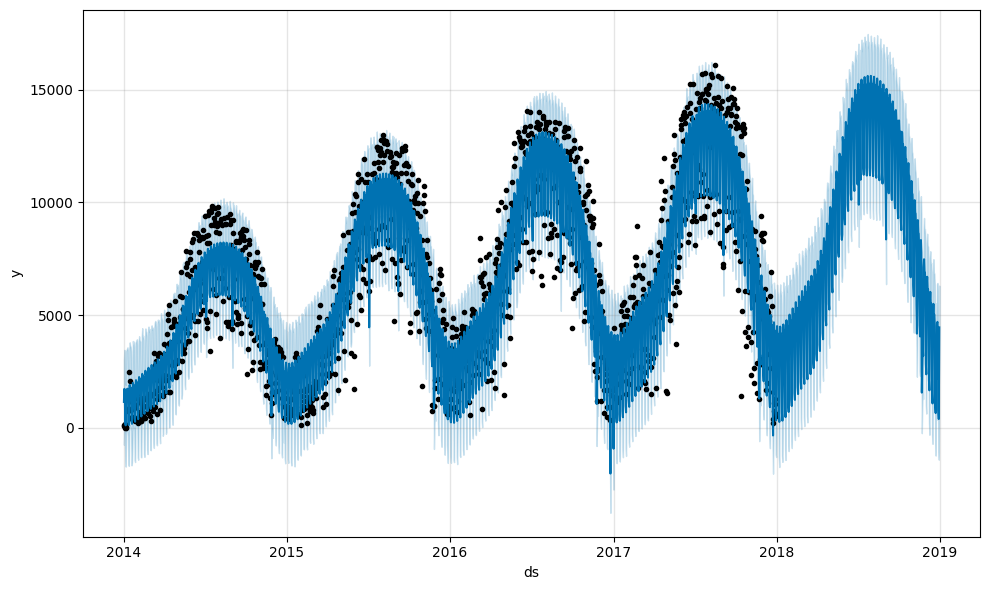

In [ ]:
#@title 🐘 Build new `holidays` df with customized prior scale for each
holidays = make_holidays_df(year_list=year_list, country='US')

black_friday = pd.DataFrame({'holiday': 'Black Friday',
                             'ds': pd.to_datetime(['2014-11-28',
                                                   '2015-11-27',
                                                   '2016-11-25',
                                                   '2017-11-24',
                                                   '2018-11-23']),
                             'prior_scale': 1})
christmas_eve = pd.DataFrame({'holiday': 'Christmas Eve',
                              'ds': pd.to_datetime(['2014-12-24',
                                                    '2015-12-24',
                                                    '2016-12-24',
                                                    '2017-12-24',
                                                    '2018-12-24']),
                              'prior_scale': 1})

taste_of_chicago = pd.DataFrame({'holiday': 'Taste of Chicago',
                                 'ds': pd.to_datetime(['2014-07-09',
                                                       '2015-07-08',
                                                       '2016-07-06',
                                                       '2017-07-05',
                                                       '2018-07-11']),
                                 'lower_window': 0,
                                 'upper_window': 4,
                                 'prior_scale': 0.1})

holidays = pd.concat([holidays,
                      black_friday,
                      christmas_eve,
                      taste_of_chicago]
                    ).sort_values('ds').reset_index(drop=True)

display(holidays.head(16))


model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                holidays=holidays,
                holidays_prior_scale=10)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)

fig = model.plot(forecast)
fig.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


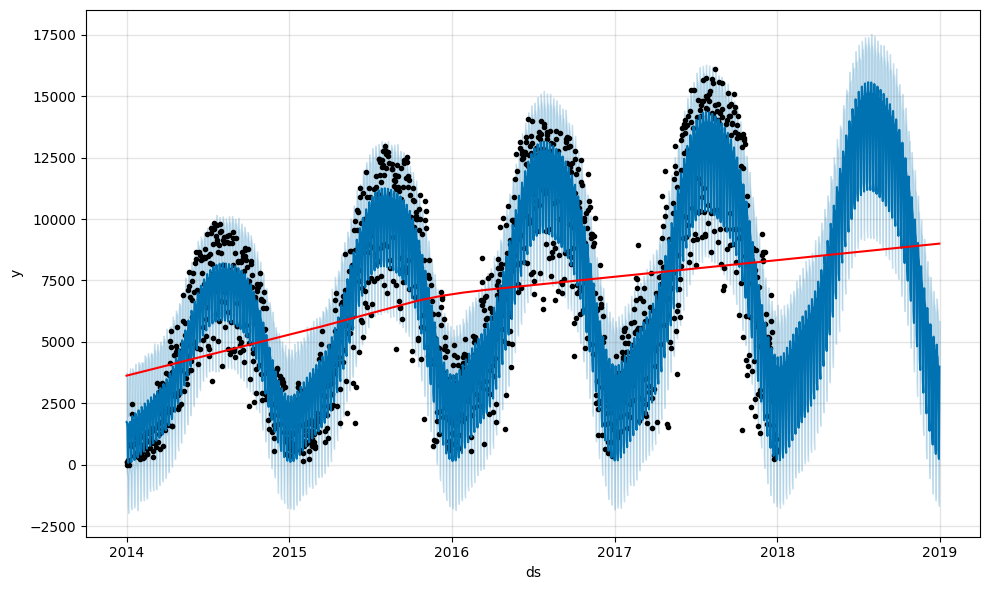

In [ ]:
#@title ↗️ Fit once again Divvy daily data with adding changepoints
df = pd.read_csv('divvy_daily.csv')
df = df[['date', 'rides']]
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

model = Prophet(growth='linear',
                seasonality_mode='multiplicative',
                yearly_seasonality=4)

model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, cp_linestyle='')
plt.show()

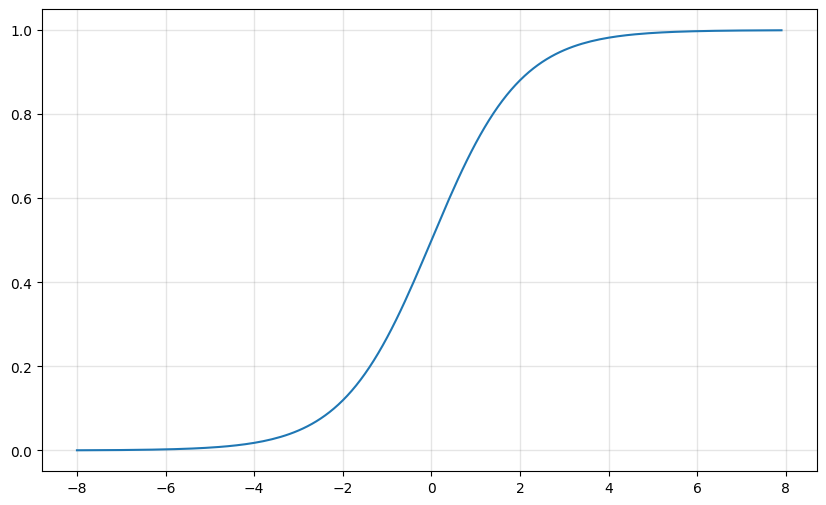

In [ ]:
#@title 🧮 Display logistic function
x = np.arange(-8, 8, .1)
y = [1 / (1 + np.e**(-val)) for val in x]

plt.figure(figsize=(10, 6))
plt.plot(x, y)
plt.grid(True, which='major', c='gray', ls='-', lw=1, alpha=0.2)
plt.show()

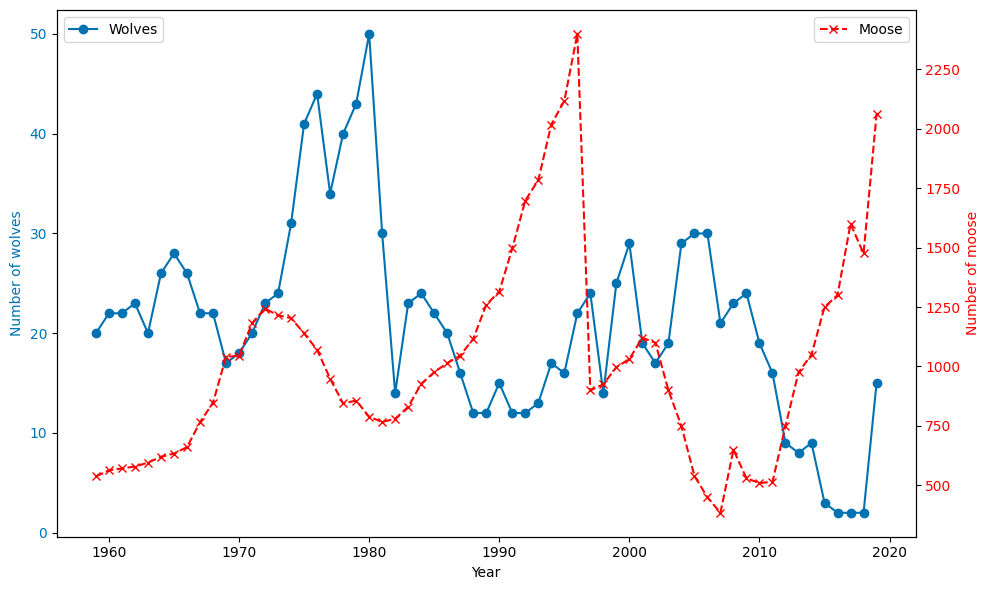

In [ ]:
#@title 🐺 Compare Wolves and Moose population data
ir = pd.read_excel('Data_wolves_moose_Isle_Royale_June2019.xlsx',
                     sheet_name='1. population level data',
                     header=1)

fig, ax1 = plt.subplots(figsize=(10, 6))
color = '#0072B2'
ax1.set_xlabel('Year')
ax1.set_ylabel('Number of wolves', color=color)
ax1.plot(ir['year'], ir['wolves'], color=color, ls='-', marker='o', label='Wolves')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'r'
ax2.set_ylabel('Number of moose', color=color)  # we already handled the x-label with ax1
ax2.plot(ir['year'], ir['moose'], color=color, ls='--', marker='x', label='Moose')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

/tmp/ipython-input-336957988.py:2: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

/tmp/ipython-input-336957988.py:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



<Figure size 1000x600 with 0 Axes>

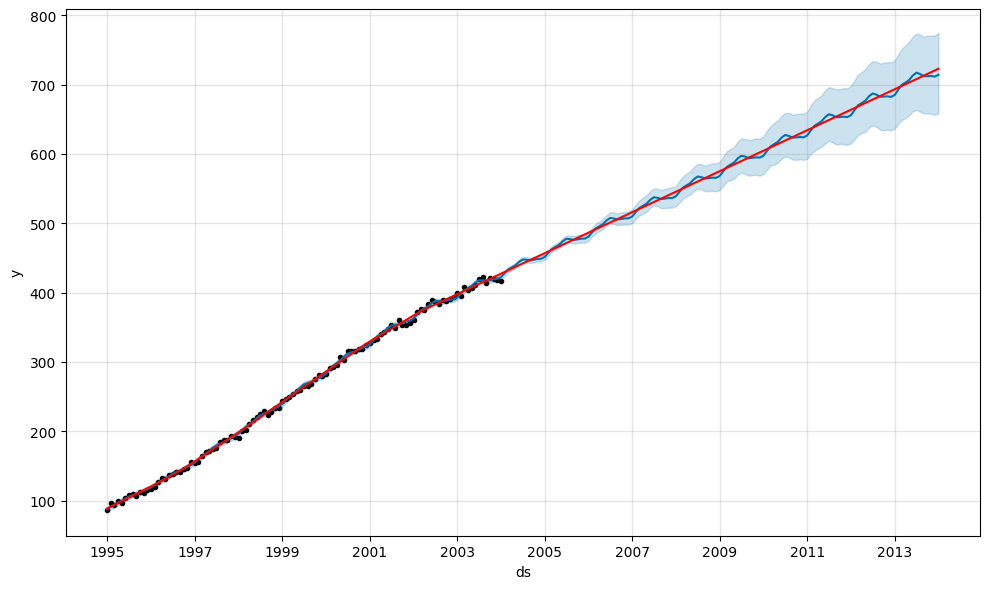

In [ ]:
#@title 🌷 Dummy logistic data with linear growth fitted
x = pd.to_datetime(pd.date_range('1995-01', '2004-02', freq='M').strftime("%Y-%b").tolist())
y = [1 / (1 + np.e ** (-.03 * (val - 50))) for val in range(len(x))]  # create logistic curve
y = [y[idx] + y[idx] * .01 * np.sin((idx - 2) * (360 / 12) * (np.pi / 180)) for idx in range(len(y))]  # add sinusoidal variation
y = [val + random.uniform(-.01, .01) for val in y]  # add noise
y = [int(500 * val) for val in y]  # scale up

plt.figure(figsize=(10, 6))

df = pd.DataFrame({'ds': pd.to_datetime(x), 'y': y})
model = Prophet(growth='linear',
                yearly_seasonality=3,
                seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=12 * 10, freq='M')
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, cp_linestyle='')
plt.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



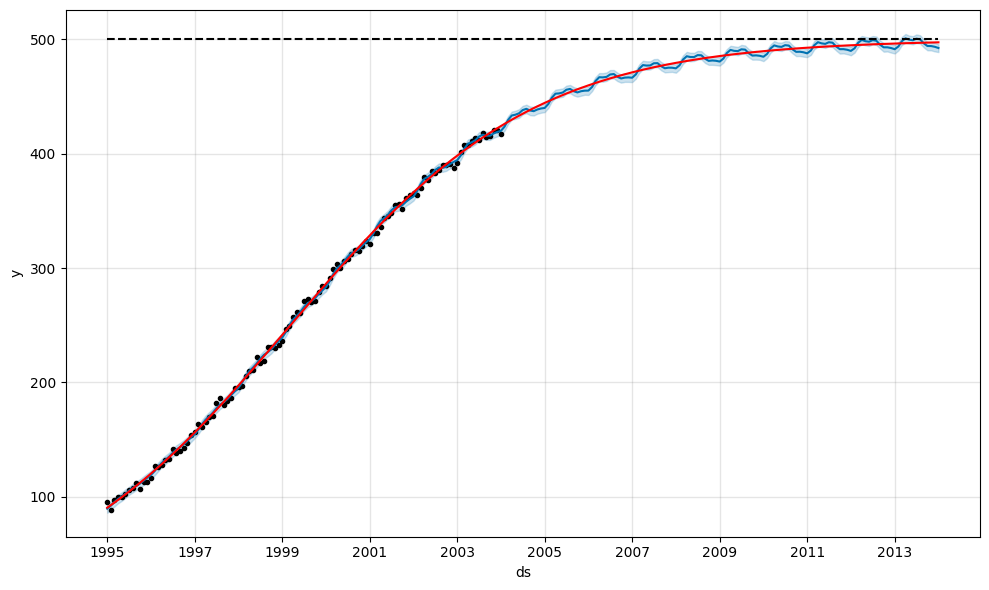

In [ ]:
#@title 🪵 Fit logistic growth to logistic data
df['cap'] = 500
model = Prophet(growth='logistic',
                yearly_seasonality=3,
                seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=12 * 10, freq='M')
future['cap'] = 500
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, cp_linestyle='')
plt.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



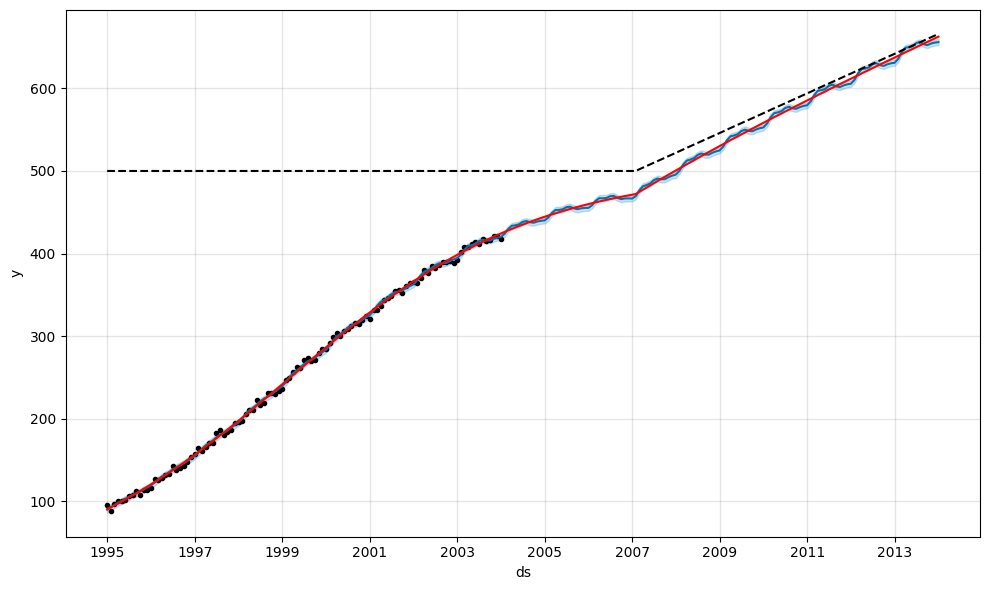

In [ ]:
#@title ⚙️ Cap evolving over time
def set_cap(row, df):
    if row.year < 2007:
        return 500
    else:
        pop_2007 = 500
        idx_2007 = df[df['ds'].dt.year == 2007].index[0]
        idx_date = df[df['ds'] == row].index[0]
        return pop_2007 + 2 * (idx_date - idx_2007)

df['cap'] = df['ds'].apply(set_cap, args=(df,))

model = Prophet(growth='logistic',
                yearly_seasonality=3,
                seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=12 * 10, freq='M')
future['cap'] = future['ds'].apply(set_cap, args=(future,))
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, cp_linestyle='')
plt.show()

/tmp/ipython-input-3964713773.py:2: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

/tmp/ipython-input-3964713773.py:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



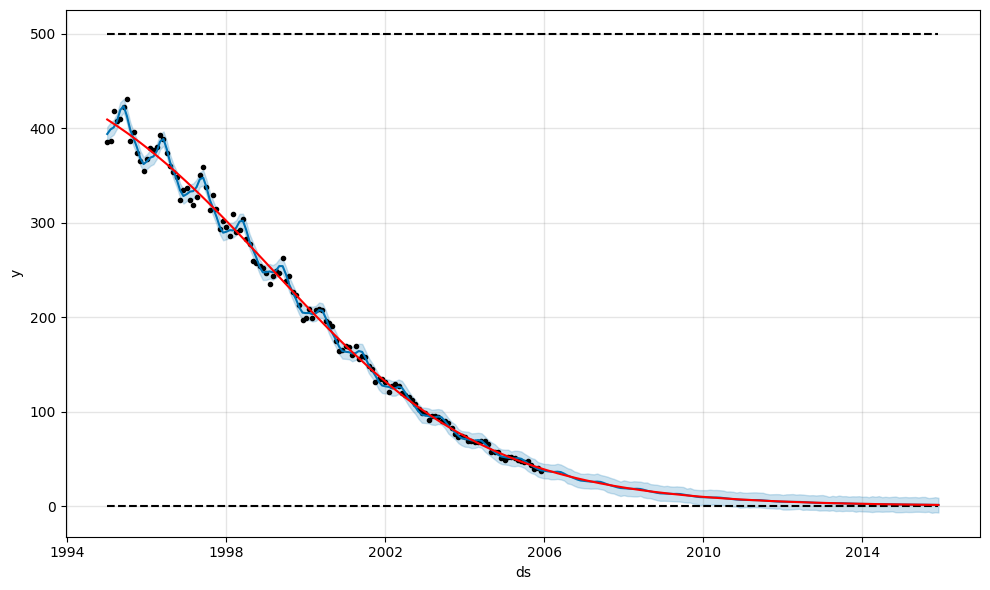

In [ ]:
#@title 🧢 Dummy logistic negative growth  with `cap` and `floor` inplace
x = pd.to_datetime(pd.date_range('1995-01','2035-02', freq='M').strftime("%Y-%b").tolist())
y = [1 - 1 / (1 + np.e ** (-.03 * (val - 50))) for val in range(len(x))]  # create logistic curve
y = [y[idx] + y[idx] * .05 * np.sin((idx - 2) * (360 / 12) * (np.pi / 180)) for idx in range(len(y))]  # add sinusoidal variation
y = [val + 5 * val * random.uniform(-.01, .01) for val in y]  # add noise
y = [int(500 * val) for val in y]  # scale up

df2 = pd.DataFrame({'ds': pd.to_datetime(x), 'y': y})
df2 = df2[df2['ds'].dt.year < 2006]
df2['cap'] = 500
df2['floor'] = 0

model = Prophet(growth='logistic',
                yearly_seasonality=3,
                seasonality_mode='multiplicative')
model.fit(df2)
future = model.make_future_dataframe(periods=12 * 10, freq='M')
future['cap'] = 500
future['floor'] = 0
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, cp_linestyle='')
plt.show()

/tmp/ipython-input-2235073685.py:3: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

/tmp/ipython-input-2235073685.py:3: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



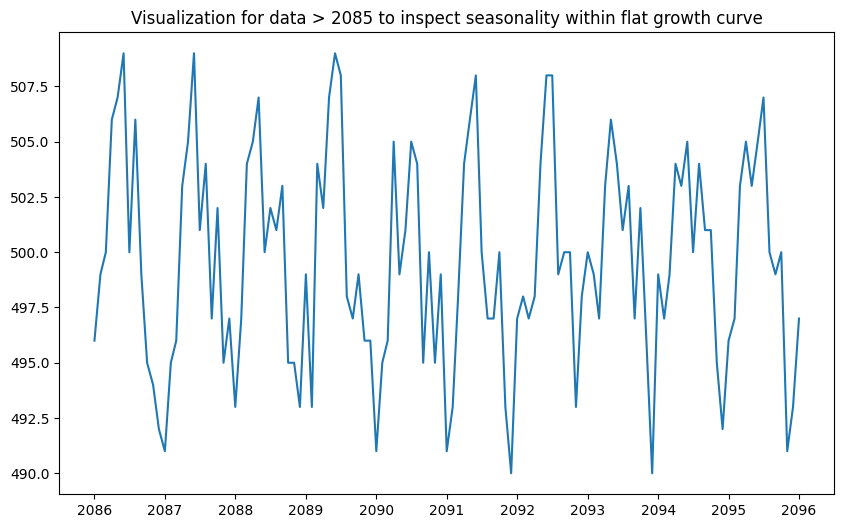

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



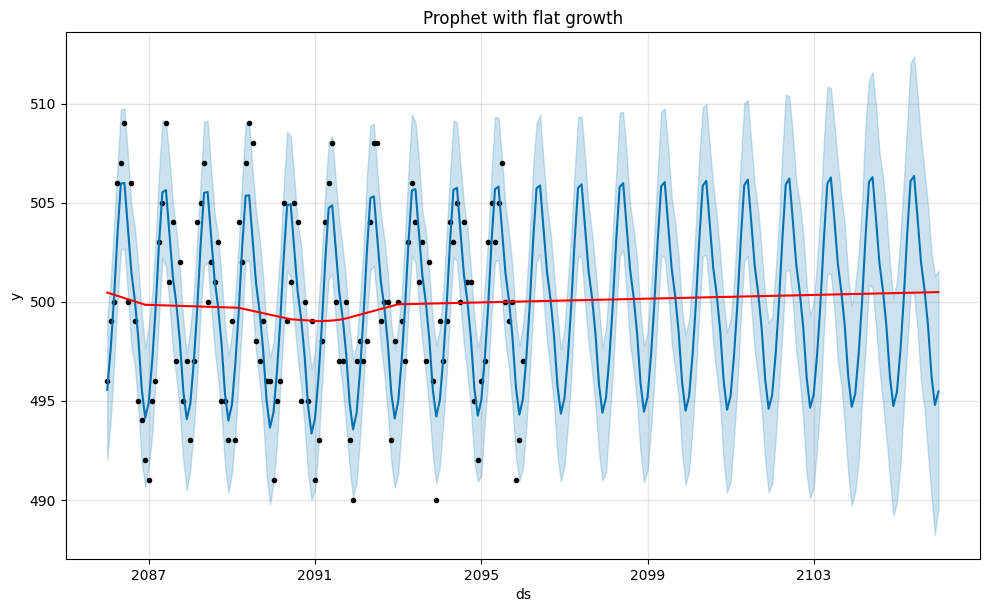

In [ ]:
#@title ✒️ Flat growth with short end-period visualisation

x = pd.to_datetime(pd.date_range('1995-01','2096-02', freq='M').strftime("%Y-%b").tolist())
y = [1 / (1 + np.e ** (-.03 * (val - 50))) for val in range(len(x))]  # create logistic curve
y = [y[idx] + y[idx] * .01 * np.sin((idx - 2) * (360 / 12) * (np.pi / 180)) for idx in range(len(y))]  # add sinusoidal variation
y = [val + 1 * val * random.uniform(-.01, .01) for val in y]  # add noise
y = [int(500 * val) for val in y]  # scale up

df = pd.DataFrame({'ds': pd.to_datetime(x), 'y': y})
df = df[df['ds'].dt.year > 2085]
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'])
plt.title("Visualization for data > 2085 to inspect seasonality within flat growth curve")
plt.show()

model = Prophet(growth='linear',
                yearly_seasonality=3,
                seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=12 * 10, freq='M')
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, cp_linestyle='')
plt.title("Prophet with flat growth")
plt.show()


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.12/dist-packages/prophet/forecaster.py:1872: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



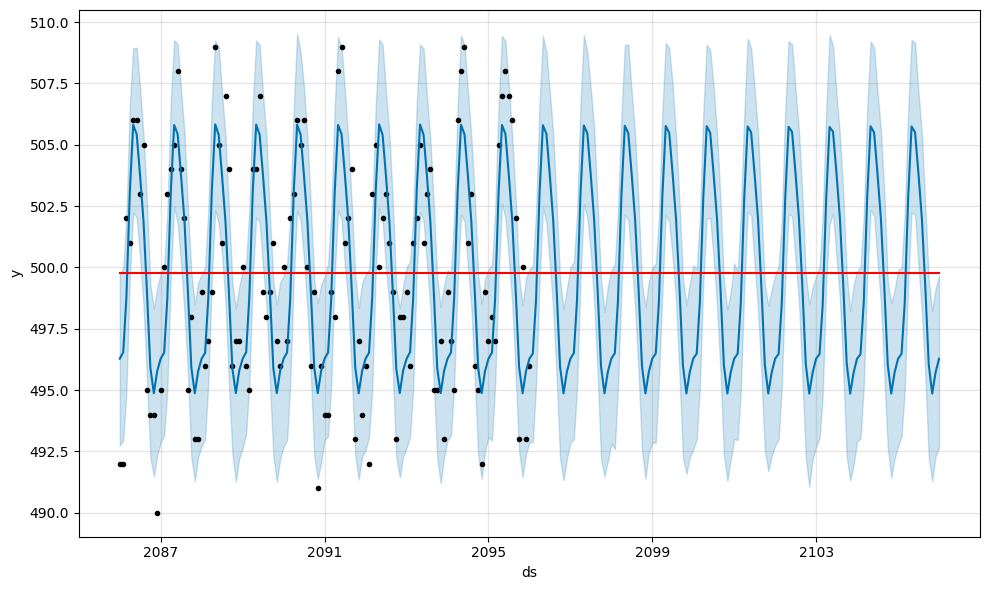

In [ ]:
#@title 🌎 Flat growth with additive seasonality mode
model = Prophet(growth='flat',
                yearly_seasonality=3)
model.fit(df)
future = model.make_future_dataframe(periods=12 * 10, freq='M')
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, cp_linestyle='')
plt.show()

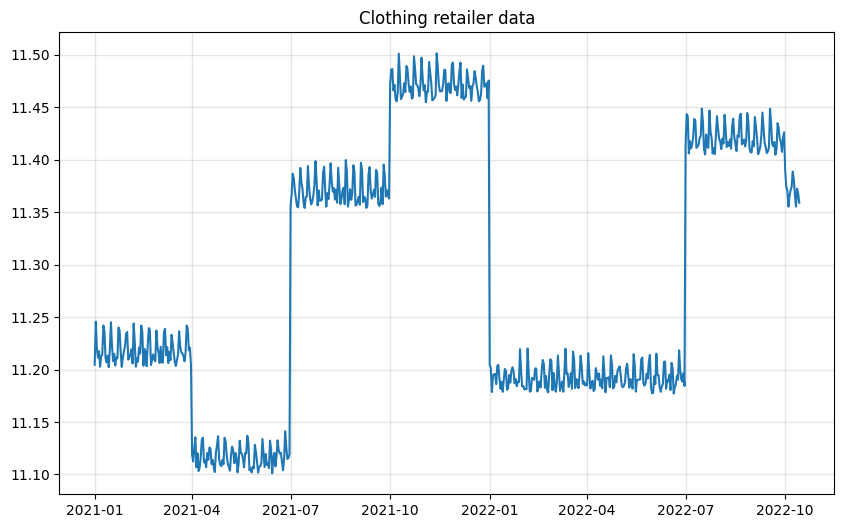

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


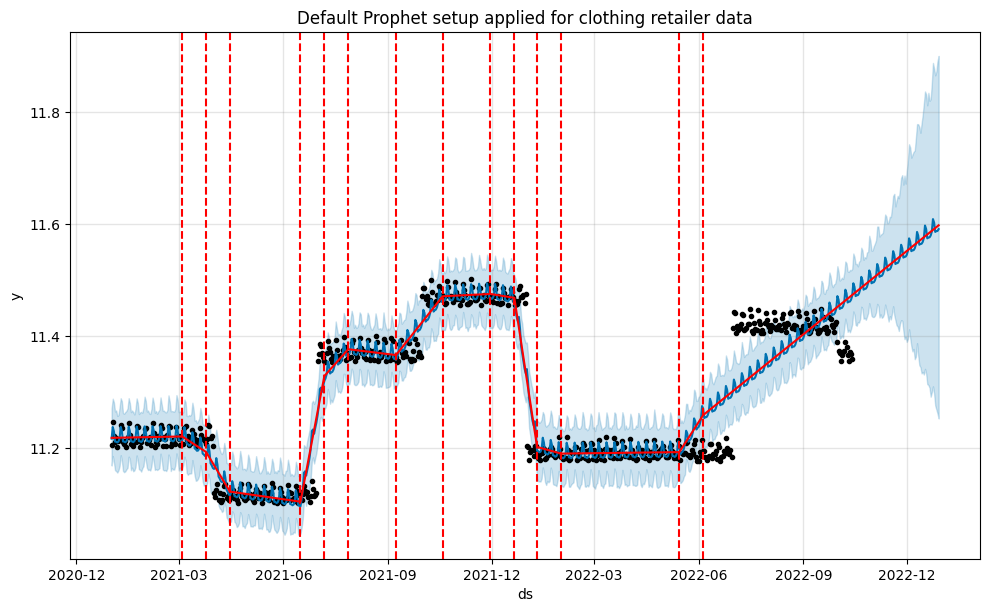

In [ ]:
#@title 👗 Visualize `clothing_retailer` data
df = pd.read_csv('clothing_retailer.csv')
df['ds'] = pd.to_datetime(df['ds'])

plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'])
plt.grid(True, which='major', c='gray', ls='-', lw=1, alpha=0.2)
plt.ticklabel_format(useOffset=False, axis='y')
plt.title("Clothing retailer data")
plt.show()
model = Prophet()
model.fit(df)
future = model.make_future_dataframe(76)
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.title("Default Prophet setup applied for clothing retailer data")
plt.show()

In [ ]:
#@title 📶 ProphetStepWise class definition
class ProphetStepWise(Prophet):

    def fit(self, df, **kwargs):
        m = super().fit(df, **kwargs)
        if self.growth == 'flat' and self.changepoints is not None:
            kinit = self.stepwise_growth_init(self.history, self.changepoints)
            self.params['m_'] = kinit[1]
        return self


    @staticmethod
    def stepwise_growth_init(df, changepoints):
        k = 0
        if len(changepoints) == 0:
            k = 0
            m = df['y_scaled'].mean()
        else:
            m = []
            last_cp = pd.Timestamp.min
            for cp in changepoints:
                df_  = df[(df.ds > last_cp) & (df.ds <= cp)]['y_scaled']
                m.append(df_.mean())
                last_cp = cp
            cp = changepoints.iloc[-1]
            df_  = df[df.ds > cp]['y_scaled']
            m.append(df_.mean())
        return k, m

    @staticmethod
    def stepwise_trend(t, m, changepoint_ts):
        if changepoint_ts[0] == 0:
            m_t = m * np.ones_like(t)
        else:
            m_t = np.ones_like(t)
            last_t_s = changepoint_ts[0]-1
            for s, t_s in enumerate(changepoint_ts):
                indx = (t <= t_s) & (t > last_t_s)
                m_t[indx] = m[s]
                last_t_s = t_s

            t_s = changepoint_ts[-1]
            indx = (t > t_s)
            m_t[indx] = m[-1]
        return m_t

    def sample_predictive_trend(self, df, iteration):
        """Simulate the trend using the extrapolated generative model.
        Parameters
        ----------
        df: Prediction dataframe.
        iteration: Int sampling iteration to use parameters from.
        Returns
        -------
        np.array of simulated trend over df['t'].
        """
        k = self.params['k'][iteration]
        m = self.params['m'][iteration]
        deltas = self.params['delta'][iteration]

        t = np.array(df['t'])
        T = t.max()

        # New changepoints from a Poisson process with rate S on [1, T]
        if T > 1:
            S = len(self.changepoints_t)
            n_changes = np.random.poisson(S * (T - 1))
        else:
            n_changes = 0
        if n_changes > 0:
            changepoint_ts_new = 1 + np.random.rand(n_changes) * (T - 1)
            changepoint_ts_new.sort()
        else:
            changepoint_ts_new = []

        # Get the empirical scale of the deltas, plus epsilon to avoid NaNs.
        lambda_ = np.mean(np.abs(deltas)) + 1e-8

        # Sample deltas
        deltas_new = np.random.laplace(0, lambda_, n_changes)

        # Prepend the times and deltas from the history
        changepoint_ts = np.concatenate((self.changepoints_t,
                                         changepoint_ts_new))
        deltas = np.concatenate((deltas, deltas_new))

        if self.growth == 'linear':
            trend = self.piecewise_linear(t, deltas, k, m, changepoint_ts)
        elif self.growth == 'logistic':
            cap = df['cap_scaled']
            trend = self.piecewise_logistic(t, cap, deltas, k, m,
                                            changepoint_ts)
        elif self.growth == 'flat':
            trend = self.stepwise_trend(t, self.params['m_'], self.changepoints_t)

        return trend * self.y_scale + df['floor']

    def predict_trend(self, df):
        """Predict trend using the prophet model.
        Parameters
        ----------
        df: Prediction dataframe.
        Returns
        -------
        Vector with trend on prediction dates.
        """
        k = np.nanmean(self.params['k'])
        m = np.nanmean(self.params['m'])
        deltas = np.nanmean(self.params['delta'], axis=0)

        t = np.array(df['t'])
        if self.growth == 'linear':
            trend = self.piecewise_linear(t, deltas, k, m, self.changepoints_t)
        elif self.growth == 'logistic':
            cap = df['cap_scaled']
            trend = self.piecewise_logistic(
                t, cap, deltas, k, m, self.changepoints_t)
        elif self.growth == 'flat':
            # constant trend
            trend = self.stepwise_trend(t, self.params['m_'], self.changepoints_t)
        return trend * self.y_scale + df['floor']

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


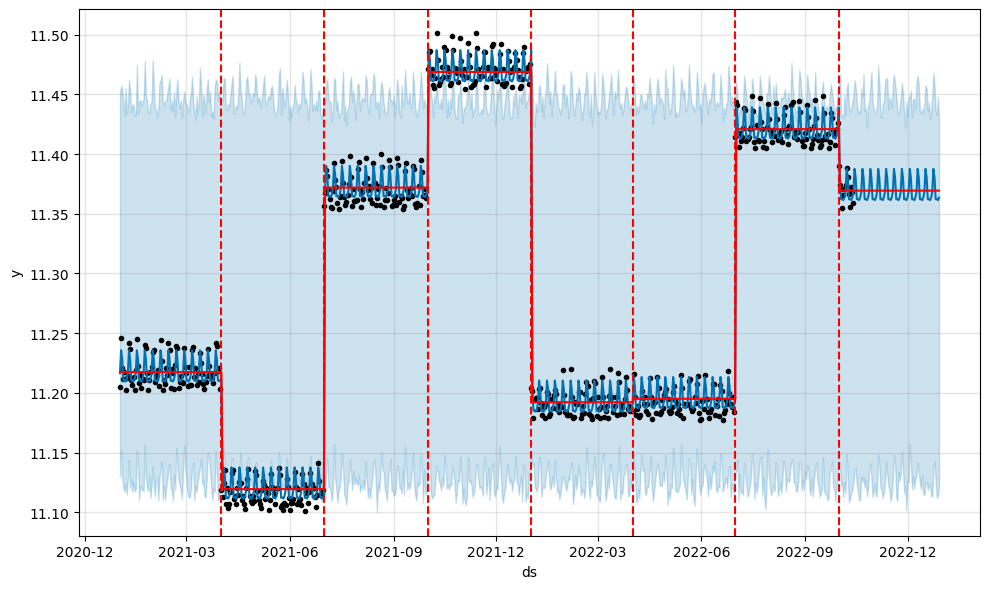

In [ ]:
#@title 🪜 Apply ProphetStepWise with defining manually the changepoints
model = ProphetStepWise(growth='flat',
                        changepoints= ['2021-04-01',
                                       '2021-07-01',
                                       '2021-10-01',
                                       '2022-01-01',
                                       '2022-04-01',
                                       '2022-07-01',
                                       '2022-10-01'])
model.fit(df)

future = model.make_future_dataframe(76)
forecast = model.predict(future)

fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, threshold=0.00);

In [ ]:
#@title 🪚 `Set_changepoints` function definition
def set_changepoints(df, n_changepoints, changepoint_range):
    """Set changepoints
    Sets changepoints to the dates of changepoints. Either:
    1) We are generating a grid of them.
    2) The user prefers no changepoints be used.
    """
    df = df.sort_values('ds').reset_index(drop=True)
    # Place potential changepoints evenly through first
    # `changepoint_range` proportion of the history
    hist_size = int(np.floor(df.shape[0] * changepoint_range))
    if n_changepoints + 1 > hist_size:
        n_changepoints = hist_size - 1
        print('n_changepoints greater than number of observations. Using {}.'.format(n_changepoints))
    if n_changepoints > 0:
        cp_indexes = np.linspace(0,
                                 hist_size - 1,
                                 n_changepoints + 1).round().astype(int)
        changepoints = df.iloc[cp_indexes]['ds'].tail(-1)
    else:
        # set empty changepoints
        changepoints = pd.Series(pd.to_datetime([]), name='ds')
    return changepoints

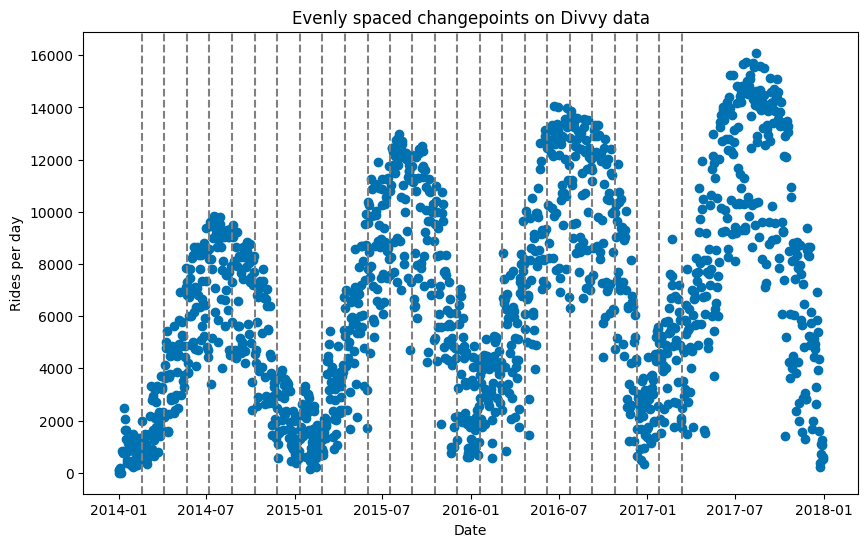

In [ ]:
#@title 🚴‍♀️ Custom changepoints on Divvy data
df = pd.read_csv('divvy_daily.csv')
df = df[['date', 'rides']]
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']
changepoints = set_changepoints(df, 25, 0.8)

plt.figure(figsize=(10, 6))
plt.scatter(df['ds'], df['y'], c='#0072B2')
for cp in changepoints:
    plt.axvline(x=cp, c='gray', ls='--')
plt.xlabel('Date')
plt.ylabel('Rides per day')
plt.title("Evenly spaced changepoints on Divvy data")
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Model.params['delta']:
 [[ 2.7959154e-08 -9.9740120e-09 -8.3914667e-10 -1.4743056e-07
   1.2554640e-07  2.0716706e-08  1.4644690e-07  2.3794391e-05
   2.9022634e-02  3.2689800e-06  1.1385242e-08 -9.4949362e-08
  -1.0306626e-02 -9.1808228e-02 -8.3505722e-02 -5.4902124e-02
  -3.4372421e-02 -9.5517801e-05 -8.2280380e-08 -6.9464165e-10
  -1.8208652e-08  5.8047532e-09  3.3108928e-08  2.1158171e-08
   1.9948423e-08]]


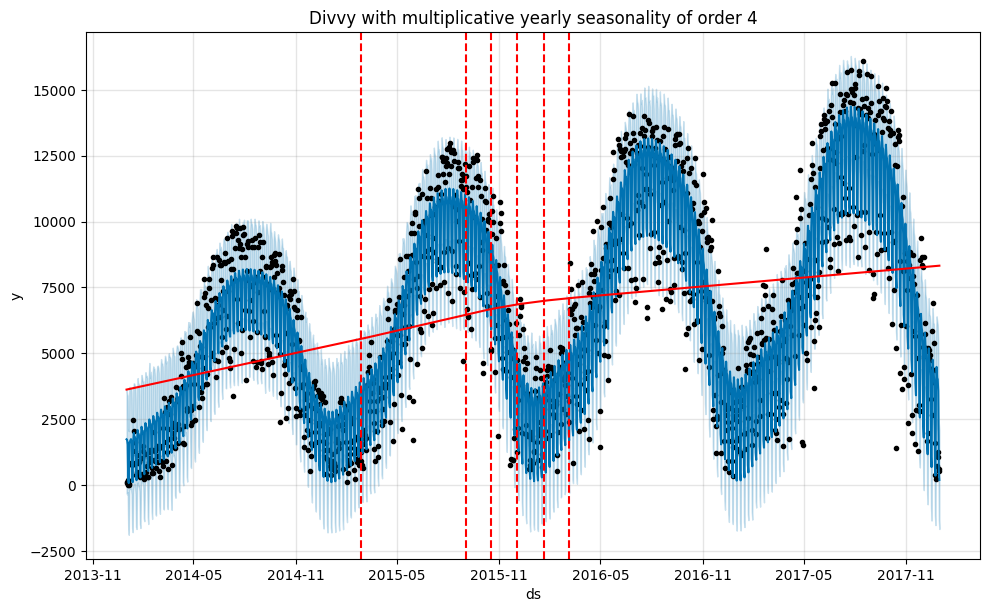

In [ ]:
#@title 🧒 Divvy with multiplicative yearly seasonality of order 4

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4)
model.fit(df)
forecast = model.predict()
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
print(f"Model.params['delta']:\n {model.params['delta']}")
plt.title("Divvy with multiplicative yearly seasonality of order 4")
plt.show()

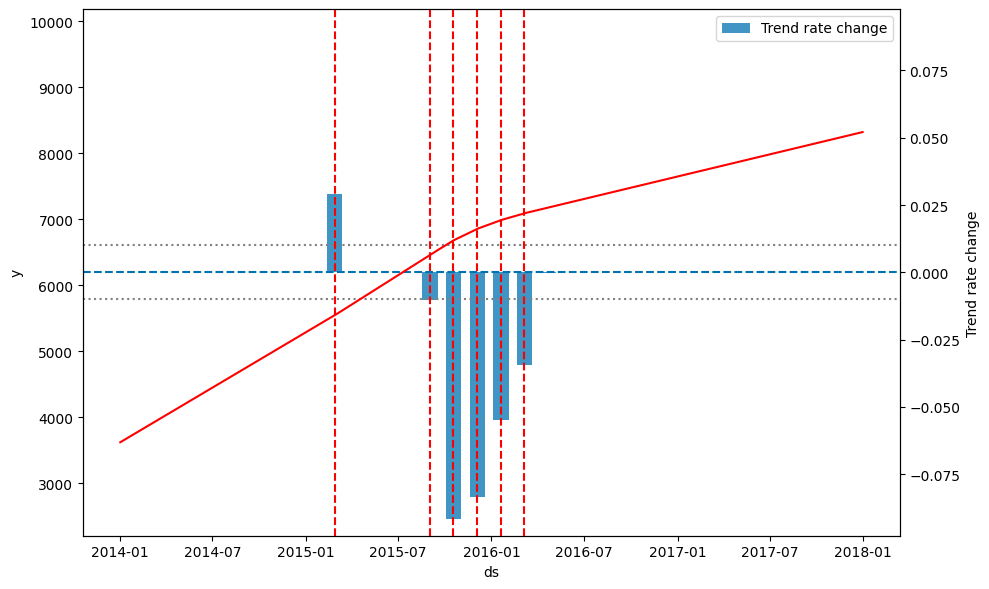

In [ ]:
#@title ⬆️ Plot trend rate change
ylims = fig.gca().get_ylim()
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'k'
add_changepoints_to_plot(ax1, model, forecast, trend=True)
ax1.set_xlabel('ds')
ax1.set_ylabel('y', color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_ylim(ylims[0] + 5000, ylims[1] - 7000)
ax1.grid(False)

ax2 = ax1.twinx()

color = '#0072B2'
ax2.set_ylabel('Trend rate change')
ax2.bar(changepoints, model.params['delta'][0], width=30, color=color, alpha=.75, label='Trend rate change')
ax2.tick_params(axis='y', labelcolor='k')
ax2.axhline(y=0, c=color, ls='--')
ax2.axhline(y=.01, c='gray', ls=':')
ax2.axhline(y=-.01, c='gray', ls=':')
ax2.set_ylim(top=-ax2.get_ylim()[0], bottom=ax2.get_ylim()[0])

ax2.legend()

fig.tight_layout()
ax1.set_zorder(1)
ax1.patch.set_visible(False)
plt.show()

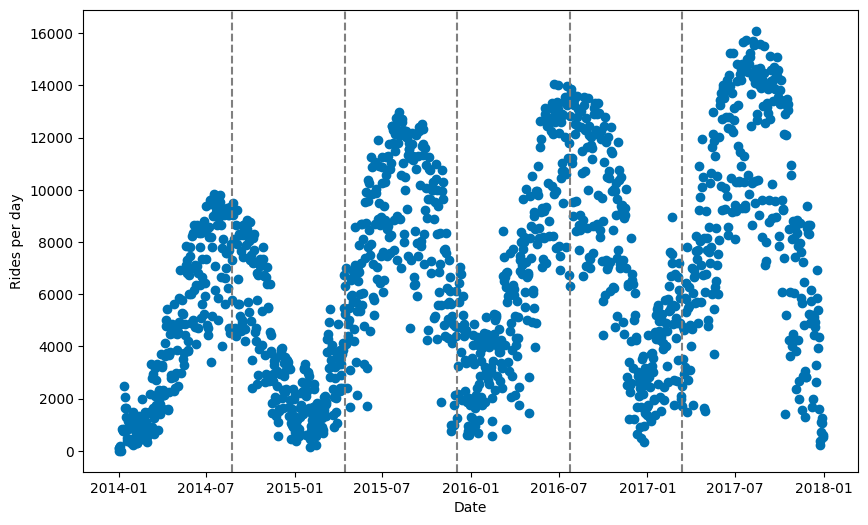

In [ ]:
#@title 👦 Setting `n_changepoints` = 5
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                n_changepoints=5)

plt.figure(figsize=(10, 6))
plt.scatter(df['ds'], df['y'], c='#0072B2')
for cp in set_changepoints(df, 5, 0.8):
    plt.axvline(x=cp, c='gray', ls='--')
plt.xlabel('Date')
plt.ylabel('Rides per day')
plt.show()

In [ ]:
#@title 🧱 Setting changepoint_range = 0.5
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                changepoint_range=.5)

plt.figure(figsize=(10, 6))
plt.scatter(df['ds'], df['y'], c='#0072B2')
for cp in set_changepoints(df, 25, 0.5):
    plt.axvline(x=cp, c='gray', ls='--')
plt.xlabel('Date')
plt.ylabel('Rides per day')
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


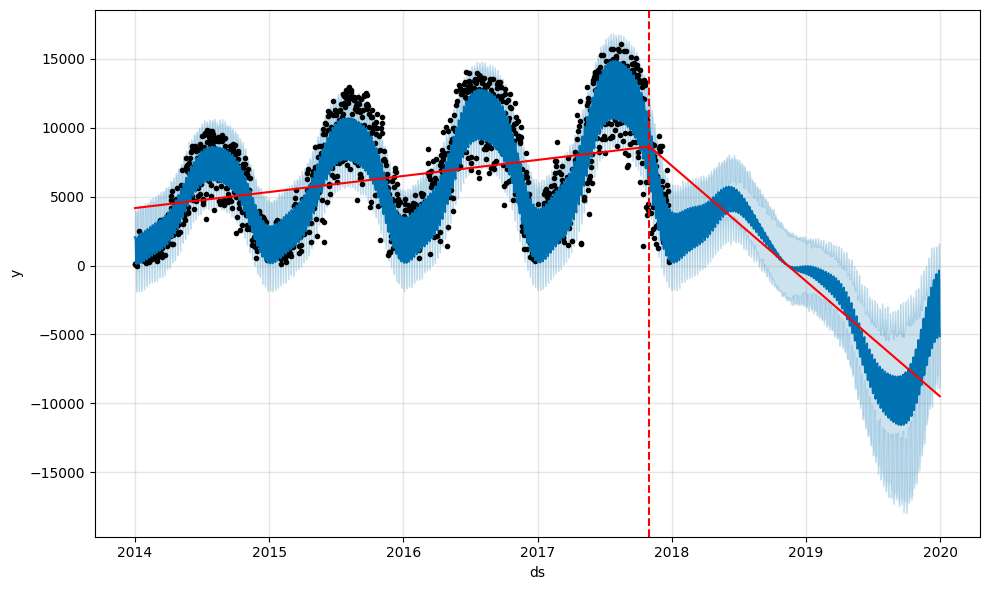

In [ ]:
#@title ⚖️ Setting changepoints as date + changepoint_prior_scale = 50
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                changepoints=['2017-11-01'],
                changepoint_prior_scale=50)
model.fit(df)
future = model.make_future_dataframe(periods=365 * 2)
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


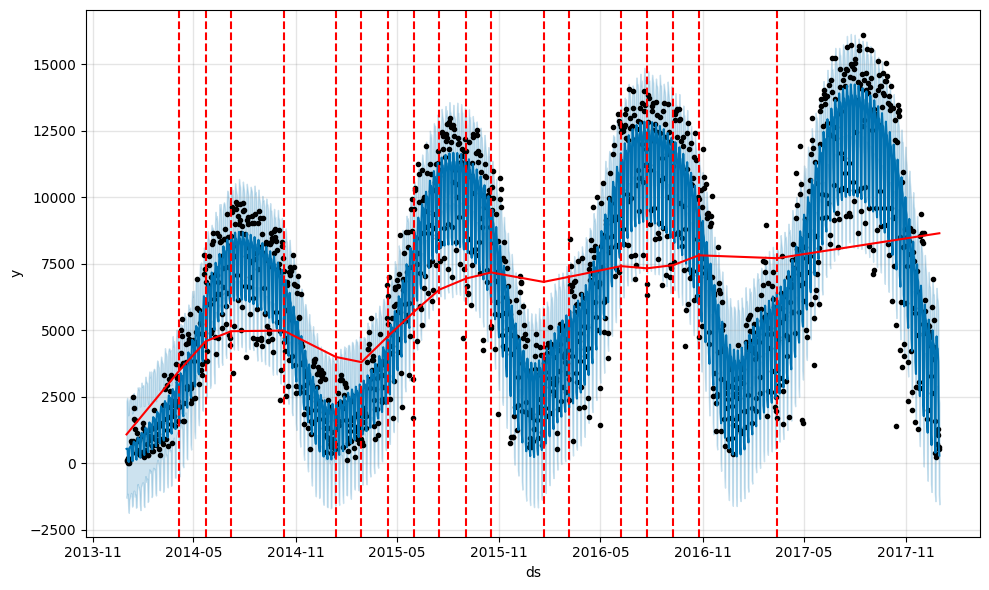

In [ ]:
#@title ⚖️ Changepoint_prior_scale = 1
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                changepoint_prior_scale=1)
model.fit(df)
forecast = model.predict()
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


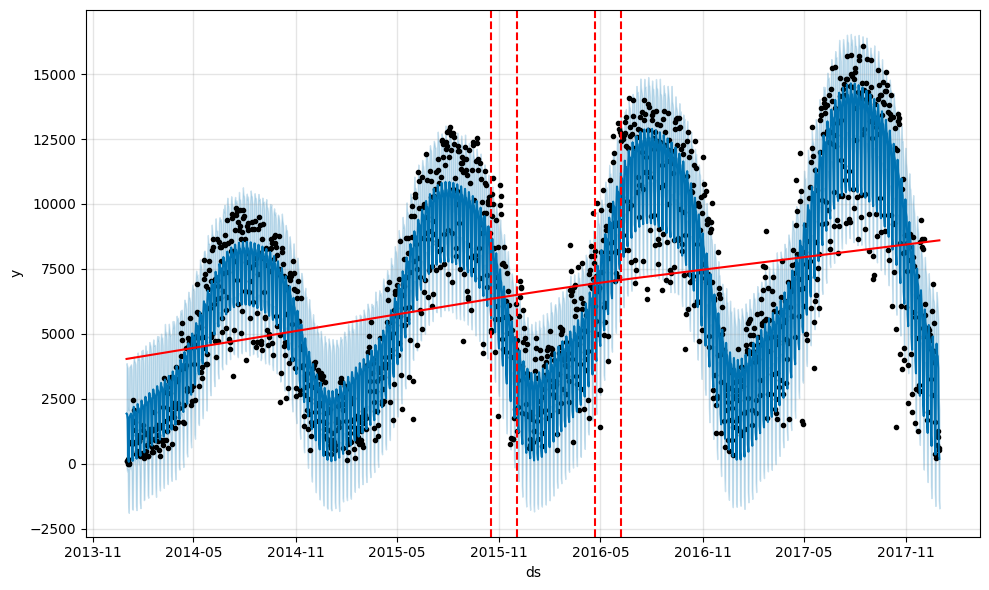

In [ ]:
#@title 🥷 Changepoint_prior_scale = 0.007
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4,
                changepoint_prior_scale=.007)
model.fit(df)
forecast = model.predict()
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()

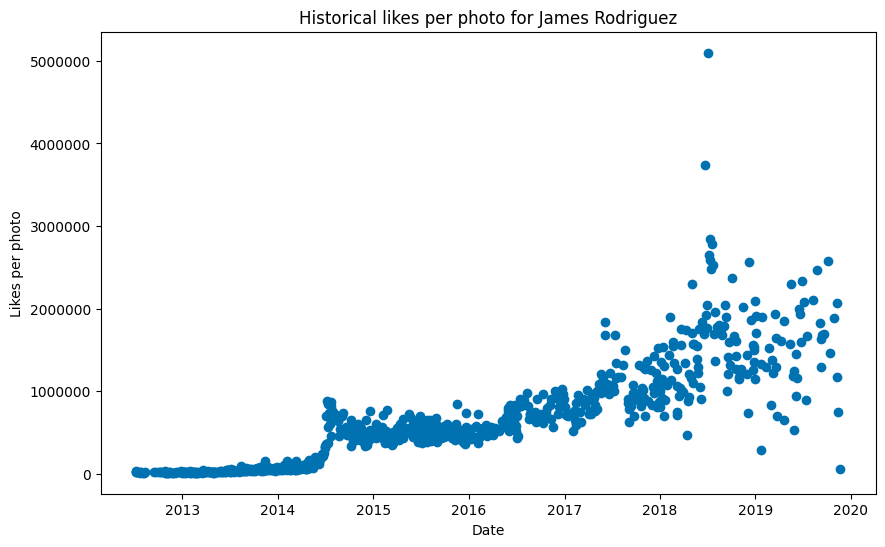

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


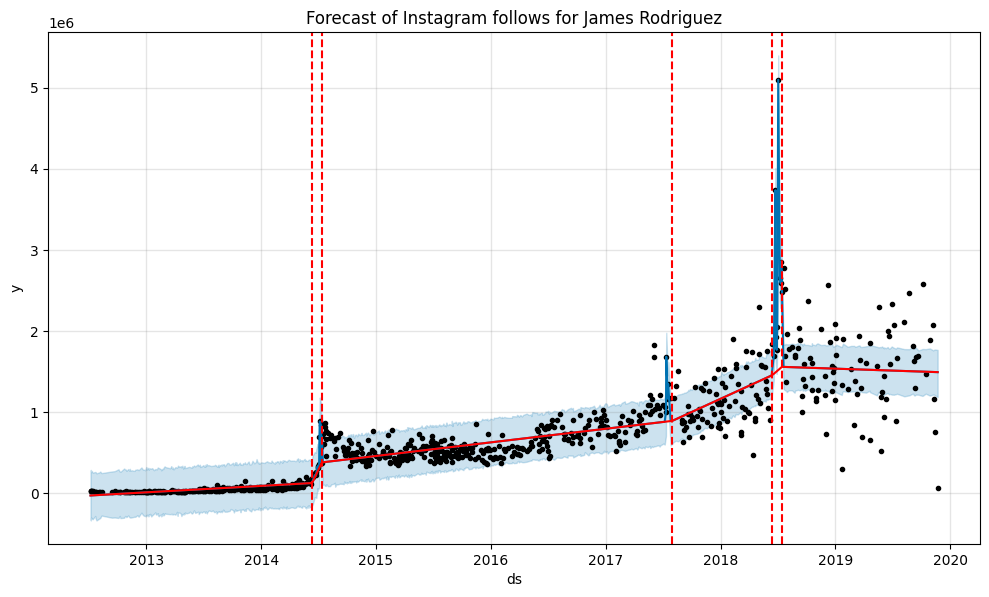

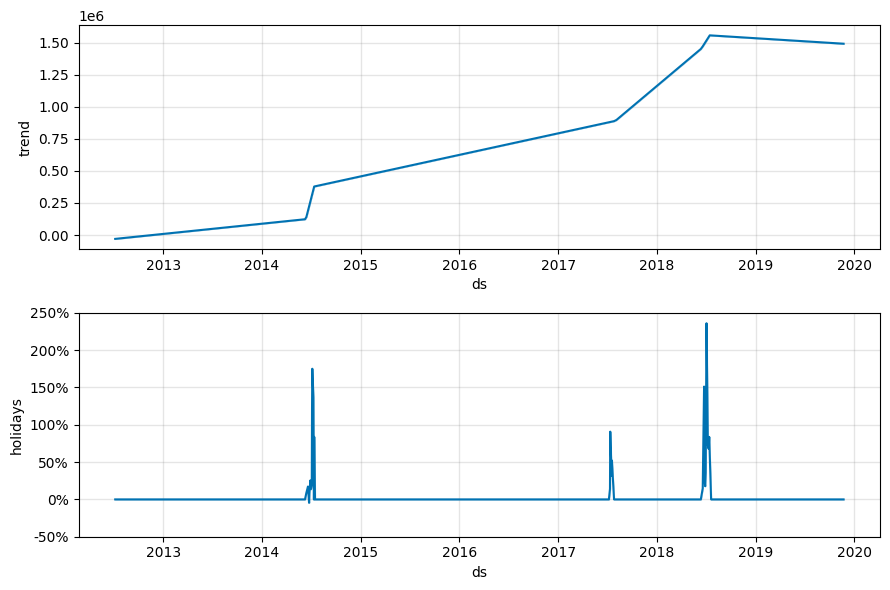

In [ ]:
#@title ⚽ James Rodriguez Instagram follows with changepoints for World Cup and transfer to Bayern Munich
df = pd.read_csv('instagram_jamesrodriguez10.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.columns = ['ds', 'y']

plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], c='#0072B2')
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Date')
plt.ylabel('Likes per photo')
plt.title('Historical likes per photo for James Rodriguez')
plt.show()

wc_2014 = pd.DataFrame({'holiday': 'World Cup 2014',
                        'ds': pd.to_datetime(['2014-06-12']),
                        'lower_window': 0,
                        'upper_window': 31})
wc_2018 = pd.DataFrame({'holiday': 'World Cup 2018',
                        'ds': pd.to_datetime(['2018-06-14']),
                        'lower_window': 0,
                        'upper_window': 31})
signing = pd.DataFrame({'holiday': 'Bayern Munich',
                        'ds': pd.to_datetime(['2017-07-11']),
                        'lower_window': 0,
                        'upper_window': 14})

special_events = pd.concat([wc_2014, wc_2018, signing])

changepoints = ['2014-06-12',
                '2014-07-13',
                '2017-07-11',
                '2017-07-31',
                '2018-06-14',
                '2018-07-15']

model = Prophet(seasonality_mode='multiplicative',
                holidays=special_events,
                yearly_seasonality=False,
                weekly_seasonality=False,
                changepoint_prior_scale=1,
                changepoints=changepoints)
model.fit(df)
forecast = model.predict()
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.title("Forecast of Instagram follows for James Rodriguez")
plt.show()
fig2 = model.plot_components(forecast)
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


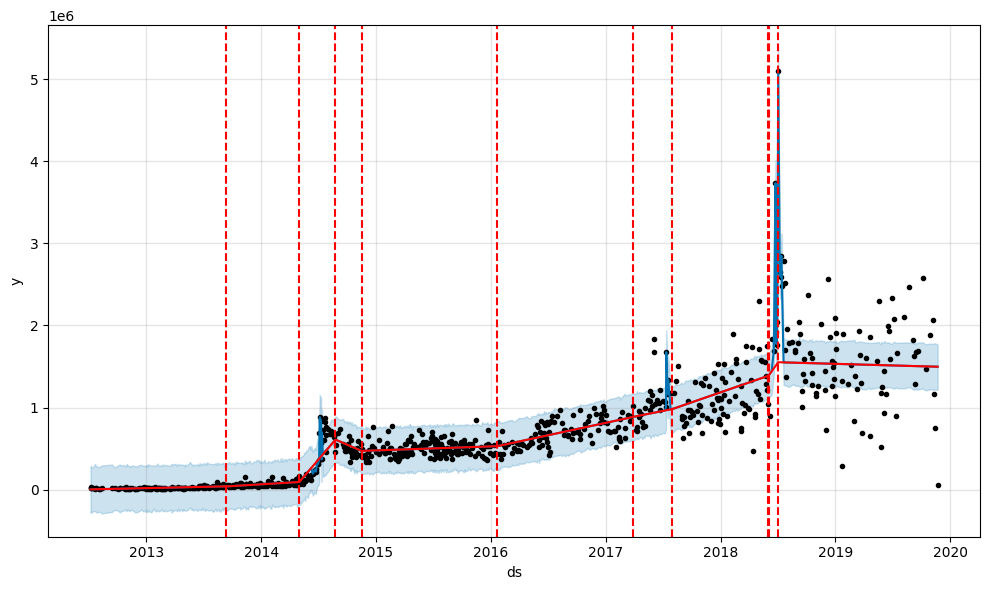

In [ ]:
#@title 🪸 Merge different changepoints
changepoints = set_changepoints(df, 5, .8)
new_changepoints = pd.Series(pd.to_datetime(['2014-05-02',
                                             '2014-08-25',
                                             '2017-07-31',
                                             '2018-06-14',
                                             '2018-06-04',
                                             '2018-07-03']))
changepoints = pd.concat([changepoints, new_changepoints])
changepoints = changepoints.sort_values().reset_index(drop=True)

model = Prophet(seasonality_mode='multiplicative',
                holidays=special_events,
                yearly_seasonality=False,
                weekly_seasonality=False,
                changepoint_prior_scale=1,
                changepoints=changepoints)
model.fit(df)
forecast = model.predict()
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()

Preview counts per weather:
weather
clear             41
cloudy          1346
not clear          2
rain or snow      69
Name: weather, dtype: int64
Preview df after get_dummies method:


,ds,y,temp,clear,cloudy,not clear,rain or snow
0,2014-01-01,95,19.483158,False,False,False,True
1,2014-01-02,111,16.833333,False,False,False,True
2,2014-01-03,6,-5.633333,True,False,False,False
3,2014-01-04,181,30.007735,False,False,False,True
4,2014-01-05,32,16.756250,False,False,False,True


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


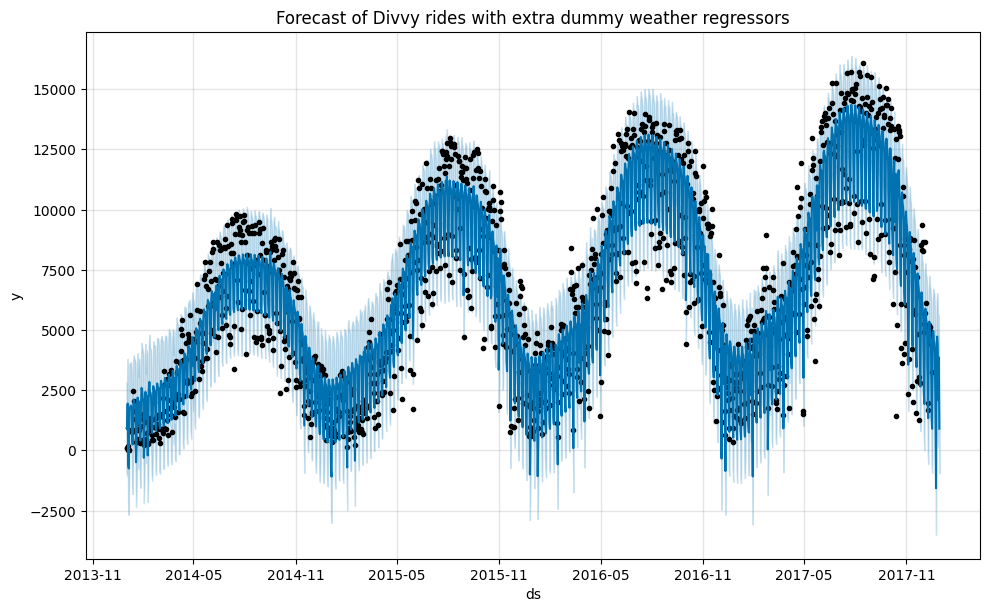

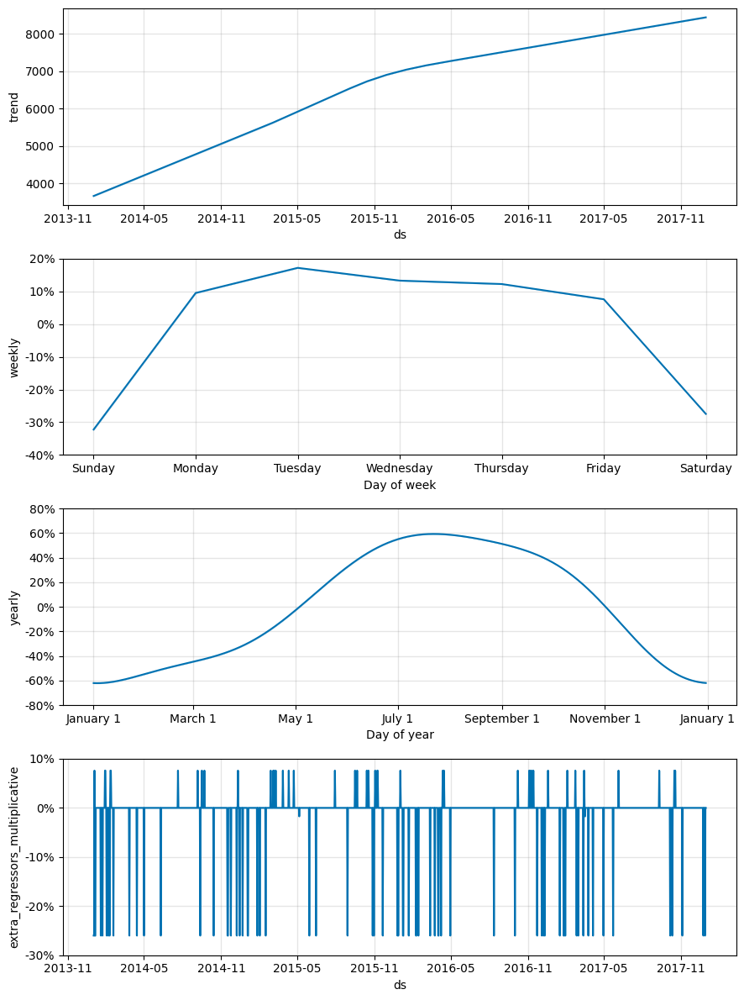

In [ ]:
#@title ❄️ Divvy forecast with extra weather regressors (`clear` with `prior_scale`=10)
df = pd.read_csv('divvy_daily.csv')
print("Preview counts per weather:")
print(df.groupby('weather')['weather'].count())
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y', 'temp', 'weather']
df = pd.get_dummies(df, columns=['weather'], prefix='', prefix_sep='')
print("Preview df after get_dummies method:")
display(df.head())

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4)
model.add_regressor(name='clear',
                    prior_scale=10,
                    standardize='auto',
                    mode='multiplicative')
model.add_regressor('not clear')
model.add_regressor('rain or snow')
# Remove final 2 weeks of training data
train = df[df['ds'] < df['ds'].max() - timedelta(weeks=2)]
model.fit(train)

future = model.make_future_dataframe(periods=14)
future['clear'] = df['clear']
future['not clear'] = df['not clear']
future['rain or snow'] = df['rain or snow']
forecast = model.predict(future)

fig=model.plot(forecast)
plt.title("Forecast of Divvy rides with extra dummy weather regressors")
plt.show()
fig2 = model.plot_components(forecast)
plt.show()

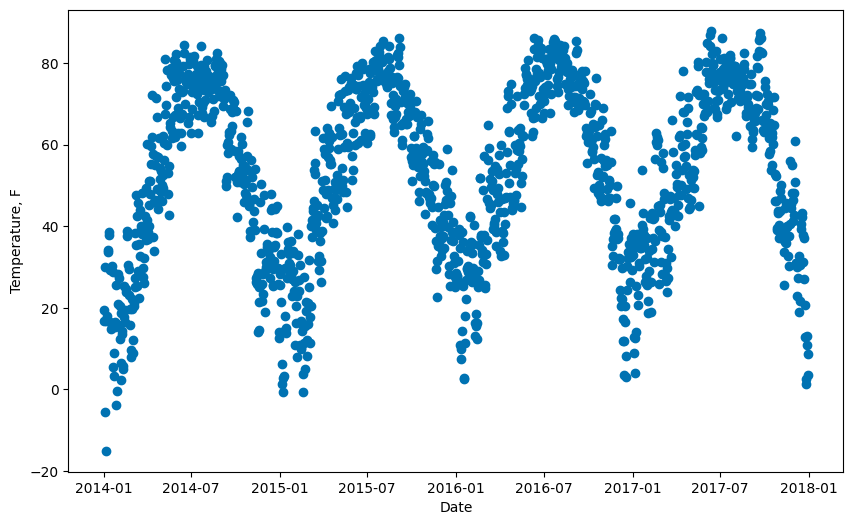

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


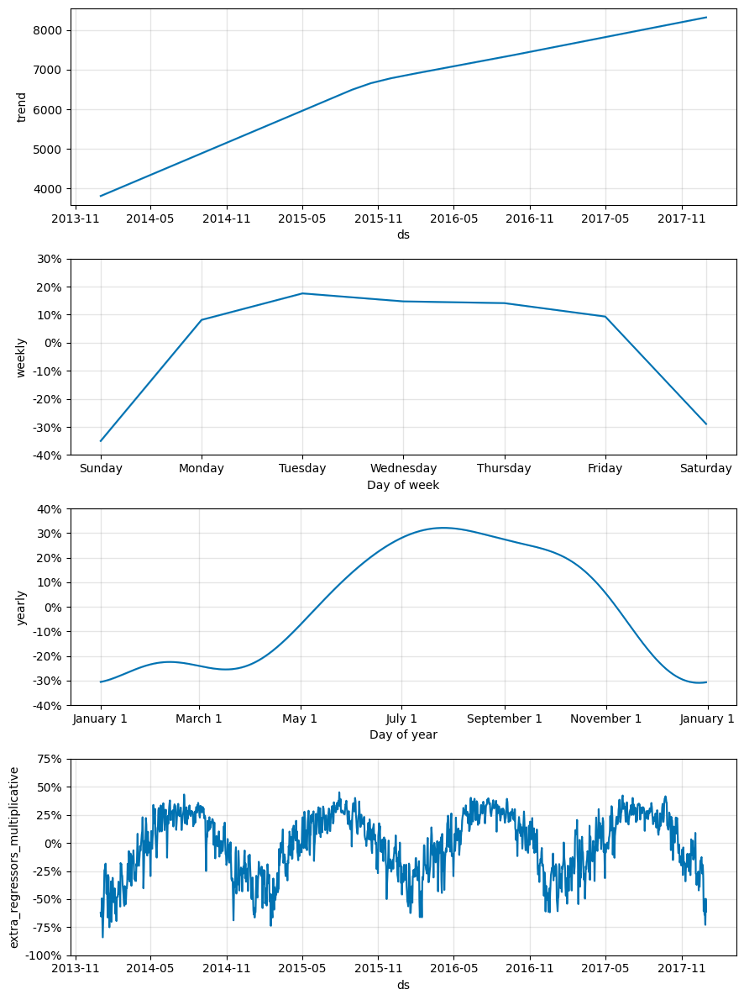

Regressor coefficients


,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,temp,multiplicative,53.423706,0.012285,0.012285,0.012285
1,clear,multiplicative,0.000000,0.110607,0.110607,0.110607
2,not clear,multiplicative,0.000000,-0.033506,-0.033506,-0.033506
3,rain or snow,multiplicative,0.000000,-0.205482,-0.205482,-0.205482


In [ ]:
#@title 🎐 Add extra weather regressors with default setup
plt.figure(figsize=(10, 6))
plt.scatter(pd.to_datetime(df['ds']), df['temp'], c='#0072B2')
plt.xlabel('Date')
plt.ylabel('Temperature, F')
plt.show()

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=4)
model.add_regressor('temp')
model.add_regressor('clear')
model.add_regressor('not clear')
model.add_regressor('rain or snow')

model.fit(train)

future = model.make_future_dataframe(periods=14)
future['temp'] = df['temp']
future['clear'] = df['clear']
future['not clear'] = df['not clear']
future['rain or snow'] = df['rain or snow']
forecast = model.predict(future)

fig2 = model.plot_components(forecast)
plt.show()

print("Regressor coefficients")
display(regressor_coefficients(model))

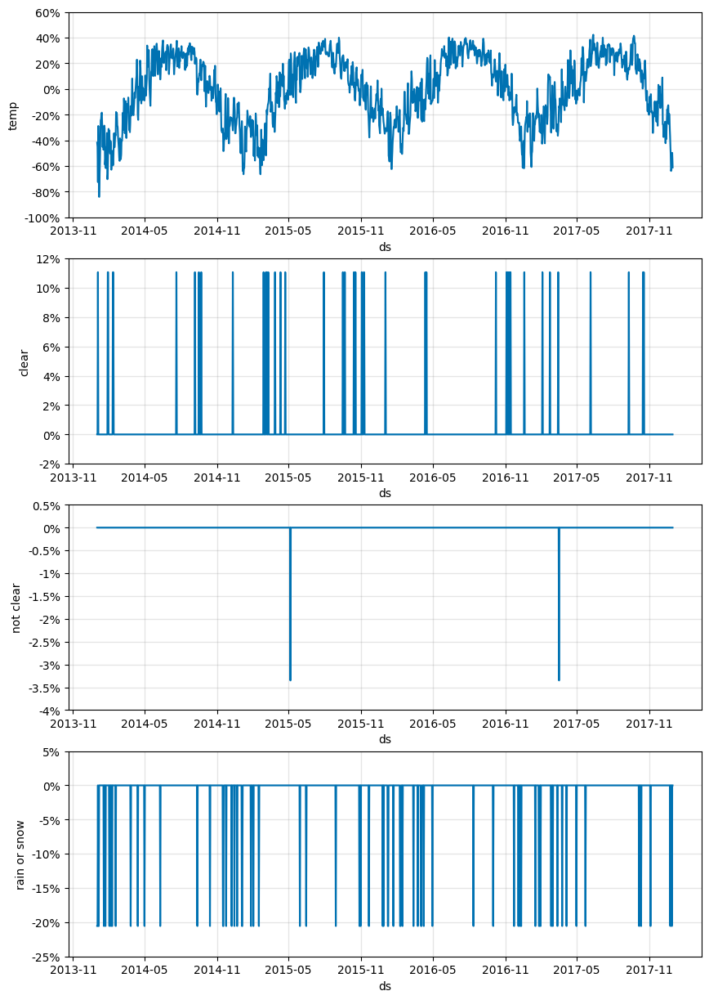

In [ ]:
#@title 🏘️ Plot all regressors separately
fig, axes = plt.subplots(len(regressor_coefficients(model)),
                         figsize=(10, 15))
for i, regressor in enumerate(
    regressor_coefficients(model)['regressor']):
    plot_forecast_component(model,
                            forecast,
                            regressor,
                            axes[i])
plt.show()

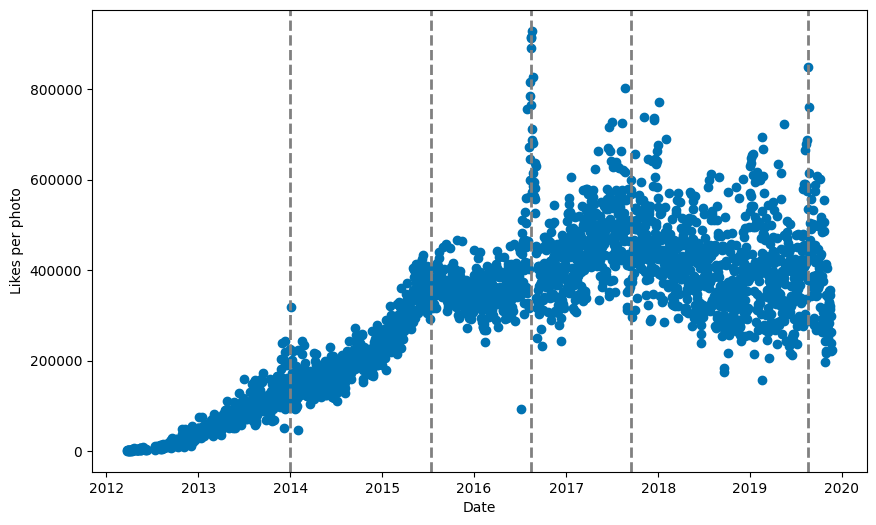

In [ ]:
#@title 📷 Instagram of National Geographic with some outliers indicated
df = pd.read_csv('instagram_natgeo.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.columns = ['ds', 'y']

plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], c='#0072B2')
plt.ticklabel_format(style='plain', axis='y')
plt.axvline(pd.to_datetime('2014-01-01'), c='gray', ls='--', lw=2)
plt.axvline(pd.to_datetime('2015-07-15'), c='gray', ls='--', lw=2)
plt.axvline(pd.to_datetime('2016-08-15'), c='gray', ls='--', lw=2)
plt.axvline(pd.to_datetime('2017-09-15'), c='gray', ls='--', lw=2)
plt.axvline(pd.to_datetime('2019-08-20'), c='gray', ls='--', lw=2)
plt.xlabel('Date')
plt.ylabel('Likes per photo')
plt.title("Instagram of National Geographic")
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


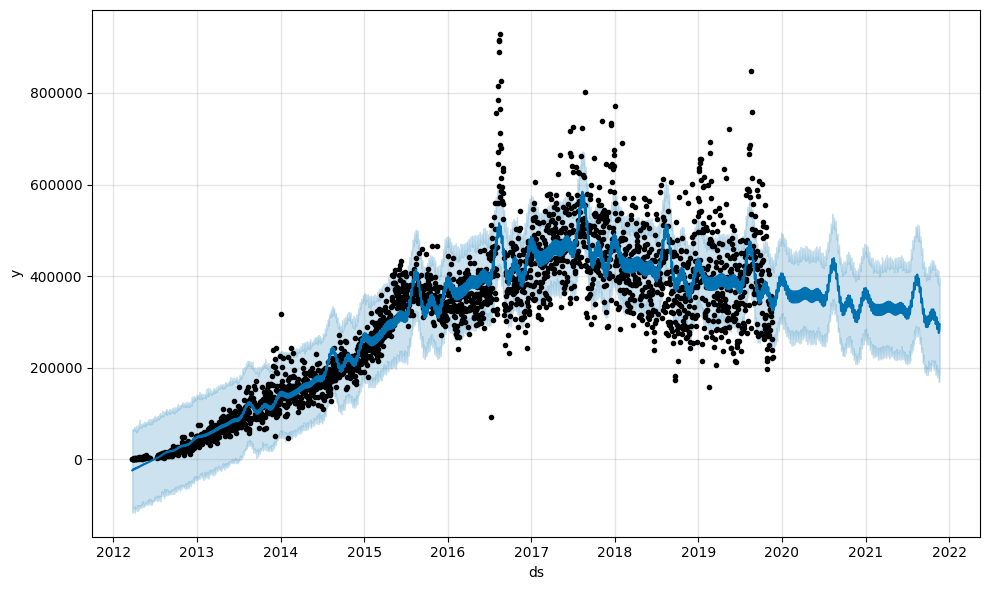

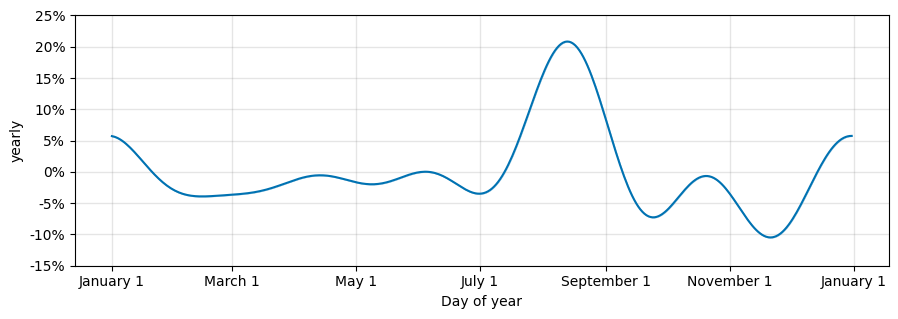

In [ ]:
#@title 6️⃣ Fit Prophet with yearly seasonality of order 6 and plot yearly component
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=6)
model.fit(df)
future = model.make_future_dataframe(periods=365 * 2)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()


plot_yearly(model, figsize=(10.5, 3.25))
plt.show()

In [ ]:
#@title 🐛 Do the same but filter out the outliers
df2 = df[(df['ds'] < '2016-07-29') | (df['ds'] > '2016-09-01')]
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=6)
model.fit(df2)
future = model.make_future_dataframe(periods=365 * 2)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

plot_yearly(model, figsize=(10.5, 3.25))
plt.show()

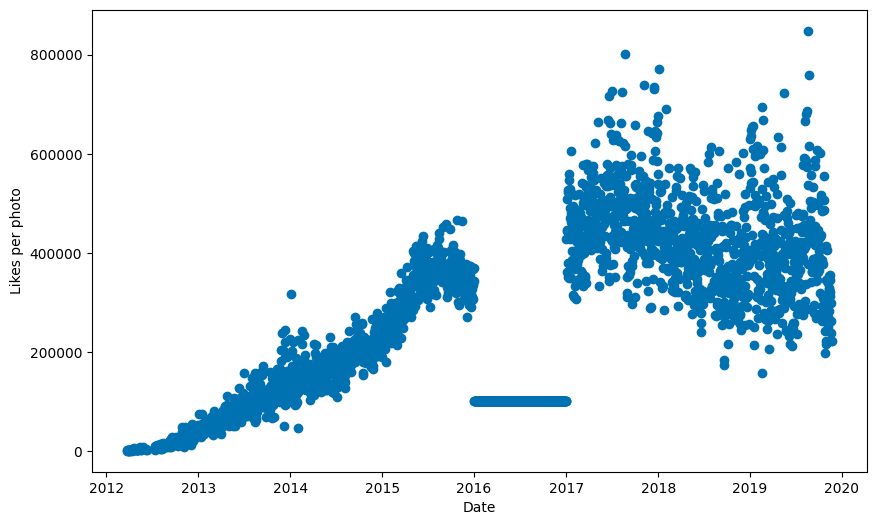

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


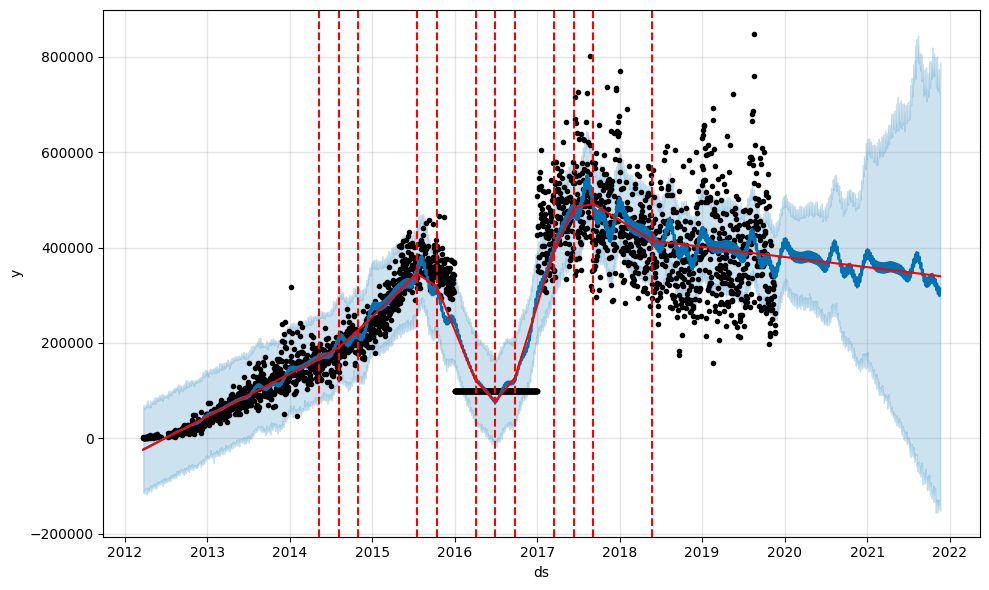

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


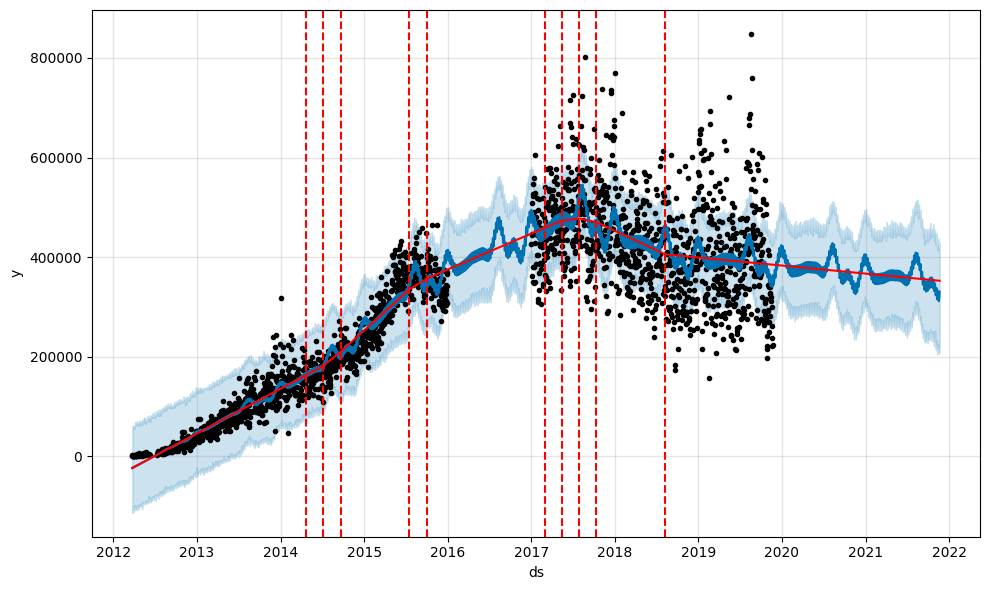

In [ ]:
#@title 🛑 Mess the data and make 2016 be a flat line. Remove this data and re-fit
df3 = df.copy()
df3.loc[df3['ds'].dt.year == 2016, 'y'] = 100000

plt.figure(figsize=(10, 6))
plt.scatter(x=df3['ds'], y=df3['y'], c='#0072B2')
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Date')
plt.ylabel('Likes per photo')
plt.show()

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=6)
model.fit(df3)
future = model.make_future_dataframe(periods=365 * 2)
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()

df3.loc[df3['ds'].dt.year == 2016, 'y'] = None

model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=6)
model.fit(df3)
future = model.make_future_dataframe(periods=365 * 2)
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()

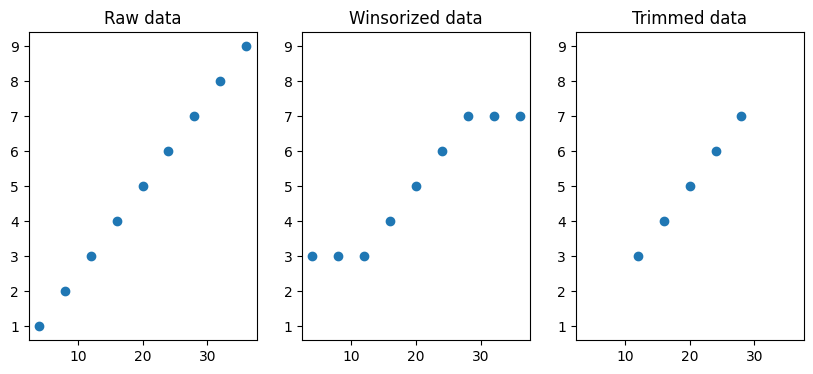

In [ ]:
#@title ✂️ Show ways of handling data with winsorizing and trimming
x = [4 * val for val in [1, 2, 3, 4, 5, 6, 7, 8, 9]]
y = [.25 * val for val in x]

fig = plt.figure(figsize=(10, 4))

ax1 = fig.add_subplot(1, 3, 1)
ax1.scatter(x, y)
ax1.title.set_text('Raw data')

ax2 = fig.add_subplot(1, 3, 2)
ax2.scatter(x, stats.mstats.winsorize(np.array(y), .25))
ax2.title.set_text('Winsorized data')
ax2.yaxis.set_major_locator(MaxNLocator(integer=True))
ax2.set_xlim(ax1.get_xlim())
ax2.set_ylim(ax1.get_ylim())

ax3 = fig.add_subplot(1, 3, 3)
ax3.scatter(x[2:-2], y[2:-2])
ax3.title.set_text('Trimmed data')
ax3.yaxis.set_major_locator(MaxNLocator(integer=True))
ax3.set_xlim(ax1.get_xlim())
ax3.set_ylim(ax1.get_ylim())

plt.show()

In [ ]:
#@title ⚕️ Winsorizing
df4 = df.copy().dropna()
df4['y'] = stats.mstats.winsorize(df4['y'], limits=(0, .05), axis=0)

plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], c='r', alpha=.5, marker='x', s=30)
plt.scatter(x=df4['ds'], y=df4['y'], c='#0072B2')
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Date')
plt.ylabel('Likes per photo')
plt.show()

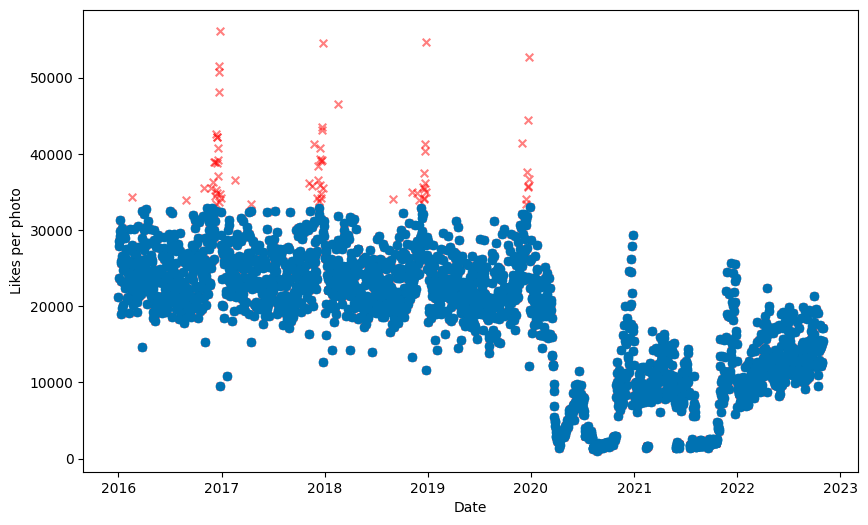

In [ ]:
#@title 🚐 Filtering based on STD and z-score
df5 = df.copy().dropna()
df5 = df5[(stats.zscore(df5['y']) < 1.65)]
plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], c='r', alpha=.5, marker='x', s=30)
plt.scatter(x=df5['ds'], y=df5['y'], c='#0072B2')
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Date')
plt.ylabel('Likes per photo')
plt.show()

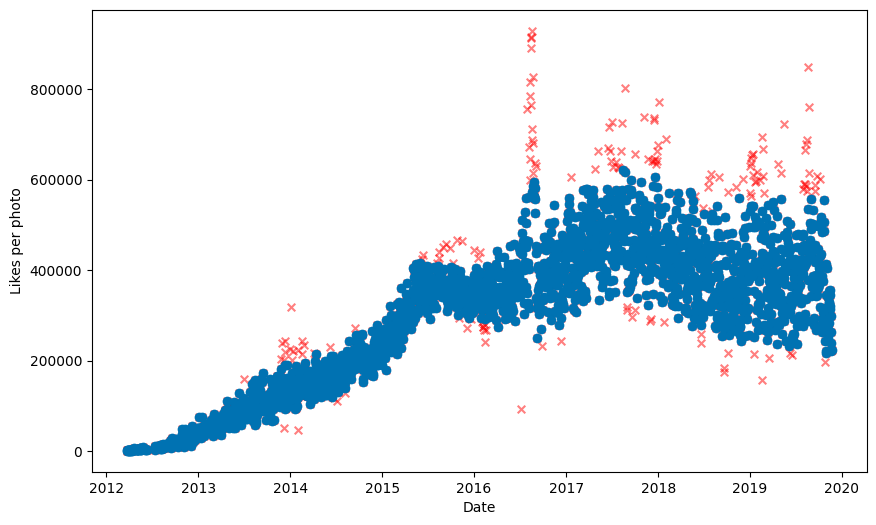

In [ ]:
#@title 🌬️ Moving average filtering
df6 = df.copy().dropna()

df6['moving_average'] = df6.rolling(window=300,
                                    min_periods=1,
                                    center=True,
                                    on='ds')['y'].mean()
df6['std_dev'] = df6.rolling(window=300,
                             min_periods=1,
                             center=True,
                             on='ds')['y'].std()
df6['lower'] = df6['moving_average'] - 1.65 * df6['std_dev']
df6['upper'] = df6['moving_average'] + 1.65 * df6['std_dev']

df6 = df6[(df6['y'] < df6['upper']) & (df6['y'] > df6['lower'])]
plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], c='r', alpha=.5, marker='x', s=30)
plt.scatter(x=df6['ds'], y=df6['y'], c='#0072B2')
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Date')
plt.ylabel('Likes per photo')
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


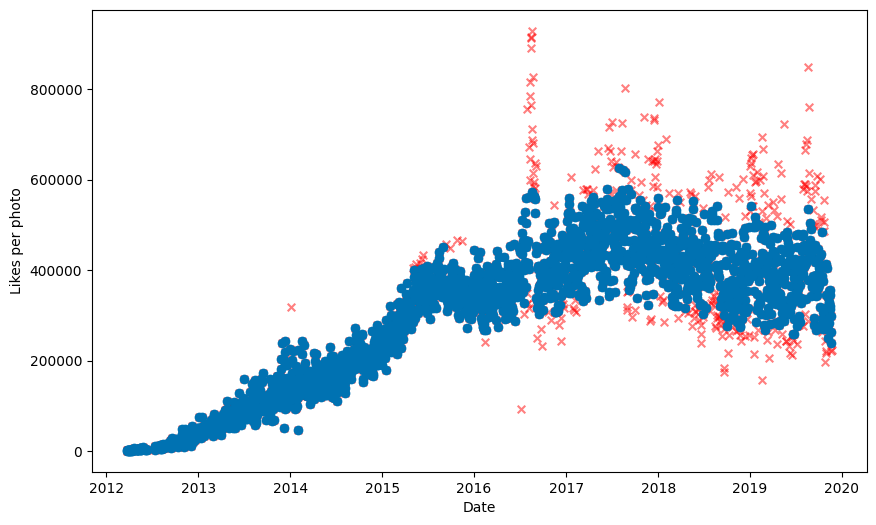

In [ ]:
#@title ⚟ Fitting model to highlight outliers based on confidence intervals
df7 = df.copy().dropna().reset_index()
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=6,
                seasonality_prior_scale=.01,
                changepoint_prior_scale=.01,
                interval_width=.90)
model.fit(df7)
forecast = model.predict()

df8 = df7[(df7['y'] > forecast['yhat_lower']) &
         (df7['y'] < forecast['yhat_upper'])]
plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], c='r', alpha=.5, marker='x', s=30)
plt.scatter(x=df8['ds'], y=df8['y'], c='#0072B2')
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Date')
plt.ylabel('Likes per photo')
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


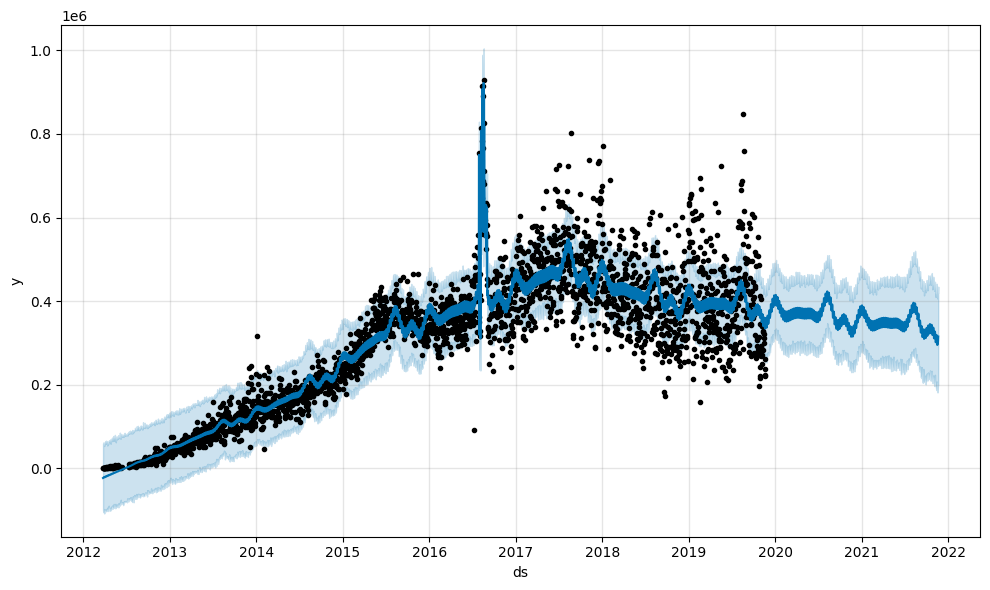

In [ ]:
#@title 🎉 Adding two promo events
promo = pd.DataFrame({'holiday': 'Promo event',
                      'ds' : pd.to_datetime(['2016-07-29']),
                      'lower_window': 0,
                      'upper_window': 34})
future_promo = pd.DataFrame({'holiday': 'Promo event',
                      'ds' : pd.to_datetime(['2020-06-01']),
                      'lower_window': 0,
                      'upper_window': 34})

promos = pd.concat([promo, future_promo])

model = Prophet(seasonality_mode='multiplicative',
                holidays=promo,
                yearly_seasonality=6)
model.fit(df)
future = model.make_future_dataframe(periods=365 * 2)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()


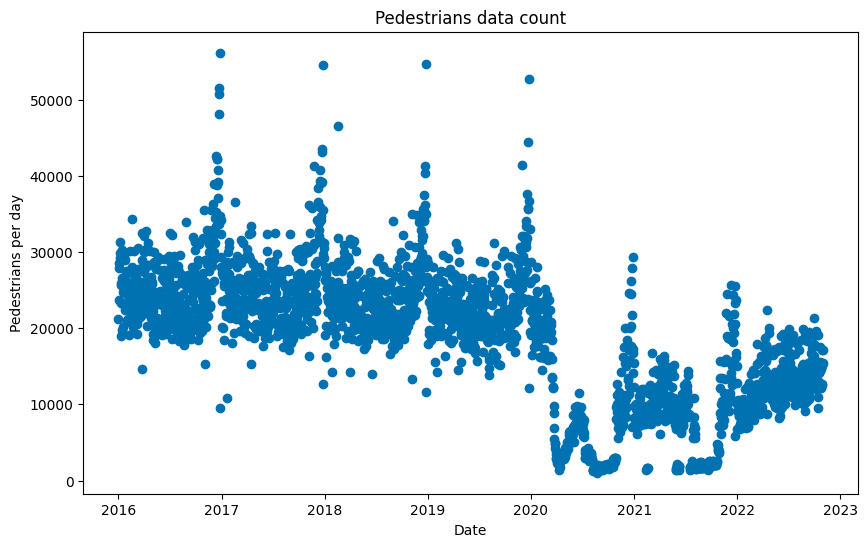

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


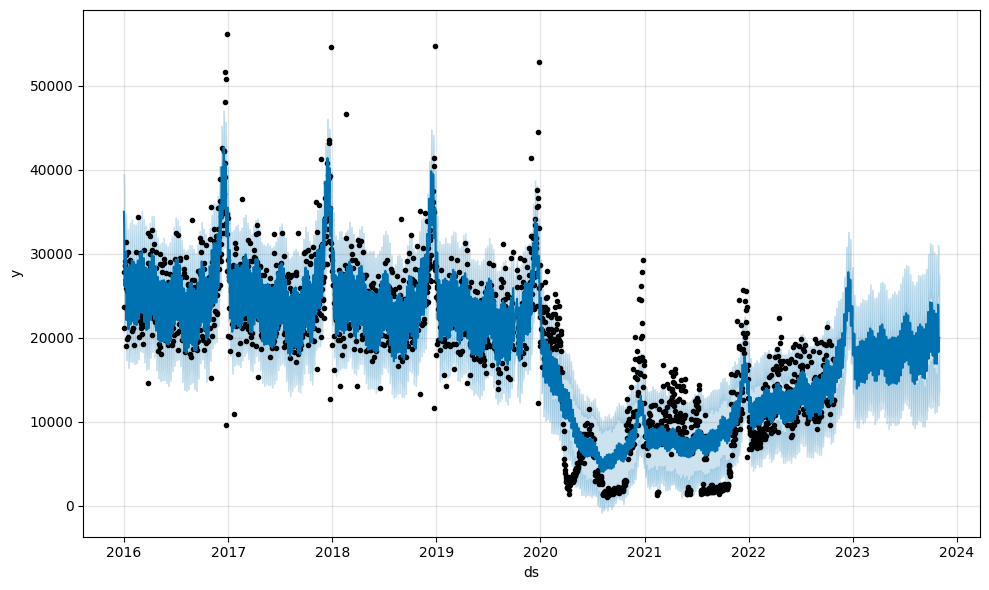

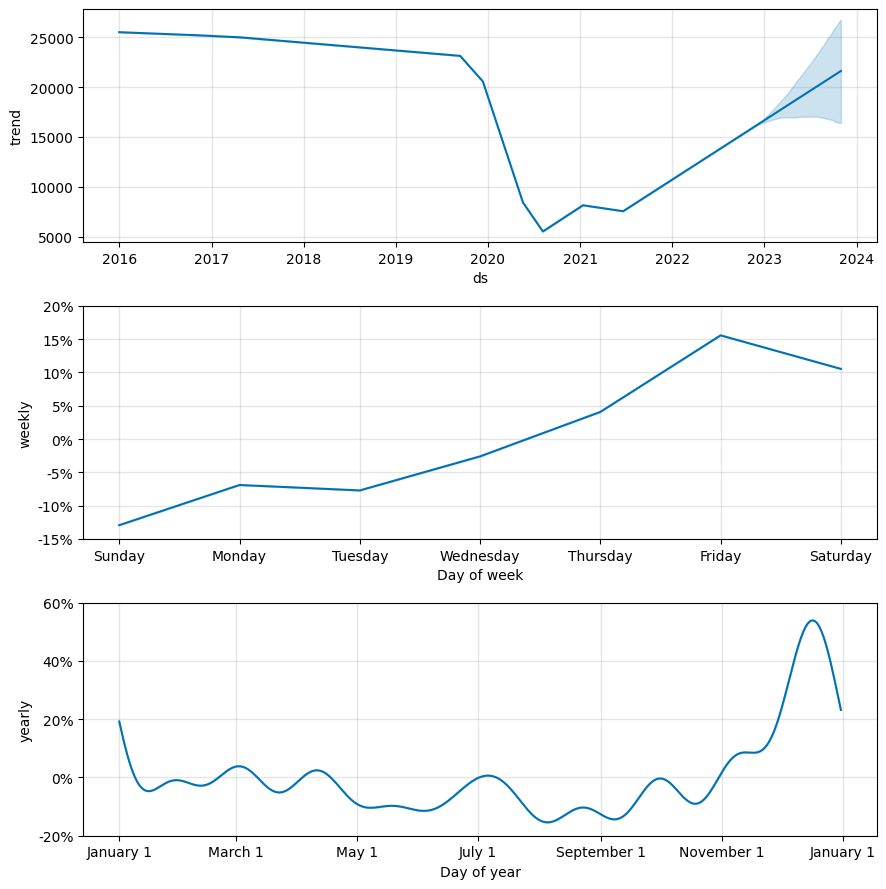

In [ ]:
#@title 🚶 Load Pedestrian Counts data and fit default Prophet
df = pd.read_csv('pedestrian_counts.csv')
df['Date'] = pd.to_datetime(df['Date'])
plt.figure(figsize=(10, 6))
plt.scatter(x=df['Date'],
            y=df['Daily_Counts'],
            c='#0072B2')
plt.xlabel('Date')
plt.ylabel('Pedestrians per day')
plt.title('Pedestrians data count')
plt.show()

df = df[['Date', 'Daily_Counts']]
df.columns = ['ds', 'y']
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

fig2 = model.plot_components(forecast)
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


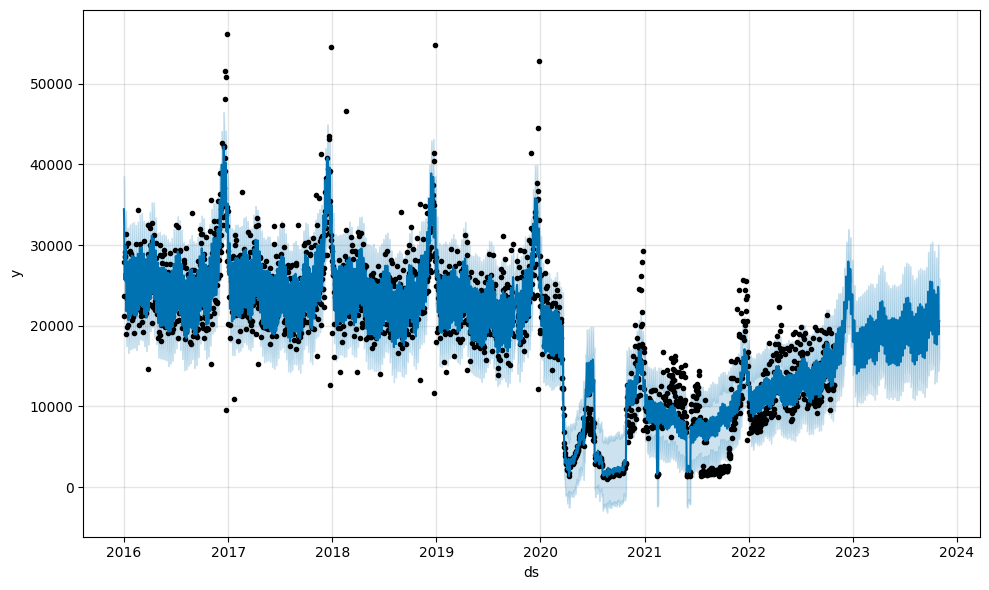

In [ ]:
#@title 🔒 Implement 'lockdown holidays' with different upper_window based on how long the lockdown was
lockdowns = pd.DataFrame([
    {'holiday':'lockdown1',
     'ds': pd.to_datetime('2020-03-21'),
     'lower_window': 0,
     'upper_window': 77},
    {'holiday':'lockdown2',
     'ds': pd.to_datetime('2020-07-09'),
     'lower_window': 0,
     'upper_window': 110},
    {'holiday':'lockdown3',
     'ds': pd.to_datetime('2021-02-13'),
     'lower_window': 0,
     'upper_window': 4},
    {'holiday':'lockdown4',
     'ds': pd.to_datetime('2021-05-28'),
     'lower_window': 0,
     'upper_window': 13}])

model = Prophet(seasonality_mode='multiplicative',
                holidays=lockdowns)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

fig2 = model.plot_components(forecast)
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


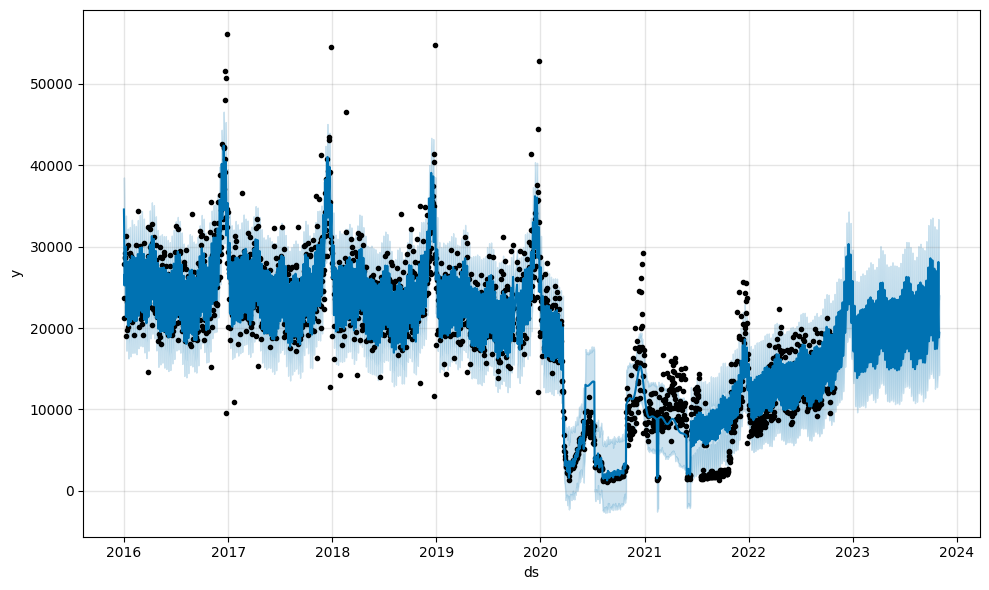

In [ ]:
#@title 🤧 Implement data pre and post covid in the `df` to have separate seasonalities for those
df['pre_covid'] = df['ds'] < '2020-03-21'
df['post_covid'] = df['ds'] > '2021-06-10'
model = Prophet(seasonality_mode='multiplicative',
                weekly_seasonality=False,
                holidays=lockdowns)
model.add_seasonality(
    name='weekly_pre_covid',
    period=7,
    fourier_order=3,
    condition_name='pre_covid',
)
model.add_seasonality(
    name='weekly_post_covid',
    period=7,
    fourier_order=3,
    condition_name='post_covid',
)
model.fit(df)
future = model.make_future_dataframe(periods=365)
future['pre_covid'] = future['ds'] < '2020-03-21'
future['post_covid'] = future['ds'] > '2021-06-10'
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

fig2 = model.plot_components(forecast)
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


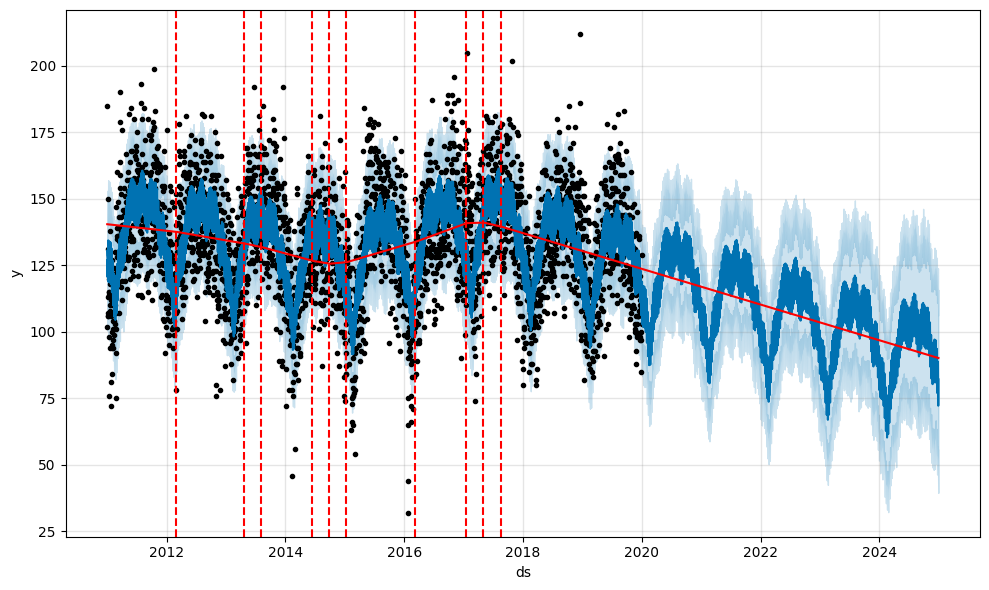

In [ ]:
#@title 🔫 Load Baltimore Crimes data and fit model with `uncertainty_samples=1000` and removed outliers
df = pd.read_csv('baltimore_crime.csv')
df.columns = ['ds', 'y']

df.loc[df['y'] > 250, 'y'] = None

model = Prophet(uncertainty_samples=1000)
model.fit(df)
future = model.make_future_dataframe(periods=365 * 5)
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()

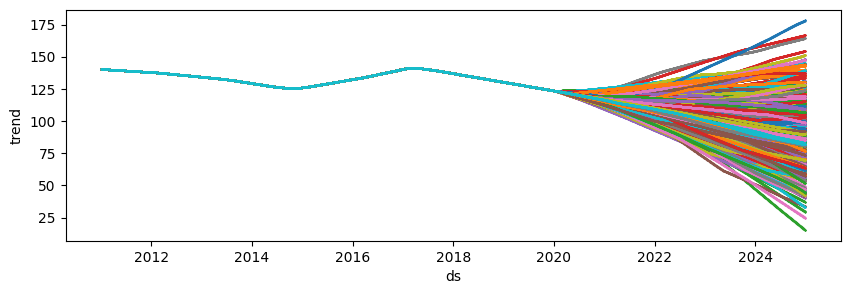

In [ ]:
#@title ⚞ `Predictive_samples` preview
# Saving for use later
m0 = model
f0 = forecast
samples = model.predictive_samples(future)
samples = model.predictive_samples(future)

plt.figure(figsize=(10, 3))
for idx in range(model.uncertainty_samples):
    plt.scatter(future['ds'], samples['trend'][:, idx], s=.1, alpha=1)
plt.xlabel('ds')
plt.ylabel('trend')
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


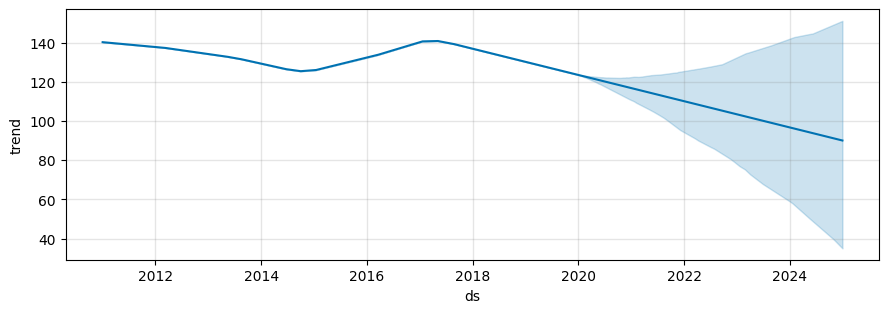

In [ ]:
#@title 📂 Use `interval_width` within default Prophet setup
model = Prophet(interval_width=0.99)
model.fit(df)
future = model.make_future_dataframe(periods=365 * 5)
forecast = model.predict(future)

plot_forecast_component(model,
                        forecast,
                        'trend',
                        figsize=(10.5, 3.25))
plt.show()

In [ ]:
#@title 🎲 Use `mcmc_samples=300` and impact on component intervals
model = Prophet(mcmc_samples=300)
model.fit(df)
future = model.make_future_dataframe(periods=365 * 5)
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()
fig2 = model.plot_components(forecast)
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


chain 1:   0%|          | 0/300 [00:00<?, ?it/s, (Warmup)]

chain 2:   0%|          | 0/300 [00:00<?, ?it/s, (Warmup)]

chain 3:   0%|          | 0/300 [00:00<?, ?it/s, (Warmup)]

chain 4:   0%|          | 0/300 [00:00<?, ?it/s, (Warmup)]

ERROR:cmdstanpy:Chain [1] error: code '-2' Unknown error -2
ERROR:cmdstanpy:Chain [2] error: code '-2' Unknown error -2
ERROR:cmdstanpy:Chain [4] error: code '1' Operation not permitted
ERROR:cmdstanpy:Chain [3] error: code '1' Operation not permitted


KeyboardInterrupt: 

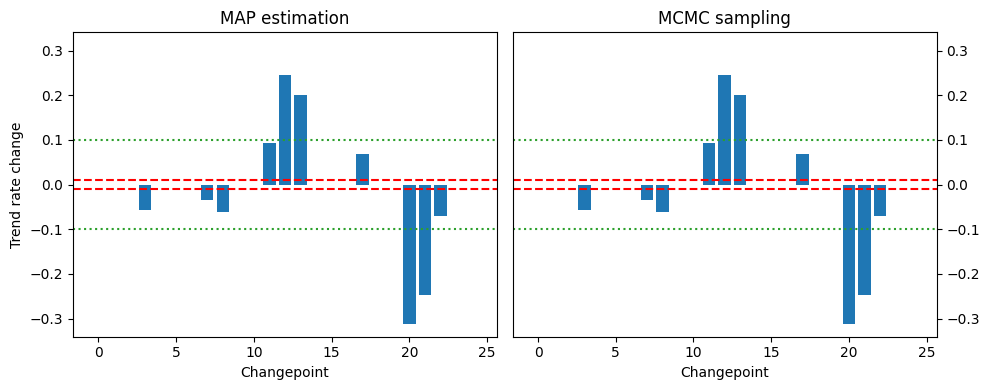

In [ ]:
#@title 🧪 Params at changepoints depending on MCMC or MAP

fig = plt.figure(figsize=(10, 4))

ax1 = fig.add_subplot(121)
ax1.bar(np.arange(25), np.nanmean(m0.params['delta'], axis=0))
ax1.set_title('MAP estimation')
ax1.set_xlabel('Changepoint')
ax1.set_ylabel('Trend rate change')
ax1.axhline(y=0.01, color='r', ls='--')
ax1.axhline(y=-0.01, color='r', ls='--')
ax1.axhline(y=0.1, color='tab:green', ls=':')
ax1.axhline(y=-0.1, color='tab:green', ls=':')

ax2 = fig.add_subplot(122)
ax2.bar(np.arange(25), np.nanmean(model.params['delta'], axis=0))
ax2.set_xlabel('Changepoint')
ax2.axhline(y=0.01, color='r', ls='--')
ax2.axhline(y=-0.01, color='r', ls='--')
ax2.axhline(y=0.1, color='tab:green', ls=':')
ax2.axhline(y=-0.1, color='tab:green', ls=':')
ax2.set_title('MCMC sampling')
ax2.yaxis.tick_right()

ylim = max([abs(val) for val in ax1.get_ylim() + ax2.get_ylim()])
ax1.set_ylim(-ylim, ylim)
ax2.set_ylim(-ylim, ylim)

plt.tight_layout()
plt.show()

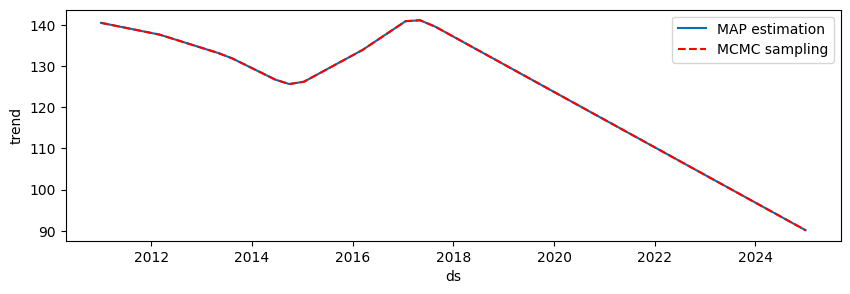

In [ ]:
#@title 🦅 Forecast: MCMC vs MAP
plt.figure(figsize=(10, 3))

plt.plot(f0['ds'], f0['trend'], color='#0072B2', label='MAP estimation')

plt.plot(forecast['ds'], forecast['trend'], color='r', ls='--', label='MCMC sampling')

plt.ylabel('trend')
plt.xlabel('ds')
plt.legend()
plt.show()

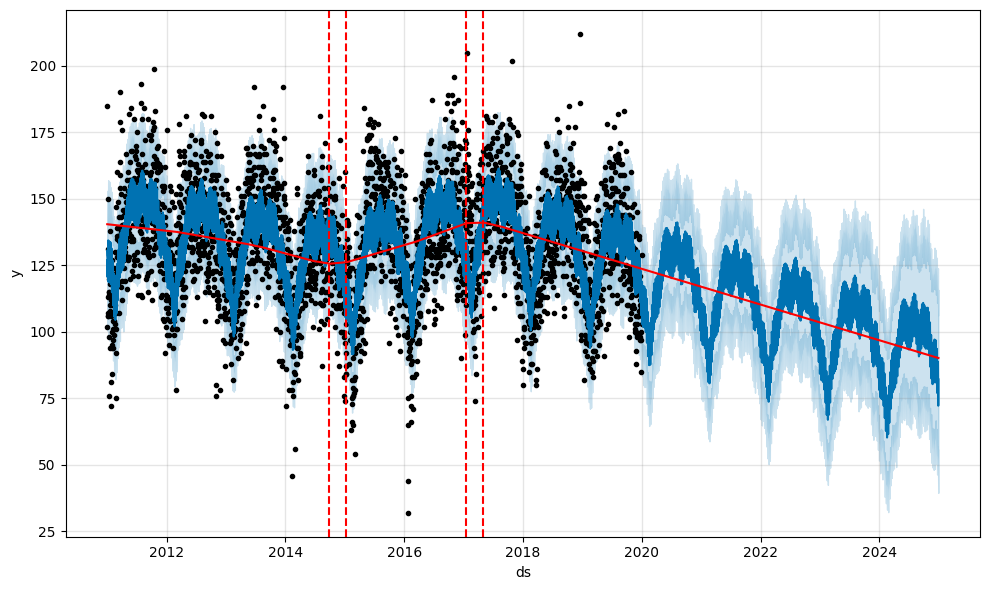

In [ ]:
#@title 🥃 Plot model forecast
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, threshold=0.1)
plt.show()
# Saving for use later
m1 = model
f1 = forecast

In [ ]:
#@title 👴 Fit Prophet with MCMC and `changepoint_prior_scale`
model = Prophet(changepoint_prior_scale=0.03,
                mcmc_samples=300)
model.fit(df)
future = model.make_future_dataframe(periods=365 * 5)
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast, threshold=0.1)
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


chain 1:   0%|          | 0/300 [00:00<?, ?it/s, (Warmup)]

chain 2:   0%|          | 0/300 [00:00<?, ?it/s, (Warmup)]

chain 3:   0%|          | 0/300 [00:00<?, ?it/s, (Warmup)]

chain 4:   0%|          | 0/300 [00:00<?, ?it/s, (Warmup)]

ERROR:cmdstanpy:Chain [1] error: code '-2' Unknown error -2
ERROR:cmdstanpy:Chain [2] error: code '-2' Unknown error -2
ERROR:cmdstanpy:Chain [3] error: code '1' Operation not permitted
ERROR:cmdstanpy:Chain [4] error: code '1' Operation not permitted


KeyboardInterrupt: 

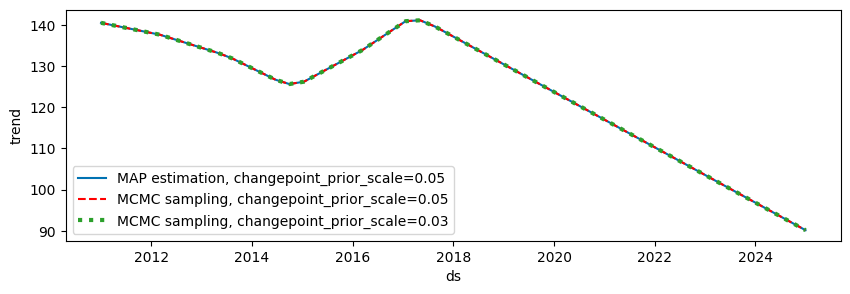

In [ ]:
#@title ✅ MAP x MCMC and different `changepoint_prior_scale` setup
plt.figure(figsize=(10, 3))

plt.plot(f0['ds'],
         f0['trend'],
         color='#0072B2',
         label='MAP estimation, changepoint_prior_scale=0.05')

plt.plot(f1['ds'],
         f1['trend'],
         color='r',
         ls='--',
         label='MCMC sampling, changepoint_prior_scale=0.05')

plt.plot(forecast['ds'],
         forecast['trend'],
         color='tab:green',
         ls=':',
         lw=3,
         label='MCMC sampling, changepoint_prior_scale=0.03')

plt.ylabel('trend')
plt.xlabel('ds')
plt.legend()
plt.show()

In [ ]:
#@title 🏪 Load Online Retail data
df = pd.read_csv('online_retail.csv')
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

plt.figure(figsize=(10, 6))
plt.scatter(df['ds'], df['y'])
plt.xlabel('Date')
plt.ylabel('Total daily sales (£)')
plt.show()

In [ ]:
#@title 👛 Fit model with `yearly_seasonality=4`
model = Prophet(yearly_seasonality=4)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()
fig2 = model.plot_components(forecast)
plt.show()


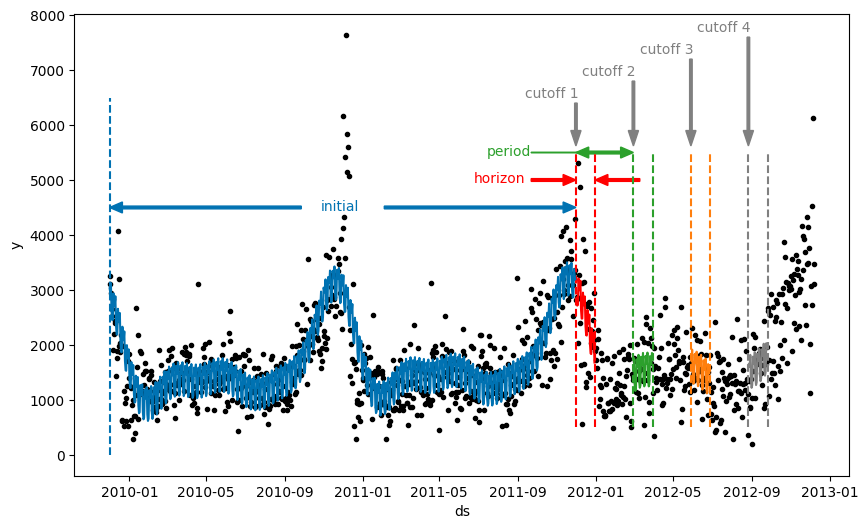

In [ ]:
#@title 🧻 Visualize rolling cross-validation
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], 'k.')
plt.vlines([df['ds'][730], df['ds'][760]], 500, 5500, colors='r', linestyles='--')
plt.vlines([df['ds'][820], df['ds'][850]], 500, 5500, colors='tab:green', linestyles='--')
plt.vlines([df['ds'][910], df['ds'][940]], 500, 5500, colors='tab:orange', linestyles='--')
plt.vlines([df['ds'][1000], df['ds'][1030]], 500, 5500, colors='gray', linestyles='--')
plt.vlines([df['ds'][0]], 0, 6500, colors='#0072B2', linestyles='--')

plt.plot(forecast[forecast['ds'] < df['ds'][730]]['ds'],
         forecast[forecast['ds'] < df['ds'][730]]['yhat'],
         c='#0072B2')

plt.plot(forecast[(forecast['ds'] < df['ds'][760]) &
                  (forecast['ds'] > df['ds'][730])]['ds'],
         forecast[(forecast['ds'] < df['ds'][760]) &
                  (forecast['ds'] > df['ds'][730])]['yhat'], c='r')

plt.plot(forecast[(forecast['ds'] < df['ds'][850]) &
                  (forecast['ds'] > df['ds'][820])]['ds'],
         forecast[(forecast['ds'] < df['ds'][850]) &
                  (forecast['ds'] > df['ds'][820])]['yhat'], c='tab:green')

plt.plot(forecast[(forecast['ds'] < df['ds'][940]) &
                  (forecast['ds'] > df['ds'][910])]['ds'],
         forecast[(forecast['ds'] < df['ds'][940]) &
                  (forecast['ds'] > df['ds'][910])]['yhat'], c='tab:orange')

plt.plot(forecast[(forecast['ds'] < df['ds'][1030]) &
                  (forecast['ds'] > df['ds'][1000])]['ds'],
         forecast[(forecast['ds'] < df['ds'][1030]) &
                  (forecast['ds'] > df['ds'][1000])]['yhat'], c='gray')

plt.arrow(df['ds'][660], 5000, 50, 0, width=50, head_width=200, head_length=20, color='r')
plt.arrow(df['ds'][830], 5000, -50, 0, width=50, head_width=200, head_length=20, color='r')
plt.text(df['ds'][570], 4950, 'horizon', color='r')

plt.arrow(df['ds'][660], 5500, 140, 0, width=10, head_width=200, head_length=20, color='tab:green')
plt.arrow(df['ds'][800], 5500, -50, 0, width=50, head_width=200, head_length=20, color='tab:green')
plt.text(df['ds'][590], 5450, 'period', color='tab:green')

plt.arrow(df['ds'][730], 6400, 0, -500, width=4, head_width=16, head_length=280, color='gray')
plt.text(df['ds'][650], 6500, 'cutoff 1', color='gray')

plt.arrow(df['ds'][820], 6800, 0, -900, width=4, head_width=16, head_length=280, color='gray')
plt.text(df['ds'][740], 6900, 'cutoff 2', color='gray')

plt.arrow(df['ds'][910], 7200, 0, -1300, width=4, head_width=16, head_length=280, color='gray')
plt.text(df['ds'][830], 7300, 'cutoff 3', color='gray')

plt.arrow(df['ds'][1000], 7600, 0, -1700, width=4, head_width=16, head_length=280, color='gray')
plt.text(df['ds'][920], 7700, 'cutoff 4', color='gray')

plt.arrow(df['ds'][300], 4500, -280, 0, width=50, head_width=200, head_length=20, color='#0072B2')
plt.arrow(df['ds'][430], 4500, 280, 0, width=50, head_width=200, head_length=20, color='#0072B2')
plt.text(df['ds'][330], 4450, 'initial', color='#0072B2')

plt.xlabel('ds')
plt.ylabel('y')

plt.show()

In [ ]:
#@title ⛰️ Run rolling `cross_validation`
df_cv = cross_validation(model,
                         horizon='90 days',
                         period='30 days',
                         initial='730 days')

print(f"Unique cutoffs: {df_cv.cutoff.unique}")
display(df_cv)

INFO:prophet:Making 10 forecasts with cutoffs between 2011-12-14 00:00:00 and 2012-09-09 00:00:00


  0%|          | 0/10 [00:00<?, ?it/s]

Unique cutoffs: <bound method Series.unique of 0     2011-12-14
1     2011-12-14
2     2011-12-14
3     2011-12-14
4     2011-12-14
         ...    
895   2012-09-09
896   2012-09-09
897   2012-09-09
898   2012-09-09
899   2012-09-09
Name: cutoff, Length: 900, dtype: datetime64[ns]>


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2011-12-15,2801.202360,2094.354594,3548.192904,3702.986147,2011-12-14
1,2011-12-16,2352.319098,1615.927341,3045.844246,1229.263629,2011-12-14
2,2011-12-17,2182.374126,1485.193869,2912.839142,1325.415023,2011-12-14
3,2011-12-18,2165.463230,1473.760510,2866.240342,2739.454215,2011-12-14
4,2011-12-19,2636.148978,1935.912791,3347.858182,2699.823386,2011-12-14
...,...,...,...,...,...,...
895,2012-12-04,3107.791500,2415.458859,3805.579991,2726.403434,2012-09-09
896,2012-12-05,3022.979755,2381.161648,3720.314438,4528.532962,2012-09-09
897,2012-12-06,3173.204390,2484.391628,3829.947536,6125.495419,2012-09-09
898,2012-12-07,2672.853949,1992.718299,3317.877642,3476.642731,2012-09-09


In [ ]:
#@title 🚆 Running same cross_validation, but with parallel execution
df_cv = cross_validation(model,
                         horizon='90 days',
                         period='30 days',
                         initial='730 days',
                         parallel='processes')

INFO:prophet:Making 10 forecasts with cutoffs between 2011-12-14 00:00:00 and 2012-09-09 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7e236eea0560>
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt



INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


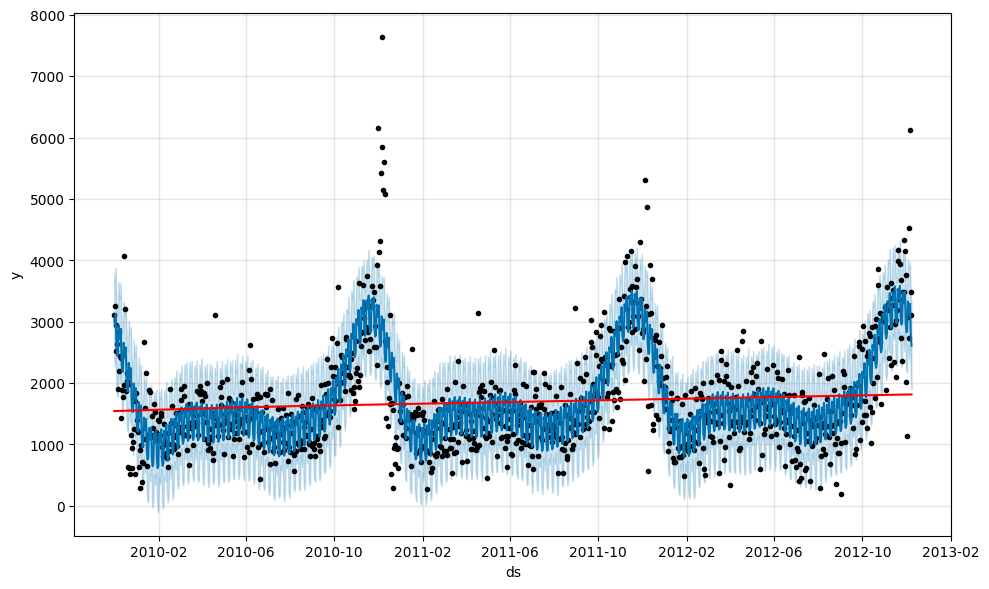

INFO:prophet:Making 10 forecasts with cutoffs between 2011-12-14 00:00:00 and 2012-09-09 00:00:00


  0%|          | 0/10 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/prophet/plot.py:547: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  x_plt = df_none['horizon'].astype('timedelta64[ns]').view(np.int64) / float(dt_conversions[i])
/usr/local/lib/python3.12/dist-packages/prophet/plot.py:548: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  x_plt_h = df_h['horizon'].astype('timedelta64[ns]').view(np.int64) / float(dt_conversions[i])


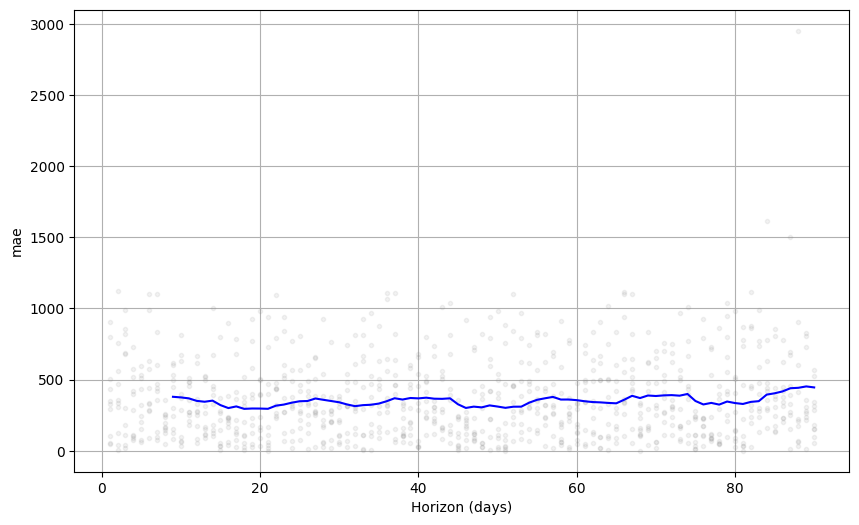

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


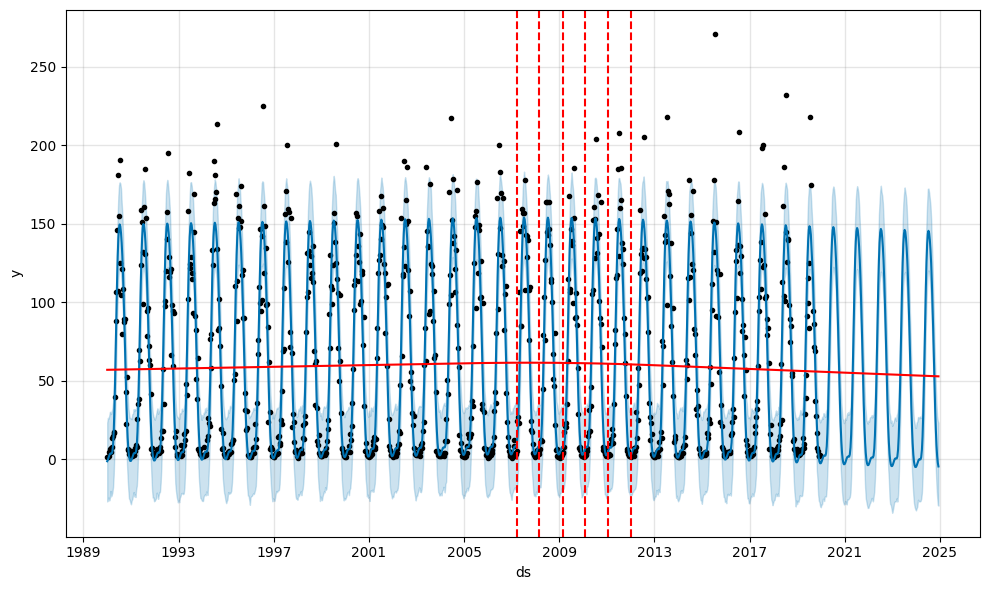

INFO:prophet:Making 302 forecasts with cutoffs between 1995-01-01 00:00:00 and 2019-09-22 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7e237d9f4aa0>


KeyboardInterrupt: 

In [ ]:
df = pd.read_csv('online_retail.csv')
df.columns = ['ds', 'y']

model = Prophet(yearly_seasonality=4)
model.fit(df)
forecast = model.predict()
fig = model.plot(forecast)
add_changepoints_to_plot(fig.gca(), model, forecast)
plt.title("Forecasts for the online retail")
plt.show()

df_cv = cross_validation(model,
                         horizon='90 days',
                         period='30 days',
                         initial='730 days')

df_p = performance_metrics(df_cv)
df_p.head()

fig = plot_cross_validation_metric(df_cv, metric='mae')
plt.title("MAE plot for the Online Retail Cross-Validation ")
plt.show()


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


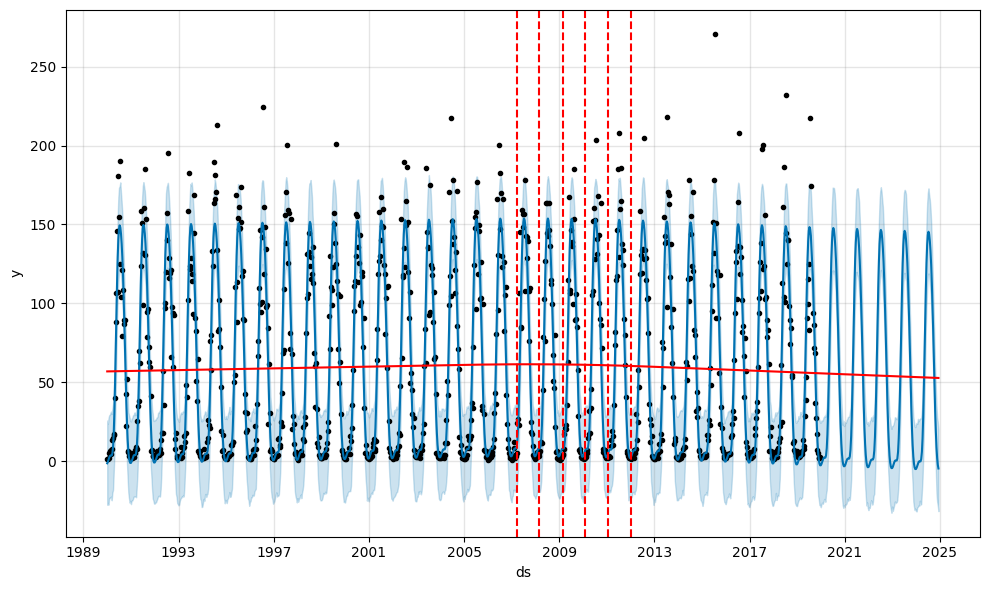

INFO:prophet:Making 302 forecasts with cutoffs between 1995-01-01 00:00:00 and 2019-09-22 00:00:00


  0%|          | 0/302 [00:00<?, ?it/s]

Performance metrics for the rainfall data


,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,9 days,427.678191,20.680382,13.505014,0.580577,0.296679,0.416780,0.835206
1,10 days,405.274912,20.131441,13.176850,0.589047,0.305178,0.424746,0.845740
2,11 days,374.601776,19.354632,12.508375,0.581946,0.297327,0.422017,0.862092
3,12 days,389.421355,19.733762,12.724187,0.574307,0.294623,0.418625,0.858427
4,13 days,439.574185,20.966025,13.381433,0.589163,0.310571,0.426939,0.847046
...,...,...,...,...,...,...,...,...
77,86 days,442.094830,21.026051,14.332627,0.681626,0.347035,0.467970,0.827715
78,87 days,461.779695,21.489060,14.287322,0.638113,0.317541,0.447272,0.827199
79,88 days,486.133667,22.048439,14.487622,0.654991,0.317541,0.453852,0.828418
80,89 days,506.305123,22.501225,14.684777,0.611395,0.316929,0.426108,0.833099


/usr/local/lib/python3.12/dist-packages/prophet/plot.py:547: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  x_plt = df_none['horizon'].astype('timedelta64[ns]').view(np.int64) / float(dt_conversions[i])
/usr/local/lib/python3.12/dist-packages/prophet/plot.py:548: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  x_plt_h = df_h['horizon'].astype('timedelta64[ns]').view(np.int64) / float(dt_conversions[i])


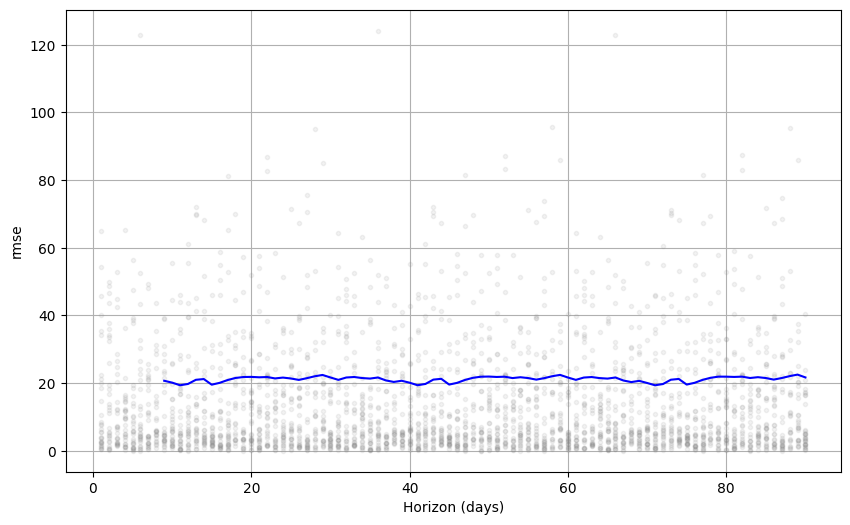

In [ ]:
#@title 🌧️ Rainfall data and cross-validation
df = pd.read_csv('rainfall.csv')
df.columns = ['ds', 'y']

model = Prophet(yearly_seasonality=4)
model.fit(df)
future = model.make_future_dataframe(periods=365 * 5)
future = future[future['ds'].dt.day.isin([1, 11, 21])]
forecast = model.predict(future)
fig = model.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), model, forecast)
plt.show()

df_cv = cross_validation(model,
                         horizon='90 days',
                         period='30 days',
                         initial='1826 days')
df_p = performance_metrics(df_cv)
print("Performance metrics for the rainfall data")
display(df_p)
fig = plot_cross_validation_metric(df_cv, metric='rmse')
plt.show()

In [ ]:
#@title ⛏️ Specify cutoffs manually
cutoffs = [pd.Timestamp('{}-{}-{}'.format(year, month, day))
           for year in range(2005, 2019)
           for month in range(1, 13)
           for day in [1, 11, 21]]
df_cv = cross_validation(model,
                         horizon='90 days',
                         parallel='processes',
                         cutoffs=cutoffs)
df_p = performance_metrics(df_cv)
fig = plot_cross_validation_metric(df_cv, metric='rmse')
plt.title("Cross validation RMSE across horizons")
plt.show()

In [ ]:
#@title 🕸️ Basic HPtuning with `cross_validation`
param_grid = {'changepoint_prior_scale': [0.5, 0.1, 0.01, 0.001],
              'seasonality_prior_scale': [10.0, 1.0, 0.1, 0.01],
              'seasonality_mode': ['additive', 'multiplicative']}

all_params = [dict(zip(param_grid.keys(), value))
              for value in itertools.product(*param_grid.values())]
rmse_values= []

cutoffs = [pd.Timestamp('{}-{}-{}'.format(year, month, day))
           for year in range(2010, 2019)
           for month in range(1, 13)
           for day in [1, 11, 21]]
for params in all_params:
    model = Prophet(yearly_seasonality=4, **params).fit(df)
    df_cv = cross_validation(model,
                             cutoffs=cutoffs,
                             horizon='30 days')
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmse_values.append(df_p['rmse'].values[0])

results = pd.DataFrame(all_params)
results['rmse'] = rmse_values
results.head()

best_params = all_params[np.argmin(rmse_values)]
print(best_params)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


  0%|          | 0/324 [00:00<?, ?it/s]

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


  0%|          | 0/324 [00:00<?, ?it/s]

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


  0%|          | 0/324 [00:00<?, ?it/s]

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


  0%|          | 0/324 [00:00<?, ?it/s]

KeyboardInterrupt: 

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


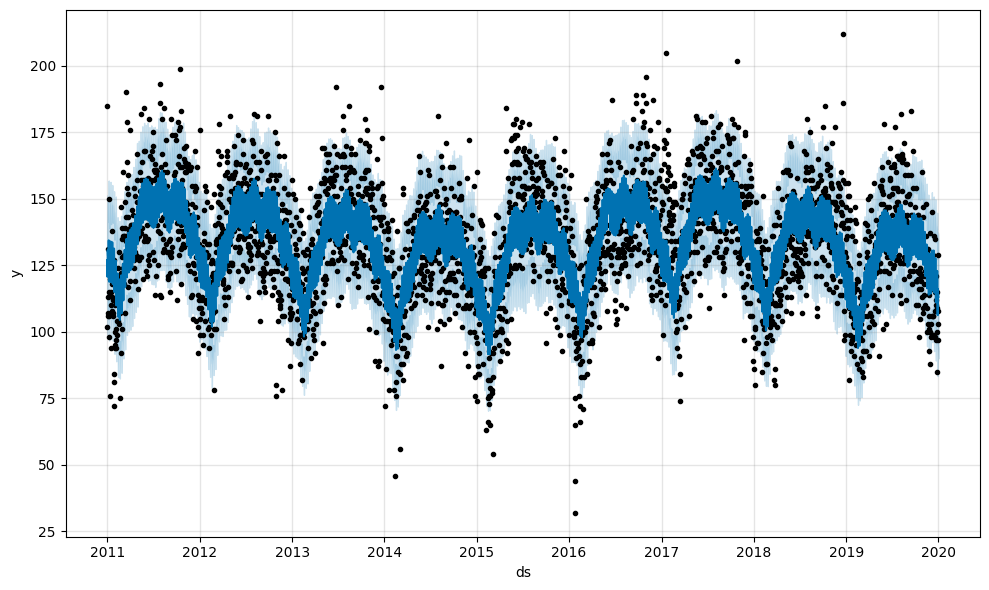

In [ ]:
#@title ♻️ Baltimore Crime data model JSON dump and reload
df = pd.read_csv('baltimore_crime.csv')
df.columns = ['ds', 'y']
df.loc[df['y'] > 250, 'y'] = None

model = Prophet()
model.fit(df)

with open('baltimore_crime_model.json', 'w') as file_out:
    json.dump(model_to_json(model), file_out)
with open('baltimore_crime_model.json', 'r') as file_in:
    model = model_from_json(json.load(file_in))

forecast = model.predict()
fig = model.plot(forecast)

In [ ]:
#@title 💡 Updating a fitted model
df_yesterday = df[df['ds'] < df['ds'].max()]
model1 = Prophet().fit(df_yesterday)
model2 = Prophet().fit(df)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
#@title 🥦 Fitting model with StanInit class and specified params

class StanInit:
    def __init__(self, model):
        self.params = {
            'k': np.mean(model.params['k']),
            'm': np.mean(model.params['m']),
            'sigma_obs': np.mean(model.params['sigma_obs']),
            'delta': np.mean(model.params['delta'], axis=0),
            'beta': np.mean(model.params['beta'], axis=0)
        }
    def __call__(self):
        return self.params

model2 = Prophet().fit(
    df,
    inits=StanInit(model1)())

model1 = Prophet().fit(df)
model2 = Prophet(mcmc_samples=200).fit(
    df,
    inits=StanInit(model1)())

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


chain 1:   0%|          | 0/200 [00:00<?, ?it/s, (Warmup)]

chain 2:   0%|          | 0/200 [00:00<?, ?it/s, (Warmup)]

chain 3:   0%|          | 0/200 [00:00<?, ?it/s, (Warmup)]

chain 4:   0%|          | 0/200 [00:00<?, ?it/s, (Warmup)]

ERROR:cmdstanpy:Chain [2] error: code '-2' Unknown error -2


KeyboardInterrupt: 

ERROR:cmdstanpy:Chain [1] error: code '-2' Unknown error -2
ERROR:cmdstanpy:Chain [3] error: code '1' Operation not permitted
ERROR:cmdstanpy:Chain [4] error: code '1' Operation not permitted


In [ ]:
#@title 🚛 Plotly animated plots

df = pd.read_csv('divvy_daily.csv')
df = df[['date', 'rides', 'temperature']]
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y', 'temp']
model = Prophet(seasonality_mode='multiplicative',
                yearly_seasonality=6)
model.add_regressor('temp')

model.fit(df[df['ds'] < df['ds'].max() - timedelta(weeks=2)])

future = model.make_future_dataframe(periods=14)
future['temp'] = df['temp']
forecast = model.predict(future)


fig = plot_plotly(model, forecast, trend=True)
fig.show()

fig = plot_components_plotly(model, forecast , figsize=(800, 175))
fig.show()

fig = plot_forecast_component_plotly(model, forecast, 'temp')
fig.show()

fig = plot_seasonality_plotly(model, 'yearly')
fig.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


/usr/local/lib/python3.12/dist-packages/plotly/io/_json.py:560: UserWarning:

Discarding nonzero nanoseconds in conversion.



/usr/local/lib/python3.12/dist-packages/plotly/io/_json.py:560: UserWarning:

Discarding nonzero nanoseconds in conversion.

